In [121]:
!nvidia-smi

Wed Nov  1 10:13:53 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.92                 Driver Version: 545.92       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1050 Ti   WDDM  | 00000000:01:00.0  On |                  N/A |
| 40%   36C    P8              N/A /  75W |   1529MiB /  4096MiB |      3%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [122]:
# import the libraries
import torch, pdb, os
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm import tqdm # progress bar lib
import matplotlib.pyplot as plt

In [123]:
# visualization function
def show(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 X 784
  data = tensor.detach().cpu().view(-1,ch,*size) # detaching the tensor to the cpu
  grid = make_grid(data[:num], nrow=4).permute(1,2,0) # changing the shape of the dimensional grid from "ch x wh x hg" to "wh x hg x ch"
  plt.imshow(grid)
  # plt.savefig(f'{cur_step}.jpg', bbox_inches='tight')
  plt.show()

def save_img(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 X 784
  data = tensor.detach().cpu().view(-1,ch,*size) # detaching the tensor to the cpu
  grid = make_grid(data[:num], nrow=4).permute(1,2,0) # changing the shape of the dimensional grid from "ch x wh x hg" to "wh x hg x ch"
  plt.imshow(grid)
  plt.savefig(f'{cur_step}.jpg', bbox_inches='tight')
  # plt.show()

In [124]:
# setup of the main parameters and hyperparameters
epochs = 1000 # number of times that the network will be trained
cur_step = 0 # the current training batch
info_step = 1000 # at a determined info_step times, the current training will be show in the screen
mean_gen_loss = 0 # accumulate the generator loss
mean_disc_loss = 0 # accumulate the discriminator loss

z_dim = 64 # input of the generator (Latent space noise vector)
learning_rate = 0.00001
loss_func = nn.BCEWithLogitsLoss() # apply the activation function and the return the loss value

batch_size = 128 # how many images will be processed
device = 'cuda' # defines what will be the device used on training

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()), shuffle=True, batch_size=batch_size)

# number of steps in training = len(dataset) / batch_size = 60000 / 128 = 468,75 ~ 469

In [125]:
from torch.nn.modules.batchnorm import BatchNorm1d
# declare the models

# Generator Model
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        # always (input, output)
        genBlock(z_dim, h_dim), # 64 = 128
        genBlock(h_dim, h_dim*2), # 128 = 256
        genBlock(h_dim*2, h_dim*4), # 256 = 512
        genBlock(h_dim*4, h_dim*8), # 512 = 1024
        nn.Linear(h_dim*8, i_dim), # 1024 = 784 (28X28)
        nn.Sigmoid()
    )

  def forward(self, noise):
    return self.gen(noise)

def gen_noise(number, z_dim):
  ## function to produce noise random numbers to the generator
  return torch.randn(number, z_dim).to(device)

## Discriminator Model
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc = nn.Sequential(
        # always (input, output)
        discBlock(i_dim, h_dim*4), # 784 = 1024
        discBlock(h_dim*4, h_dim*2), # 1024 = 512 
        discBlock(h_dim*2, h_dim), # 512 = 256
        nn.Linear(h_dim, 1) # 256 = 1
    )

  def forward(self, image):
    return self.disc(image)

In [126]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=learning_rate)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=learning_rate)

In [127]:
print("Generator Structure")
gen

Generator Structure


Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [128]:
print("Discriminator Structure")
disc

Discriminator Structure


Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([6, 6, 8, 1, 4, 1, 0, 6, 2, 7])


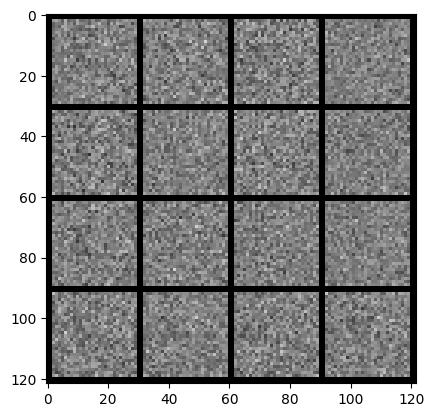

In [129]:
x,y = next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(batch_size, z_dim)
fake = gen(noise)
show(fake)

In [130]:
# Calculating the Loss

# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  # function to calculate the generate model loss
  noise = gen_noise(number, z_dim) # generate a probabilistic noise values
  fake = gen(noise) # generate a image with the noise
  pred = disc(fake) # pass it through the discriminator model, to predict if the image generated are next to real (real = trained database)
  targets = torch.ones_like(pred) # generate a structure like the predicted filled with ones

  gen_loss = loss_func(pred, targets) # caculate the loss between the prediction and the target

  return gen_loss

def calc_disc_loss(loss_func, gen, disc, number, real_img, z_dim):
  # function to calculate the discriminator model loss
  noise = gen_noise(number, z_dim) # generate a probabilistic noise values
  fake = gen(noise) # generate a image with the noise
  disc_fake = disc(fake.detach()) # pass it through the discriminator model with fake data
  disc_fake_targets = torch.zeros_like(disc_fake) # generate a structure like the predicted filled with zeros

  disc_fake_loss = loss_func(disc_fake, disc_fake_targets) # caculate the loss between the prediction and the target

  disc_real = disc(real_img) # pass it through the discriminator model with real data
  disc_real_targets = torch.ones_like(disc_real) # generate a structure like the predicted filled with ones

  disc_real_loss = loss_func(disc_real, disc_real_targets) # caculate the loss between the prediction and the target

  disc_loss = (disc_fake_loss + disc_real_loss) / 2

  return disc_loss

 13%|█████████████████████                                                                                                                                                | 60/469 [00:01<00:10, 38.96it/s]

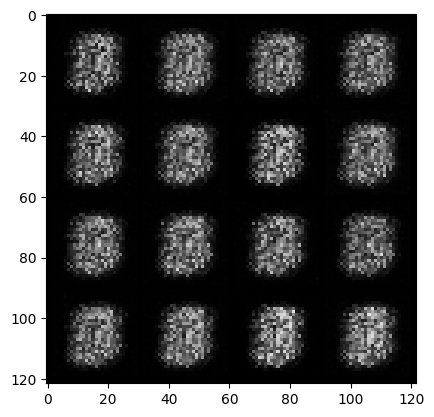

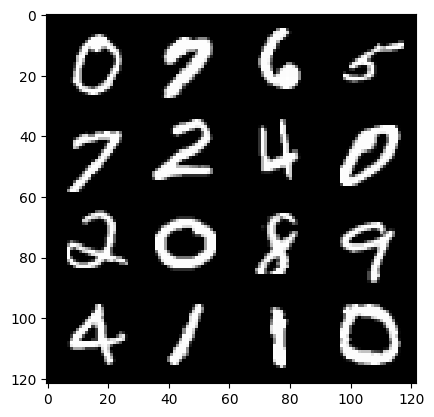

 14%|███████████████████████▉                                                                                                                                             | 68/469 [00:02<00:12, 33.22it/s]

2: step 1000 / Gen Loss: 0.15410548107512315 / Disc Loss: 0.15410548107512315


 26%|███████████████████████████████████████████▎                                                                                                                        | 124/469 [00:03<00:10, 32.04it/s]

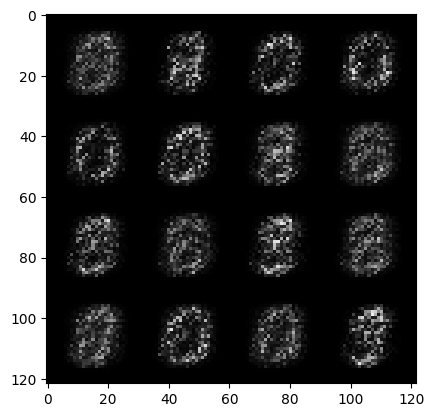

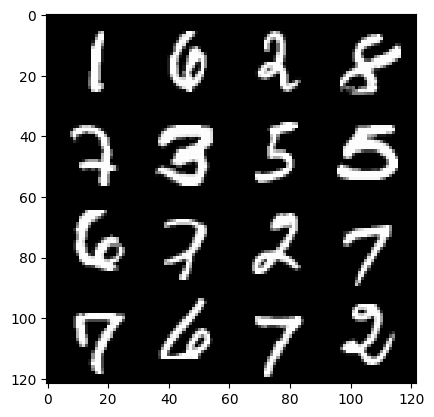

 27%|████████████████████████████████████████████▊                                                                                                                       | 128/469 [00:04<00:11, 29.57it/s]

4: step 2000 / Gen Loss: 0.04272472721152007 / Disc Loss: 0.04272472721152007


 39%|████████████████████████████████████████████████████████████████▋                                                                                                   | 185/469 [00:04<00:07, 40.38it/s]

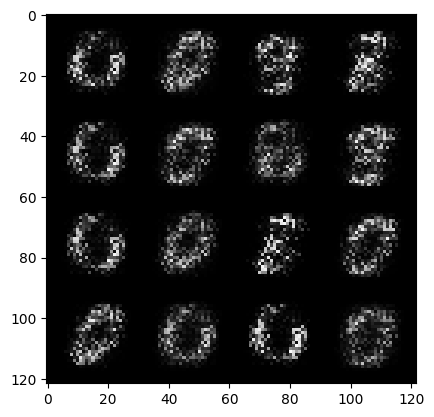

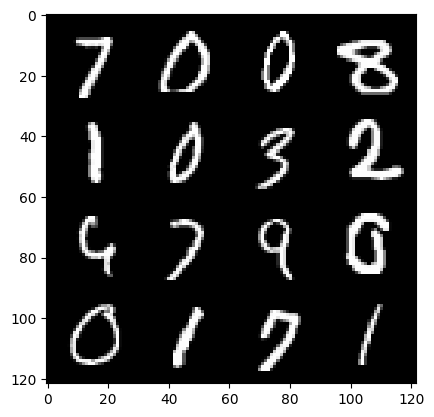

 42%|████████████████████████████████████████████████████████████████████▏                                                                                               | 195/469 [00:05<00:07, 38.05it/s]

6: step 3000 / Gen Loss: 0.03279939040355381 / Disc Loss: 0.03279939040355381


 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 248/469 [00:06<00:05, 38.77it/s]

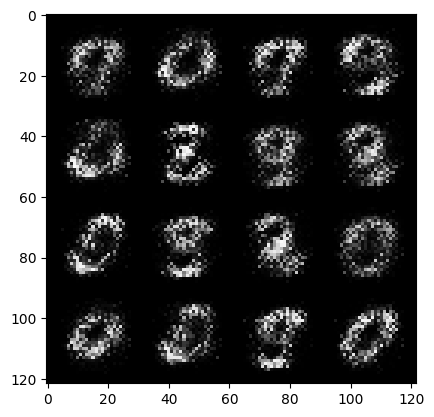

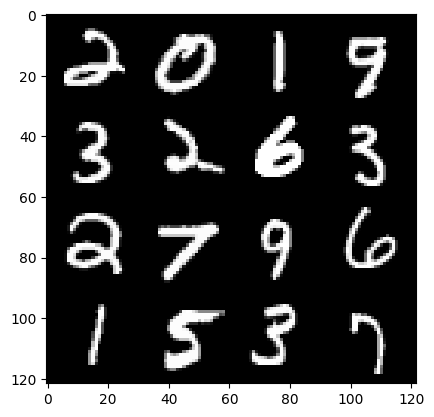

 55%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 256/469 [00:06<00:05, 37.06it/s]

8: step 4000 / Gen Loss: 0.026357370625250058 / Disc Loss: 0.026357370625250058


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 308/469 [00:07<00:04, 38.89it/s]

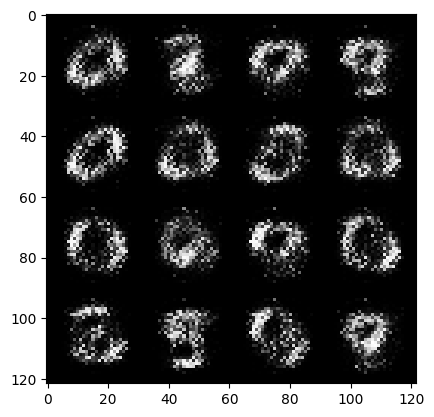

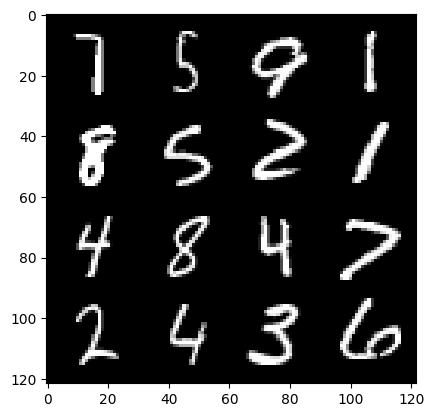

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 316/469 [00:08<00:04, 37.49it/s]

10: step 5000 / Gen Loss: 0.01874911119742317 / Disc Loss: 0.01874911119742317


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 372/469 [00:09<00:02, 38.85it/s]

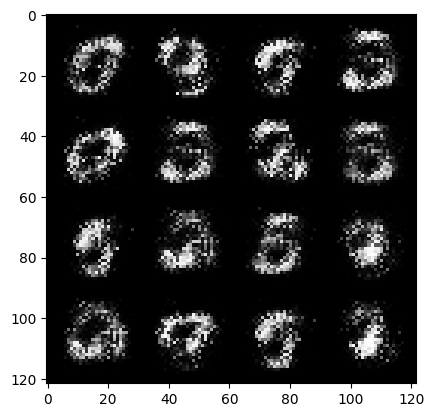

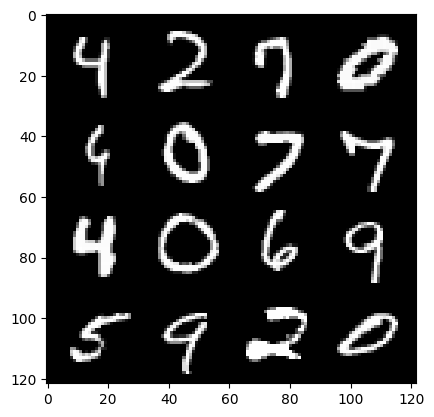

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 380/469 [00:10<00:02, 37.70it/s]

12: step 6000 / Gen Loss: 0.014130744157359007 / Disc Loss: 0.014130744157359007


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 432/469 [00:11<00:00, 38.65it/s]

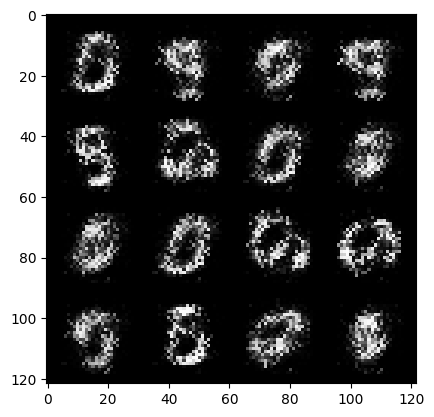

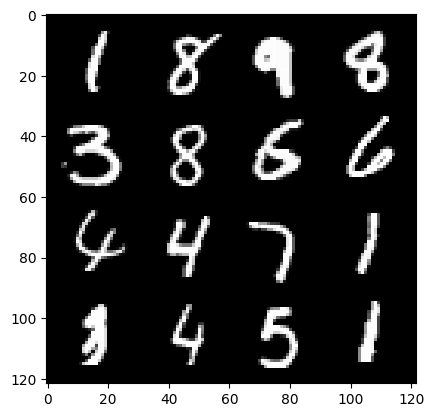

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 440/469 [00:11<00:00, 37.67it/s]

14: step 7000 / Gen Loss: 0.011565747200045726 / Disc Loss: 0.011565747200045726


  5%|████████▍                                                                                                                                                            | 24/469 [00:00<00:11, 38.84it/s]

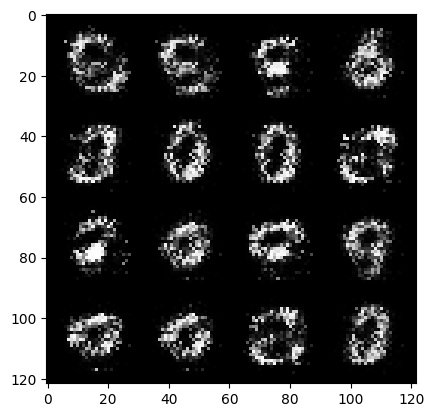

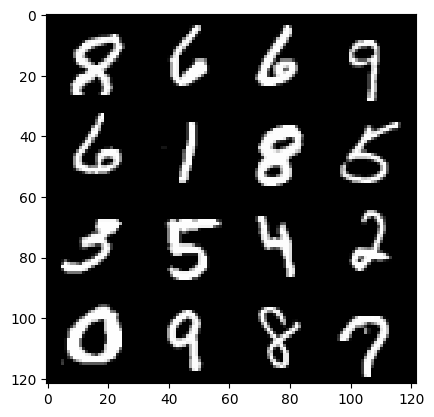

  8%|████████████▋                                                                                                                                                        | 36/469 [00:01<00:14, 29.47it/s]

17: step 8000 / Gen Loss: 0.007635614984901629 / Disc Loss: 0.007635614984901629


 19%|██████████████████████████████▉                                                                                                                                      | 88/469 [00:02<00:09, 38.83it/s]

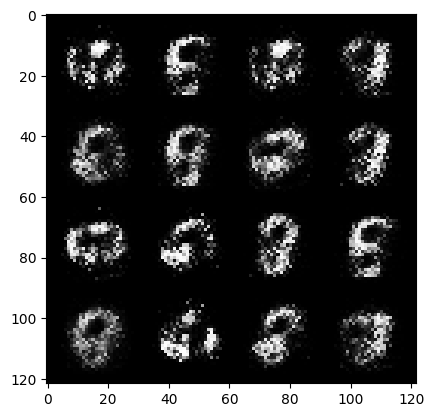

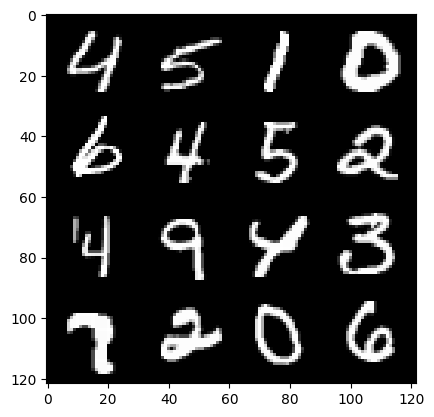

 20%|█████████████████████████████████▊                                                                                                                                   | 96/469 [00:02<00:10, 34.46it/s]

19: step 9000 / Gen Loss: 0.00972728607268071 / Disc Loss: 0.00972728607268071


 32%|███████████████████████████████████████████████████▊                                                                                                                | 148/469 [00:03<00:08, 37.80it/s]

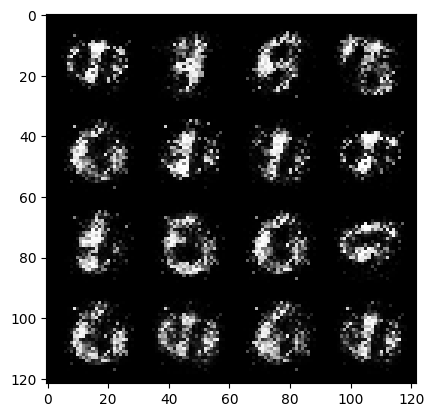

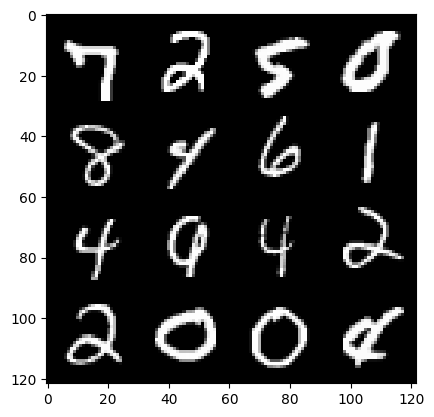

 33%|██████████████████████████████████████████████████████▌                                                                                                             | 156/469 [00:04<00:08, 35.12it/s]

21: step 10000 / Gen Loss: 0.012199189475970335 / Disc Loss: 0.012199189475970335


 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                         | 212/469 [00:05<00:06, 37.27it/s]

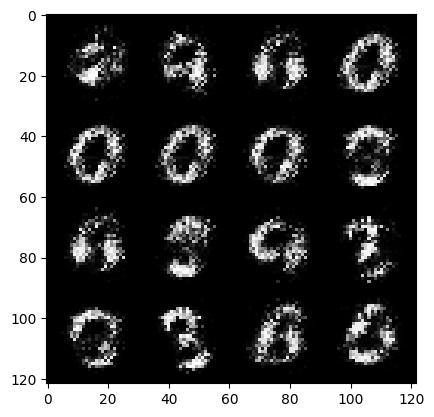

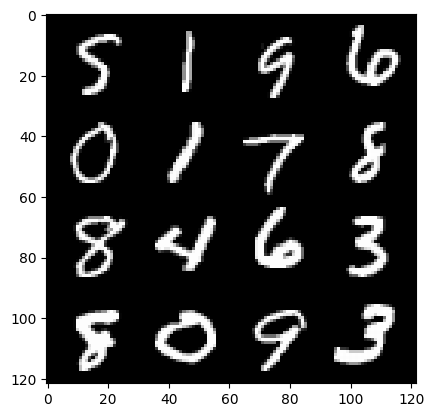

 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                       | 220/469 [00:06<00:07, 35.47it/s]

23: step 11000 / Gen Loss: 0.011645773425232632 / Disc Loss: 0.011645773425232632


 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 272/469 [00:07<00:05, 38.02it/s]

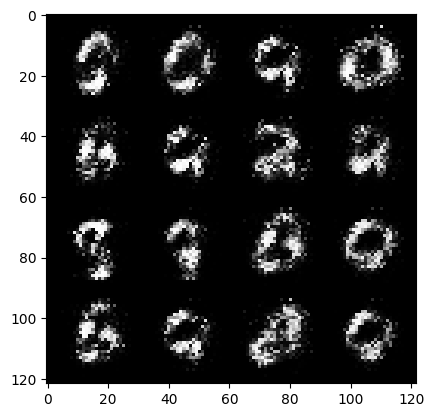

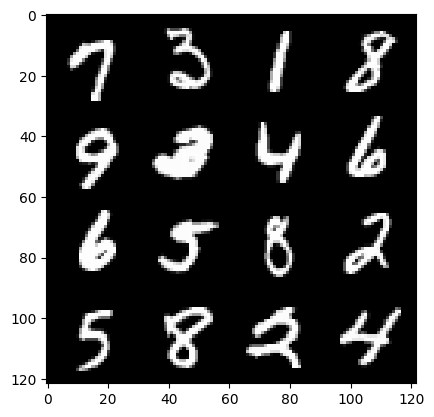

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 280/469 [00:07<00:05, 36.50it/s]

25: step 12000 / Gen Loss: 0.011389037649845703 / Disc Loss: 0.011389037649845703


 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 336/469 [00:08<00:03, 37.60it/s]

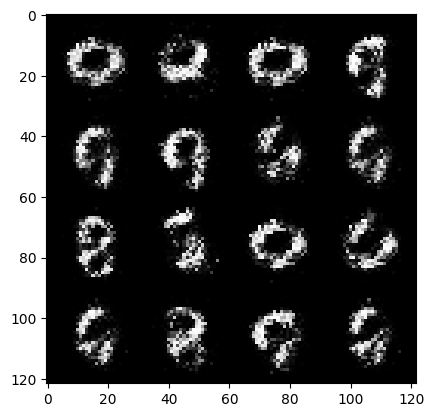

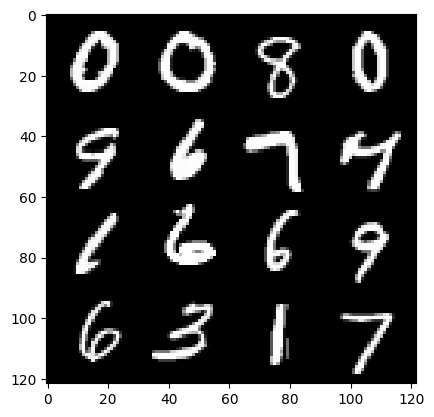

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 344/469 [00:09<00:03, 36.33it/s]

27: step 13000 / Gen Loss: 0.013478740218910396 / Disc Loss: 0.013478740218910396


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 396/469 [00:10<00:01, 37.50it/s]

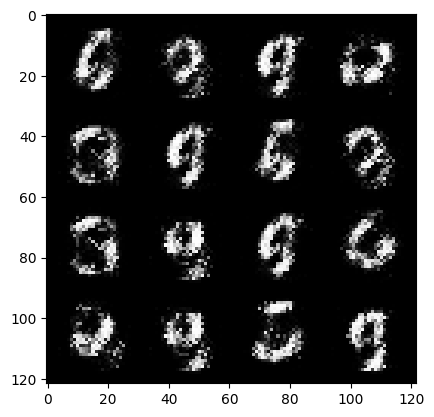

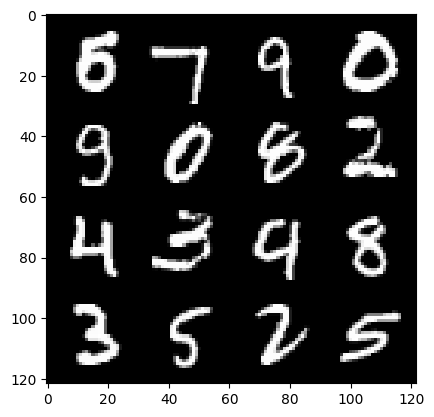

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 404/469 [00:11<00:01, 36.44it/s]

29: step 14000 / Gen Loss: 0.015725792046869184 / Disc Loss: 0.015725792046869184


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 460/469 [00:12<00:00, 37.82it/s]

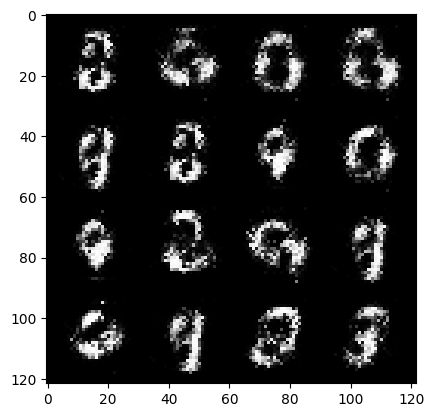

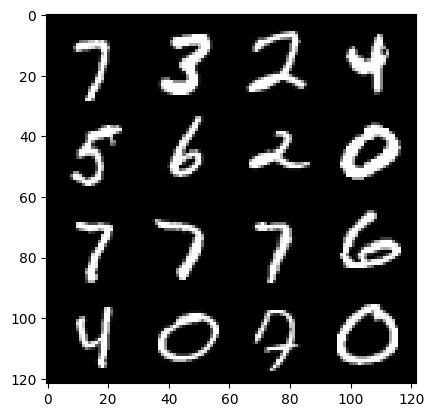

  0%|                                                                                                                                                                              | 0/469 [00:00<?, ?it/s]

31: step 15000 / Gen Loss: 0.019381373259006088 / Disc Loss: 0.019381373259006088


 11%|██████████████████▎                                                                                                                                                  | 52/469 [00:01<00:11, 37.76it/s]

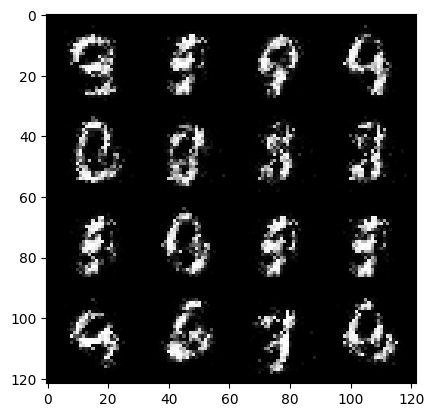

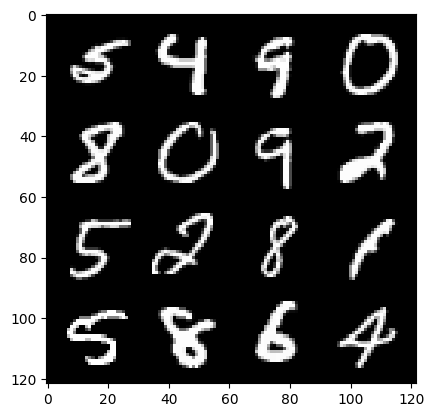

 13%|█████████████████████                                                                                                                                                | 60/469 [00:01<00:12, 31.83it/s]

34: step 16000 / Gen Loss: 0.01780337039520963 / Disc Loss: 0.01780337039520963


 25%|████████████████████████████████████████▌                                                                                                                           | 116/469 [00:03<00:09, 37.96it/s]

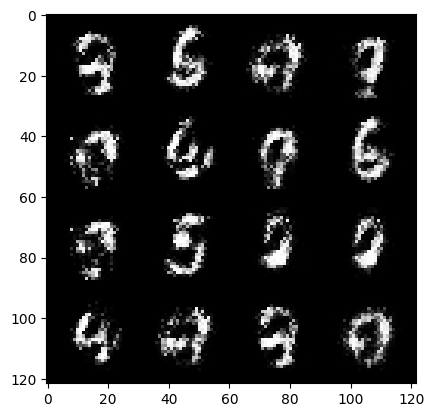

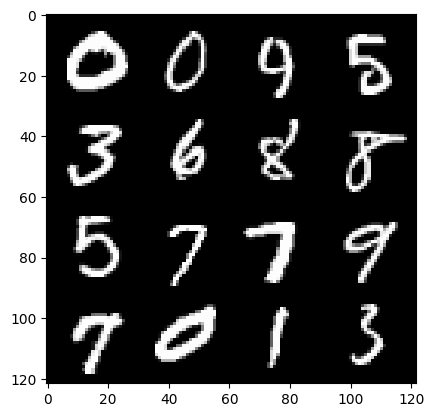

 26%|█████████████████████████████████████████▉                                                                                                                          | 120/469 [00:03<00:10, 34.54it/s]

36: step 17000 / Gen Loss: 0.024548096757382152 / Disc Loss: 0.024548096757382152


 38%|█████████████████████████████████████████████████████████████▌                                                                                                      | 176/469 [00:04<00:07, 38.12it/s]

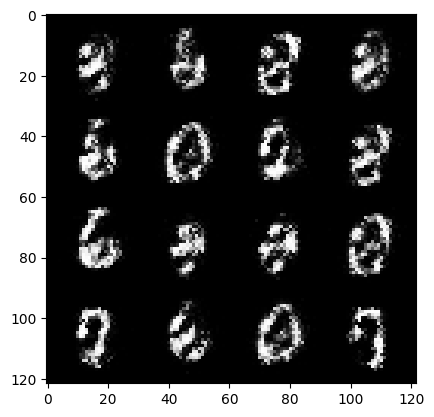

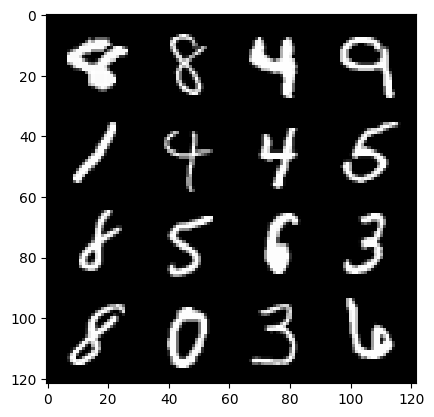

 39%|████████████████████████████████████████████████████████████████▎                                                                                                   | 184/469 [00:05<00:08, 34.95it/s]

38: step 18000 / Gen Loss: 0.031823646477423626 / Disc Loss: 0.031823646477423626


 51%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                | 240/469 [00:06<00:06, 37.17it/s]

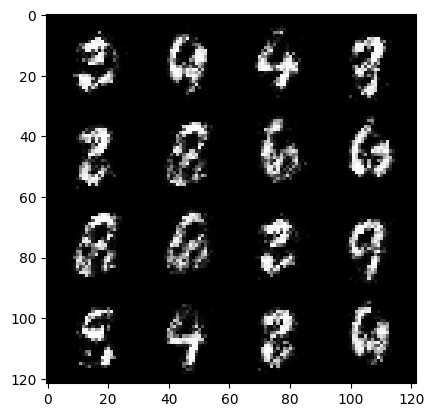

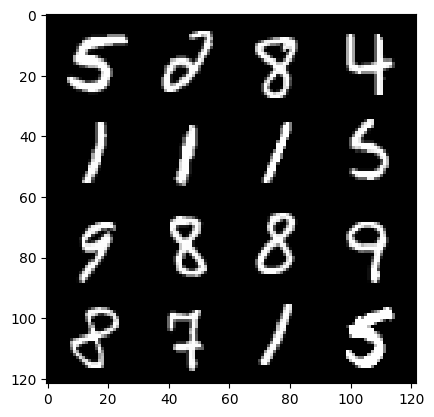

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 248/469 [00:06<00:06, 35.61it/s]

40: step 19000 / Gen Loss: 0.04317003944981841 / Disc Loss: 0.04317003944981841


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 300/469 [00:07<00:04, 38.05it/s]

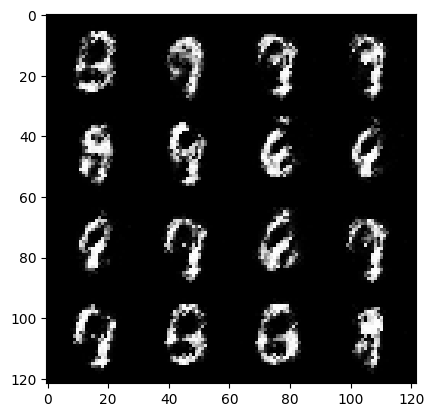

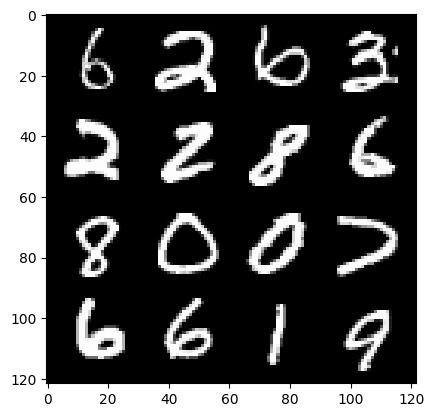

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 308/469 [00:08<00:04, 36.66it/s]

42: step 20000 / Gen Loss: 0.04036665970040488 / Disc Loss: 0.04036665970040488


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 364/469 [00:09<00:02, 37.72it/s]

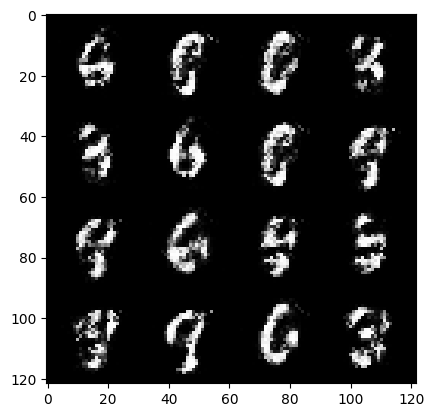

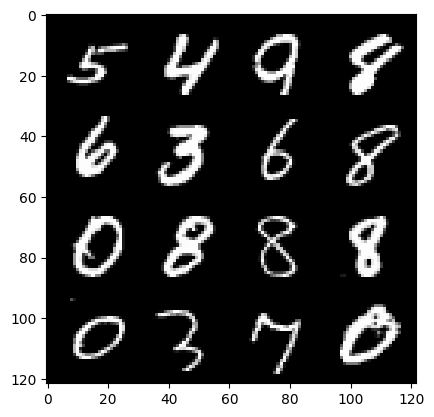

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 368/469 [00:10<00:02, 36.58it/s]

44: step 21000 / Gen Loss: 0.05100635054428133 / Disc Loss: 0.05100635054428133


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 424/469 [00:11<00:01, 37.98it/s]

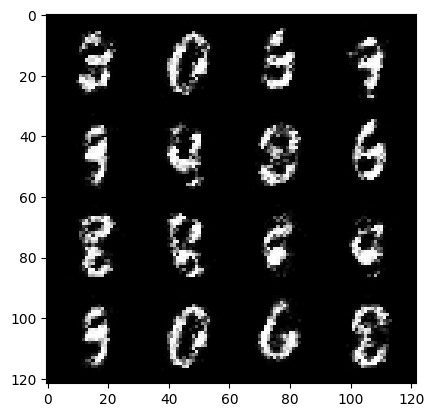

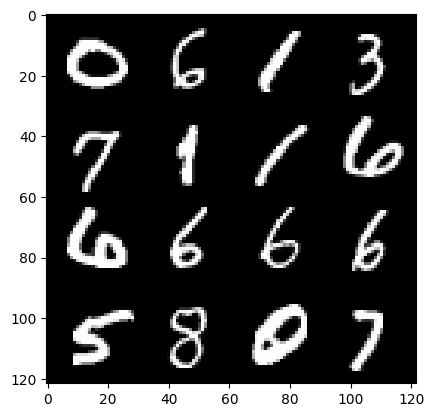

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 432/469 [00:11<00:01, 37.00it/s]

46: step 22000 / Gen Loss: 0.05594583055563271 / Disc Loss: 0.05594583055563271


  3%|█████▋                                                                                                                                                               | 16/469 [00:00<00:11, 38.64it/s]

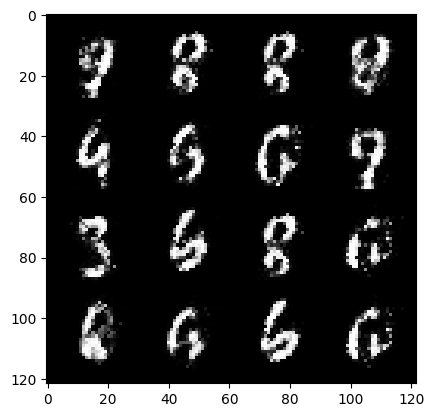

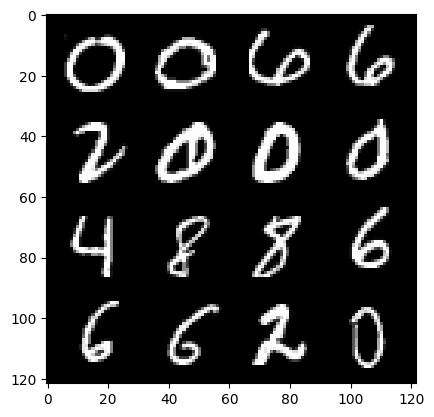

  6%|█████████▊                                                                                                                                                           | 28/469 [00:01<00:16, 27.42it/s]

49: step 23000 / Gen Loss: 0.06314320565666993 / Disc Loss: 0.06314320565666993


 17%|████████████████████████████▏                                                                                                                                        | 80/469 [00:02<00:10, 37.84it/s]

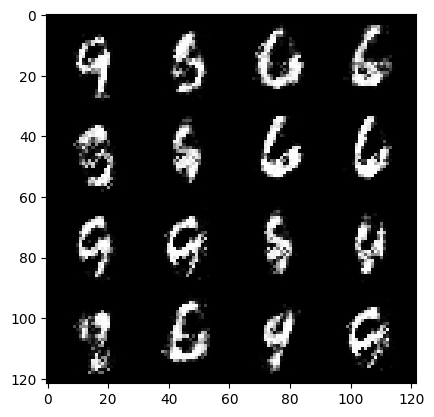

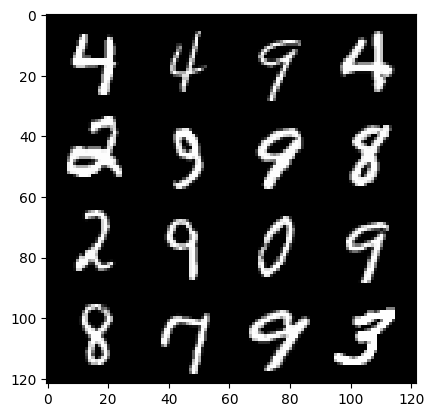

 19%|██████████████████████████████▉                                                                                                                                      | 88/469 [00:02<00:11, 33.47it/s]

51: step 24000 / Gen Loss: 0.0661892158966511 / Disc Loss: 0.0661892158966511


 30%|████████████████████████████████████████████████▉                                                                                                                   | 140/469 [00:03<00:08, 38.16it/s]

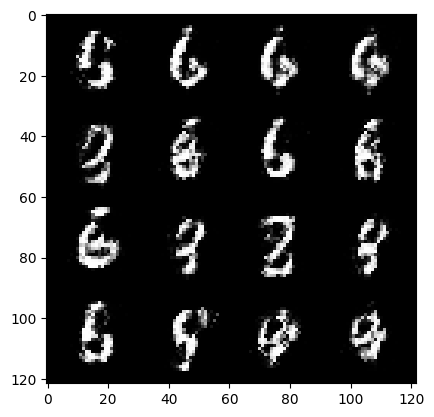

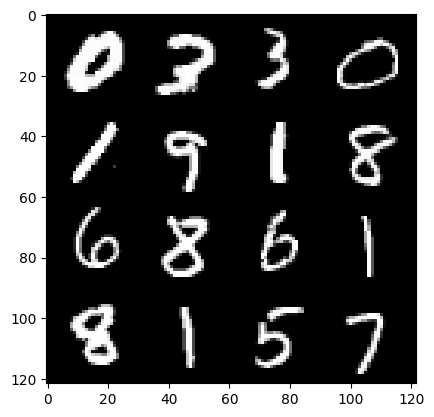

 32%|███████████████████████████████████████████████████▊                                                                                                                | 148/469 [00:04<00:09, 34.20it/s]

53: step 25000 / Gen Loss: 0.06532304989080871 / Disc Loss: 0.06532304989080871


 43%|███████████████████████████████████████████████████████████████████████▎                                                                                            | 204/469 [00:05<00:06, 38.07it/s]

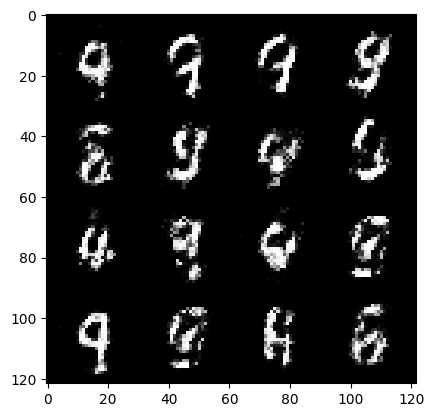

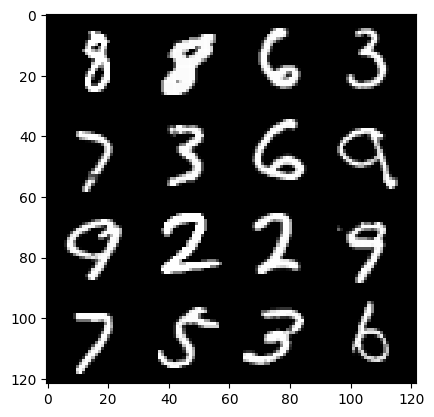

 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                         | 212/469 [00:05<00:07, 36.10it/s]

55: step 26000 / Gen Loss: 0.07201513269264254 / Disc Loss: 0.07201513269264254


 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 264/469 [00:07<00:05, 36.33it/s]

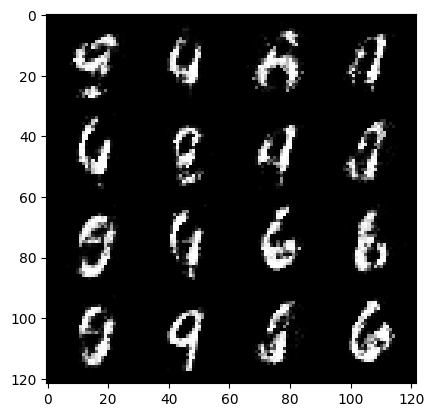

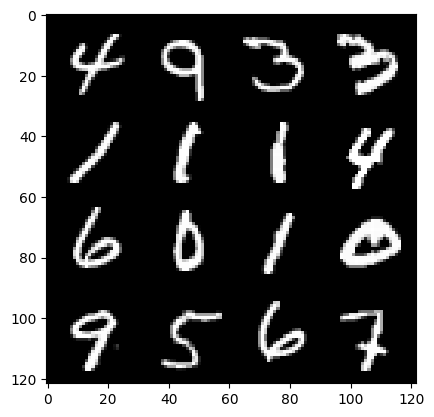

 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 272/469 [00:07<00:05, 34.92it/s]

57: step 27000 / Gen Loss: 0.0828843851964922 / Disc Loss: 0.0828843851964922


 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 328/469 [00:08<00:03, 36.80it/s]

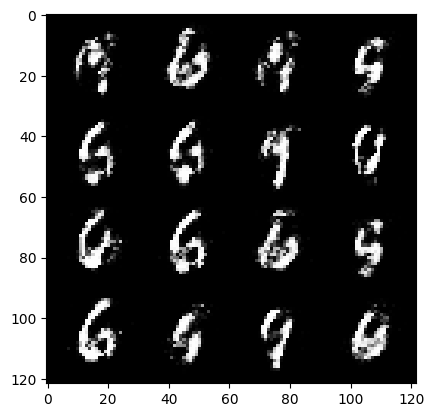

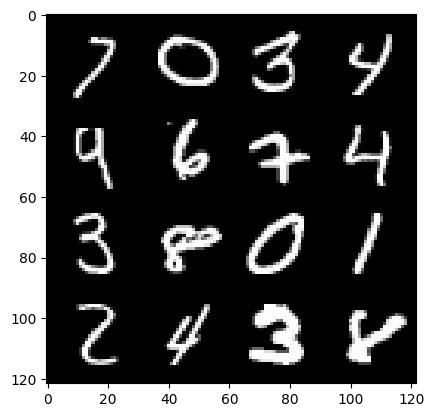

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 336/469 [00:09<00:03, 35.10it/s]

59: step 28000 / Gen Loss: 0.08709058031998564 / Disc Loss: 0.08709058031998564


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 388/469 [00:10<00:02, 37.36it/s]

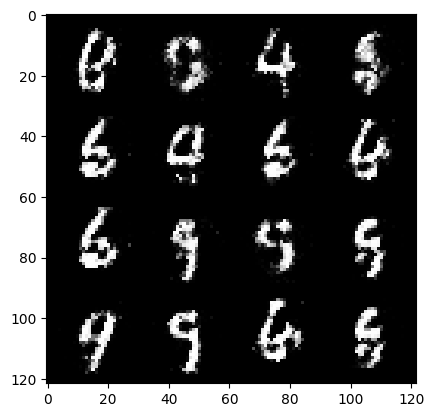

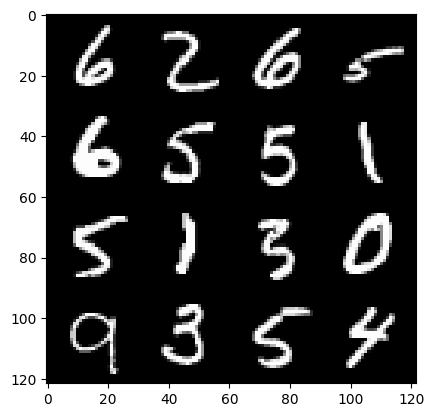

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 396/469 [00:10<00:02, 36.32it/s]

61: step 29000 / Gen Loss: 0.10442261080443867 / Disc Loss: 0.10442261080443867


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 452/469 [00:11<00:00, 38.02it/s]

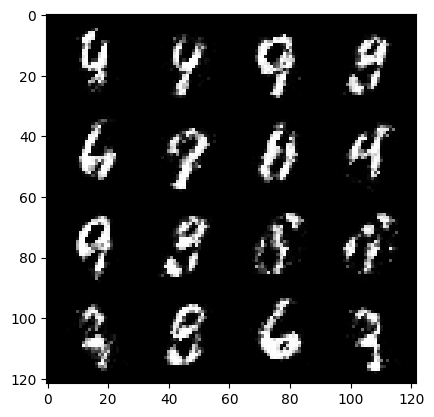

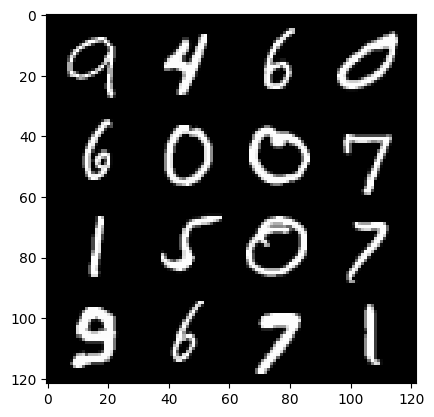

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 460/469 [00:12<00:00, 37.07it/s]

63: step 30000 / Gen Loss: 0.09363199442066249 / Disc Loss: 0.09363199442066249


  9%|███████████████▍                                                                                                                                                     | 44/469 [00:01<00:11, 36.39it/s]

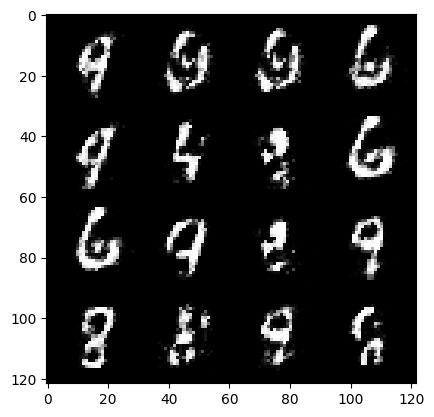

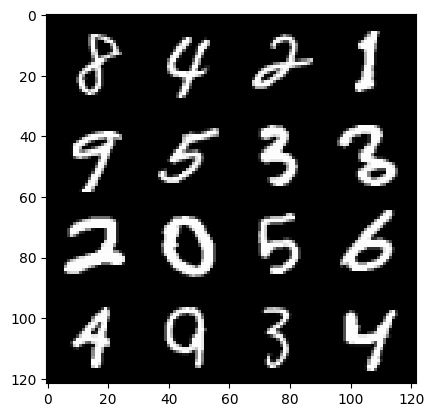

 11%|██████████████████▎                                                                                                                                                  | 52/469 [00:01<00:13, 30.09it/s]

66: step 31000 / Gen Loss: 0.1085912032425403 / Disc Loss: 0.1085912032425403


 23%|█████████████████████████████████████▊                                                                                                                              | 108/469 [00:02<00:09, 37.13it/s]

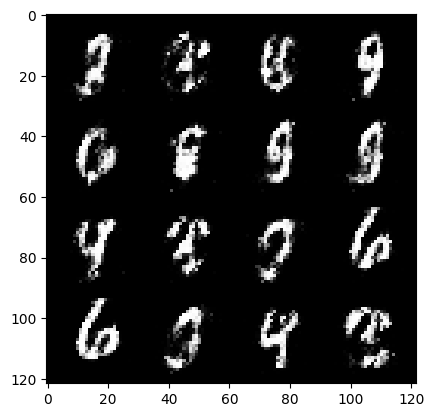

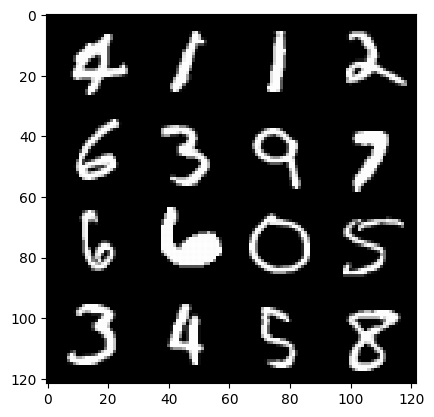

 25%|████████████████████████████████████████▌                                                                                                                           | 116/469 [00:03<00:10, 33.96it/s]

68: step 32000 / Gen Loss: 0.11094607432559135 / Disc Loss: 0.11094607432559135


 36%|██████████████████████████████████████████████████████████▋                                                                                                         | 168/469 [00:04<00:08, 36.49it/s]

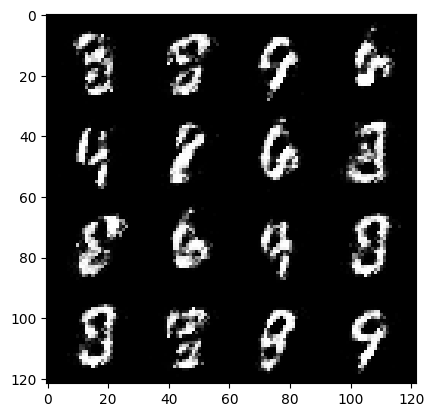

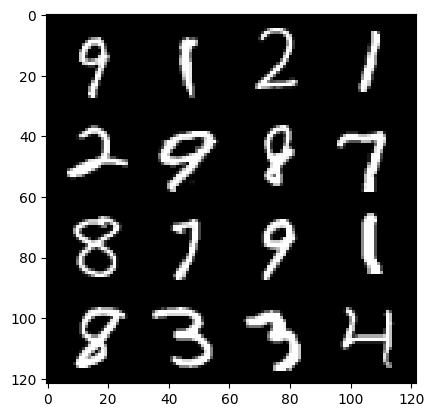

 38%|█████████████████████████████████████████████████████████████▌                                                                                                      | 176/469 [00:05<00:08, 34.17it/s]

70: step 33000 / Gen Loss: 0.1204161490537227 / Disc Loss: 0.1204161490537227


 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 232/469 [00:06<00:06, 35.90it/s]

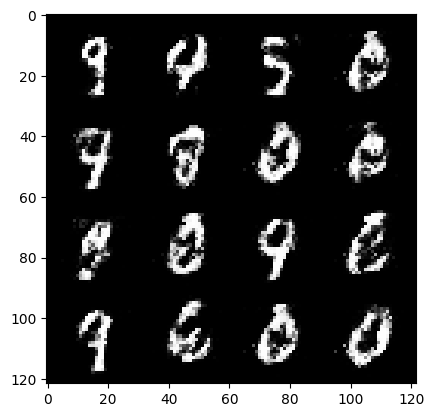

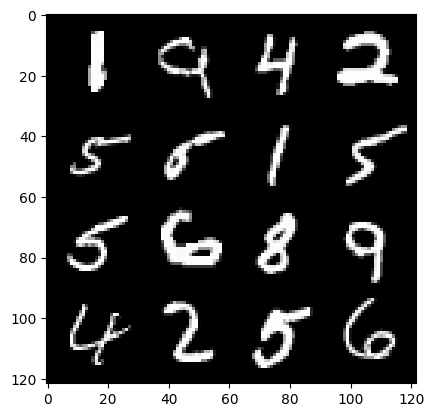

 50%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 236/469 [00:06<00:06, 34.28it/s]

72: step 34000 / Gen Loss: 0.12655272611230609 / Disc Loss: 0.12655272611230609


 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 292/469 [00:07<00:04, 37.52it/s]

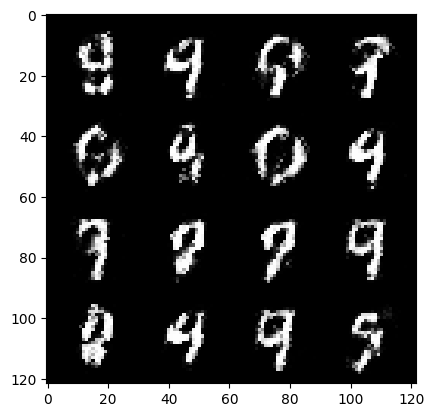

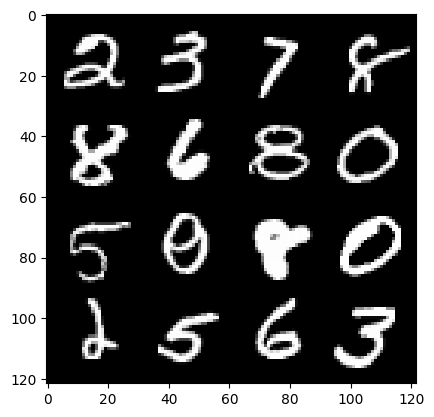

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 300/469 [00:08<00:04, 36.14it/s]

74: step 35000 / Gen Loss: 0.1298236552998424 / Disc Loss: 0.1298236552998424


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 356/469 [00:09<00:03, 37.12it/s]

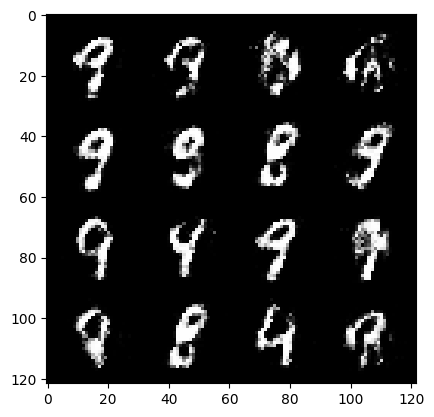

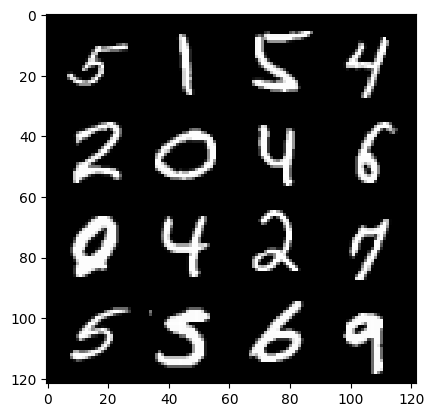

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 364/469 [00:10<00:02, 36.01it/s]

76: step 36000 / Gen Loss: 0.13981362627446642 / Disc Loss: 0.13981362627446642


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 416/469 [00:10<00:01, 38.31it/s]

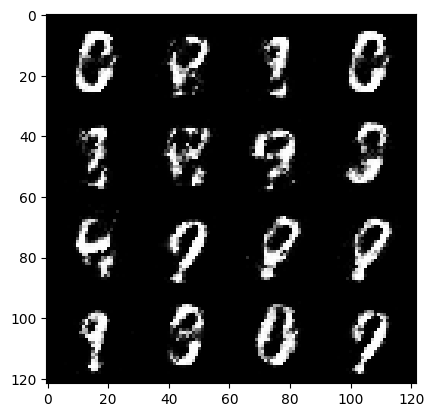

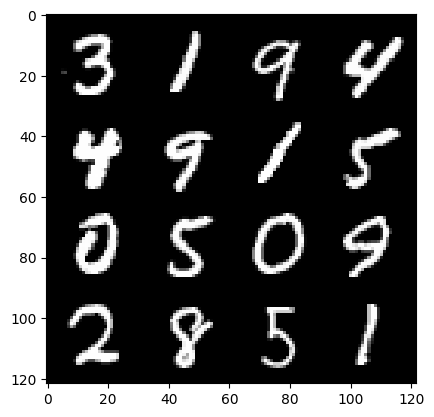

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 424/469 [00:11<00:01, 37.28it/s]

78: step 37000 / Gen Loss: 0.159231034617871 / Disc Loss: 0.159231034617871


  2%|██▊                                                                                                                                                                   | 8/469 [00:00<00:12, 37.56it/s]

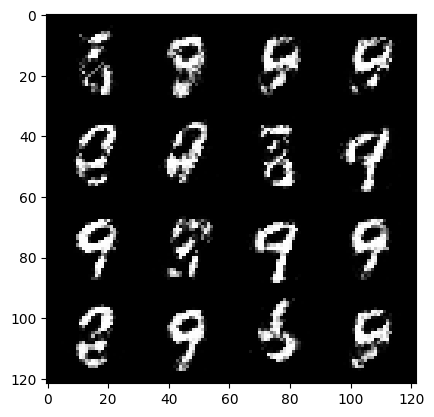

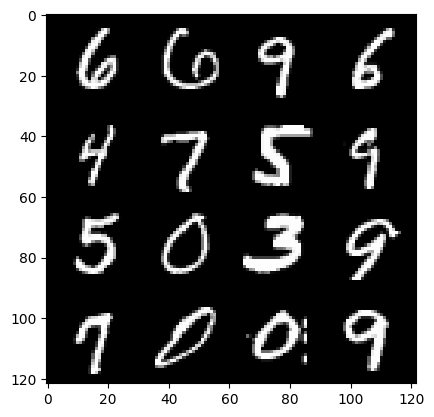

  3%|█████▋                                                                                                                                                               | 16/469 [00:00<00:20, 21.83it/s]

81: step 38000 / Gen Loss: 0.14261443041637517 / Disc Loss: 0.14261443041637517


 15%|█████████████████████████▎                                                                                                                                           | 72/469 [00:01<00:10, 37.70it/s]

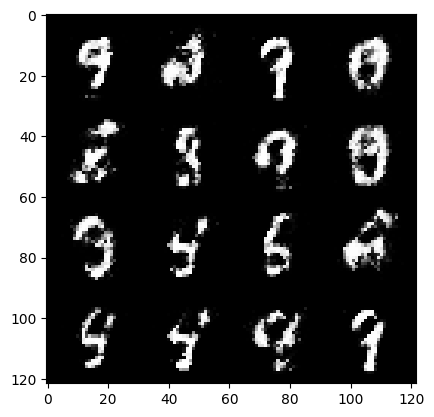

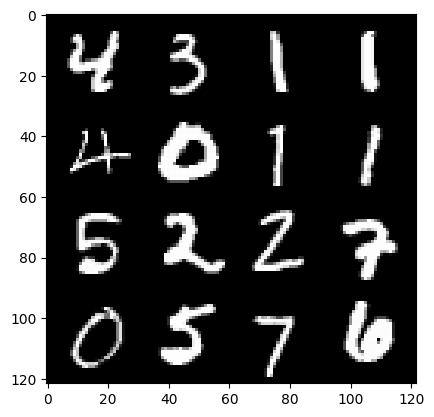

 17%|████████████████████████████▏                                                                                                                                        | 80/469 [00:02<00:11, 33.04it/s]

83: step 39000 / Gen Loss: 0.15006904696673148 / Disc Loss: 0.15006904696673148


 28%|██████████████████████████████████████████████▏                                                                                                                     | 132/469 [00:03<00:08, 38.59it/s]

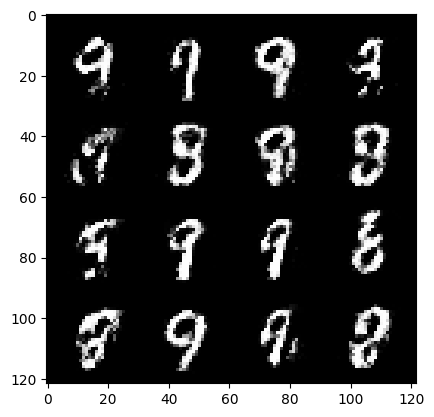

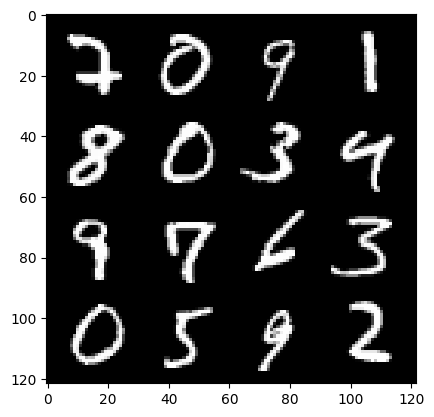

 30%|████████████████████████████████████████████████▉                                                                                                                   | 140/469 [00:03<00:09, 35.70it/s]

85: step 40000 / Gen Loss: 0.1650127350389958 / Disc Loss: 0.1650127350389958


 42%|████████████████████████████████████████████████████████████████████▌                                                                                               | 196/469 [00:05<00:07, 38.49it/s]

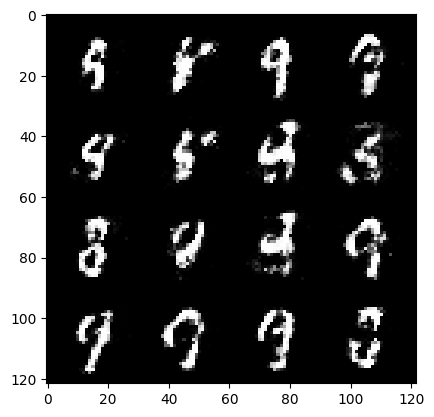

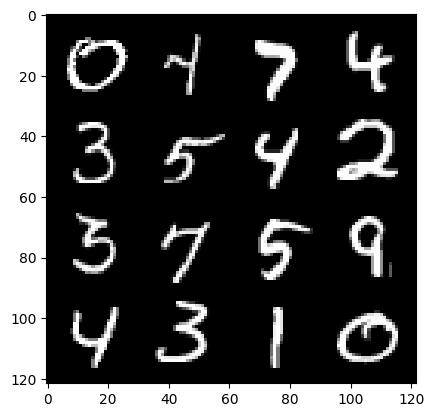

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                            | 204/469 [00:05<00:07, 36.49it/s]

87: step 41000 / Gen Loss: 0.14847019962221344 / Disc Loss: 0.14847019962221344


 55%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 256/469 [00:06<00:05, 38.71it/s]

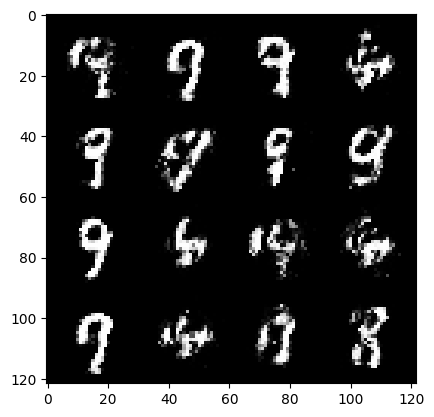

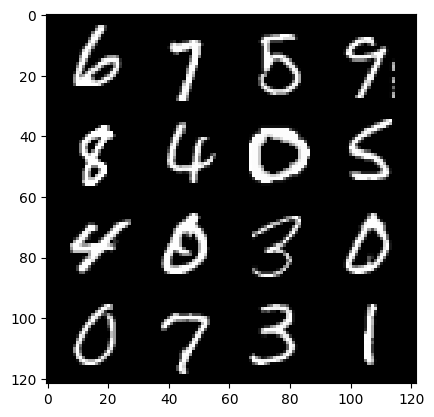

 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 264/469 [00:07<00:05, 37.10it/s]

89: step 42000 / Gen Loss: 0.16221428623050438 / Disc Loss: 0.16221428623050438


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 320/469 [00:08<00:03, 38.61it/s]

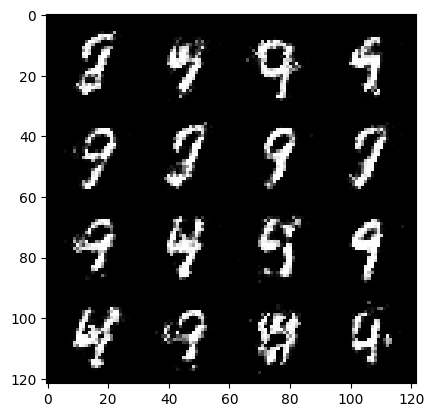

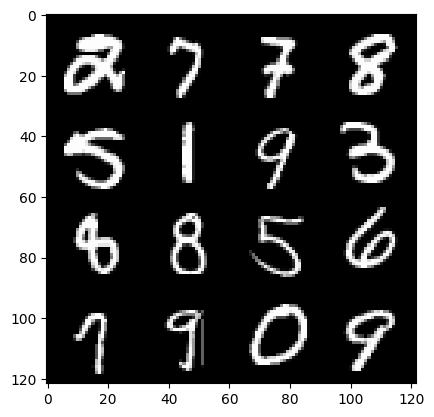

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 328/469 [00:08<00:03, 37.32it/s]

91: step 43000 / Gen Loss: 0.16257603443413976 / Disc Loss: 0.16257603443413976


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 380/469 [00:09<00:02, 38.95it/s]

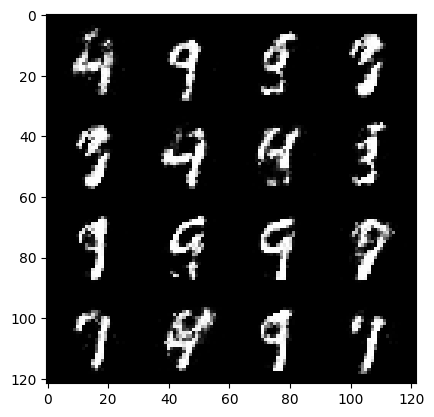

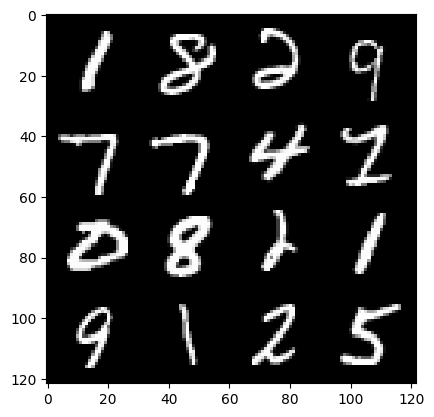

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 388/469 [00:10<00:02, 37.85it/s]

93: step 44000 / Gen Loss: 0.15589783132821336 / Disc Loss: 0.15589783132821336


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 444/469 [00:11<00:00, 38.55it/s]

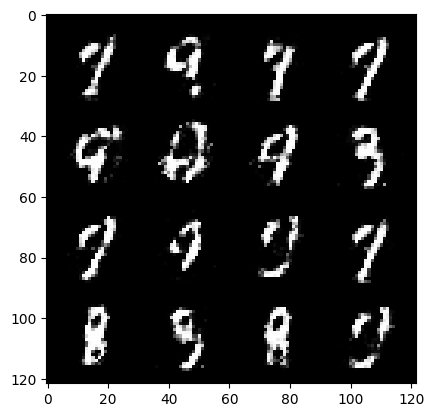

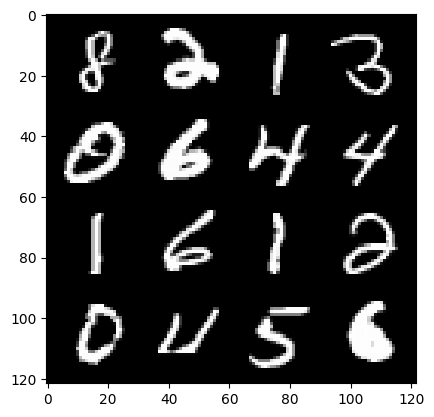

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 452/469 [00:12<00:00, 37.62it/s]

95: step 45000 / Gen Loss: 0.1534888557456434 / Disc Loss: 0.1534888557456434


  8%|████████████▋                                                                                                                                                        | 36/469 [00:00<00:11, 38.79it/s]

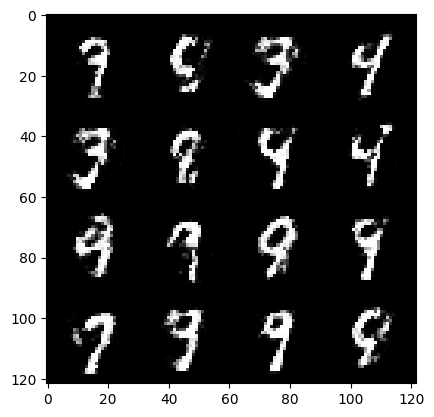

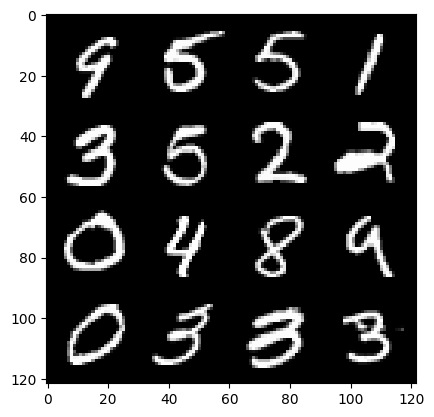

  9%|███████████████▍                                                                                                                                                     | 44/469 [00:01<00:13, 30.88it/s]

98: step 46000 / Gen Loss: 0.17276508172601462 / Disc Loss: 0.17276508172601462


 21%|██████████████████████████████████▉                                                                                                                                 | 100/469 [00:02<00:09, 38.91it/s]

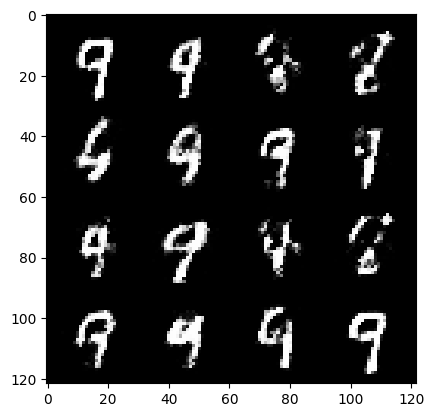

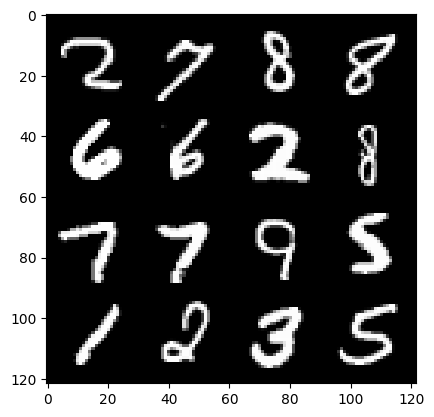

 23%|█████████████████████████████████████▊                                                                                                                              | 108/469 [00:03<00:10, 35.21it/s]

100: step 47000 / Gen Loss: 0.18538193144649287 / Disc Loss: 0.18538193144649287


 34%|███████████████████████████████████████████████████████▉                                                                                                            | 160/469 [00:04<00:07, 38.98it/s]

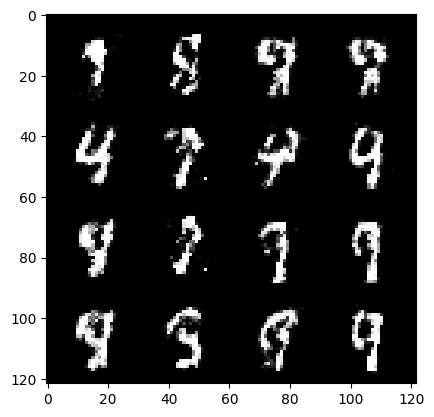

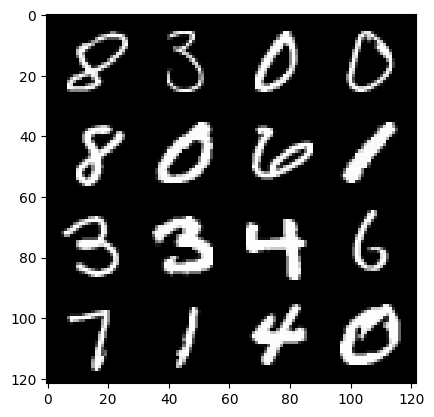

 36%|██████████████████████████████████████████████████████████▋                                                                                                         | 168/469 [00:04<00:08, 36.53it/s]

102: step 48000 / Gen Loss: 0.1870214280411599 / Disc Loss: 0.1870214280411599


 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                     | 224/469 [00:05<00:06, 38.48it/s]

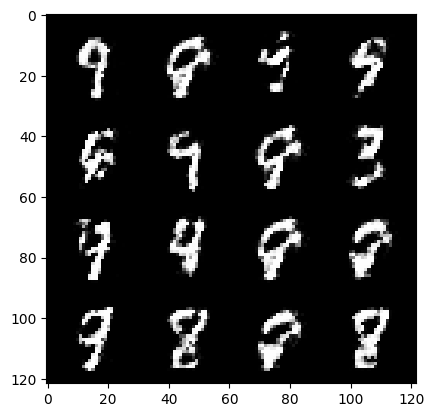

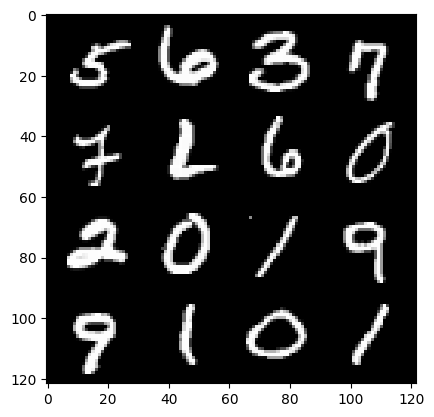

 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 232/469 [00:06<00:06, 35.92it/s]

104: step 49000 / Gen Loss: 0.19597732529789233 / Disc Loss: 0.19597732529789233


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 284/469 [00:07<00:04, 38.84it/s]

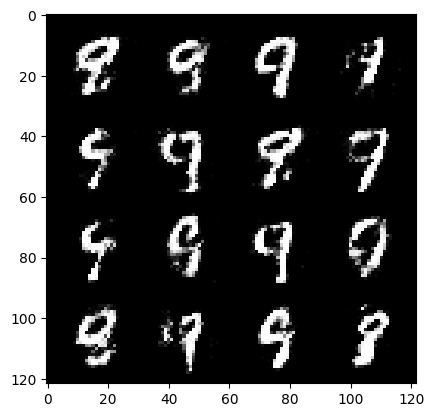

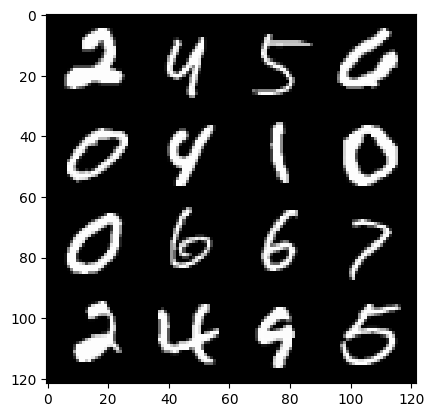

 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 292/469 [00:07<00:04, 37.39it/s]

106: step 50000 / Gen Loss: 0.19543732148408874 / Disc Loss: 0.19543732148408874


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 348/469 [00:08<00:03, 38.79it/s]

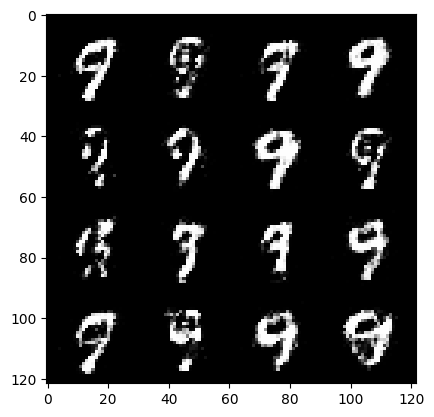

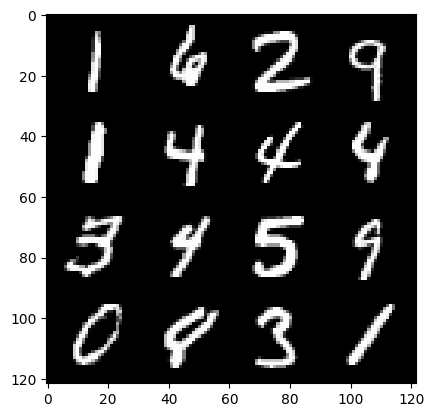

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 356/469 [00:09<00:03, 37.60it/s]

108: step 51000 / Gen Loss: 0.1879806170314552 / Disc Loss: 0.1879806170314552


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 408/469 [00:10<00:01, 38.98it/s]

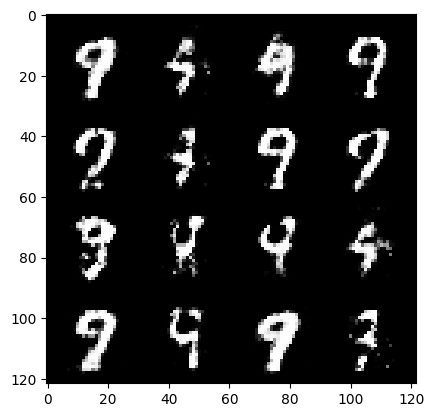

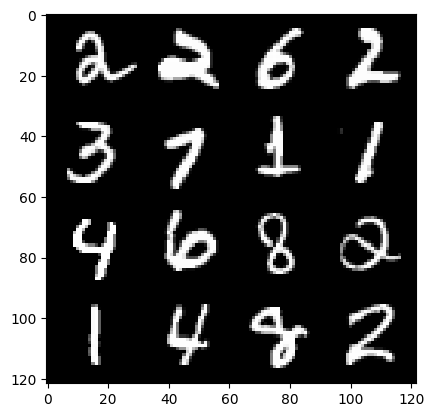

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 416/469 [00:10<00:01, 37.93it/s]

110: step 52000 / Gen Loss: 0.19977503467351218 / Disc Loss: 0.19977503467351218


  0%|                                                                                                                                                                              | 0/469 [00:00<?, ?it/s]

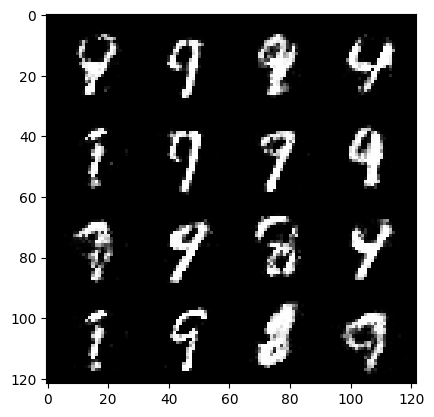

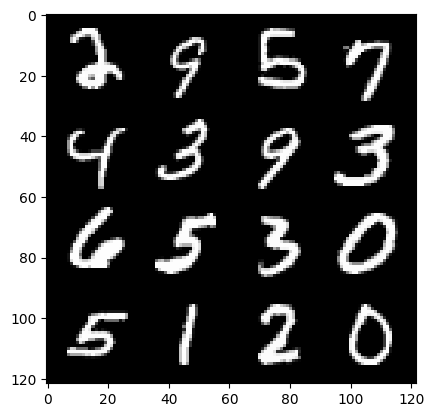

  3%|████▏                                                                                                                                                                | 12/469 [00:00<00:23, 19.80it/s]

113: step 53000 / Gen Loss: 0.2086330423131586 / Disc Loss: 0.2086330423131586


 14%|██████████████████████▌                                                                                                                                              | 64/469 [00:01<00:10, 38.42it/s]

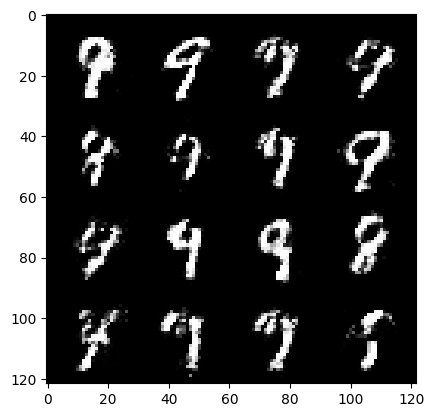

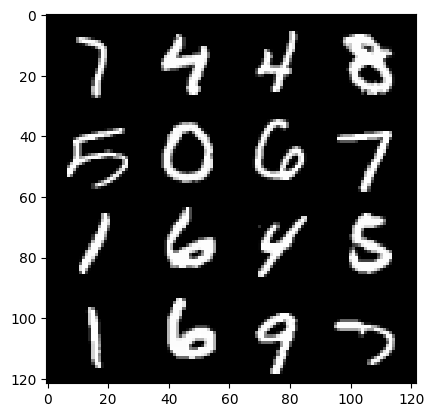

 15%|█████████████████████████▎                                                                                                                                           | 72/469 [00:02<00:11, 33.26it/s]

115: step 54000 / Gen Loss: 0.21325175985693945 / Disc Loss: 0.21325175985693945


 26%|███████████████████████████████████████████▎                                                                                                                        | 124/469 [00:03<00:08, 39.67it/s]

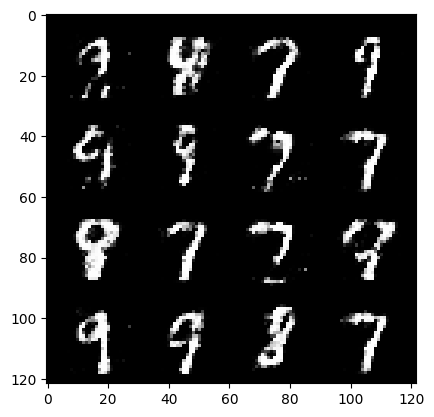

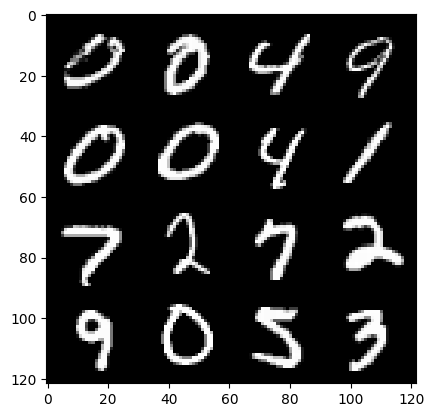

 29%|██████████████████████████████████████████████▊                                                                                                                     | 134/469 [00:03<00:09, 36.43it/s]

117: step 55000 / Gen Loss: 0.23041143635660402 / Disc Loss: 0.23041143635660402


 40%|█████████████████████████████████████████████████████████████████▋                                                                                                  | 188/469 [00:04<00:07, 39.03it/s]

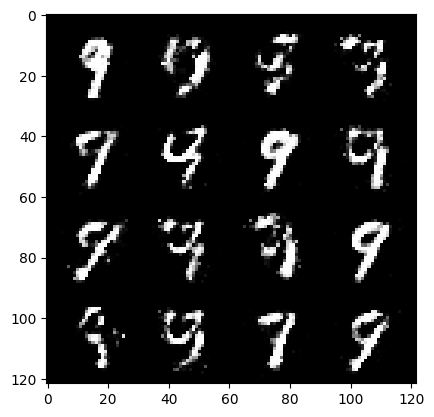

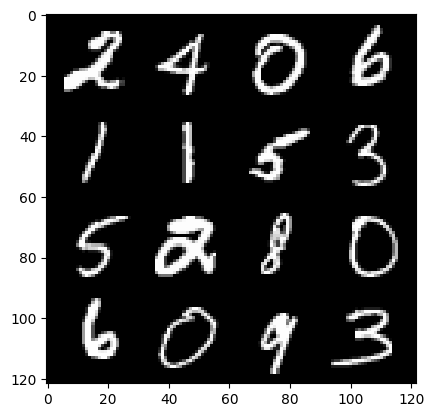

 42%|████████████████████████████████████████████████████████████████████▌                                                                                               | 196/469 [00:05<00:07, 36.88it/s]

119: step 56000 / Gen Loss: 0.2415961462408305 / Disc Loss: 0.2415961462408305


 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 248/469 [00:06<00:05, 38.94it/s]

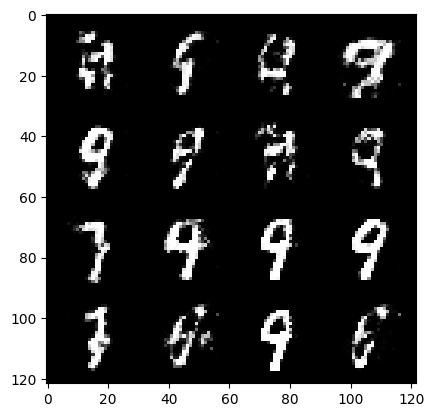

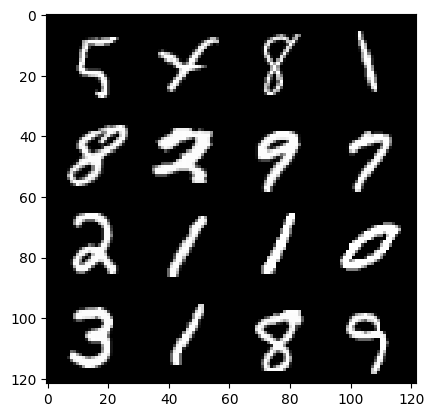

 55%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 256/469 [00:06<00:05, 37.27it/s]

121: step 57000 / Gen Loss: 0.24587875935435247 / Disc Loss: 0.24587875935435247


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 312/469 [00:08<00:04, 38.98it/s]

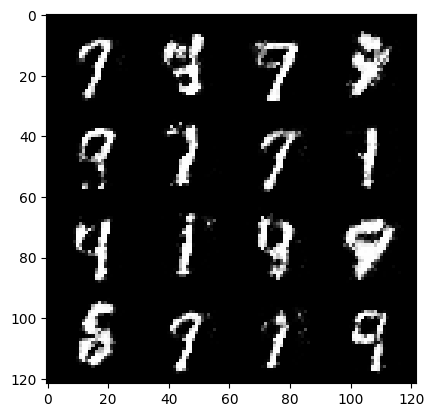

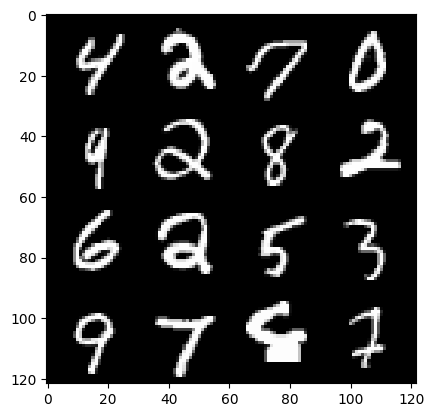

 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 320/469 [00:08<00:03, 37.65it/s]

123: step 58000 / Gen Loss: 0.2534298063367604 / Disc Loss: 0.2534298063367604


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 372/469 [00:09<00:02, 38.81it/s]

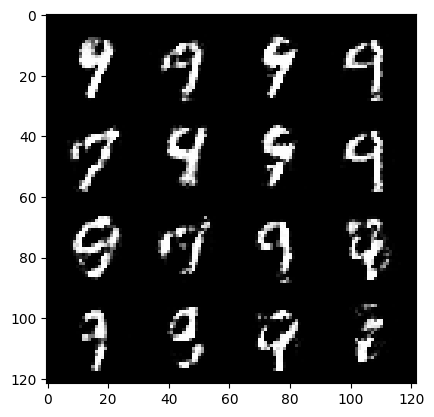

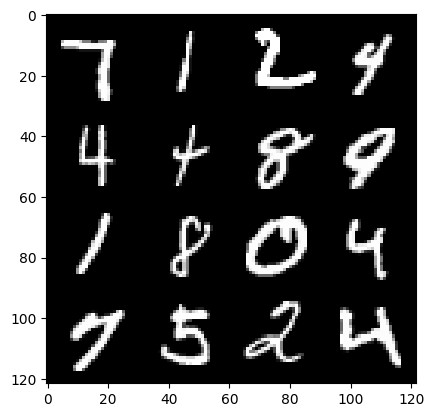

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 380/469 [00:10<00:02, 37.69it/s]

125: step 59000 / Gen Loss: 0.2539542492181061 / Disc Loss: 0.2539542492181061


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 434/469 [00:11<00:00, 37.92it/s]

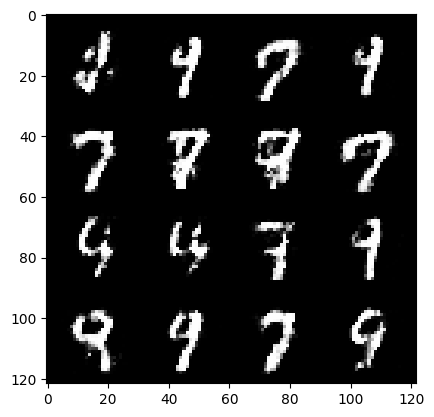

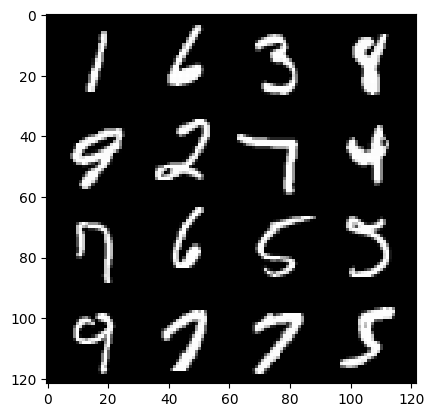

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 444/469 [00:12<00:00, 36.94it/s]

127: step 60000 / Gen Loss: 0.24626560217142124 / Disc Loss: 0.24626560217142124


  6%|█████████▊                                                                                                                                                           | 28/469 [00:00<00:11, 38.73it/s]

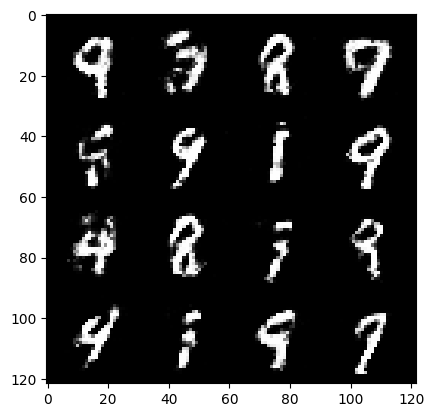

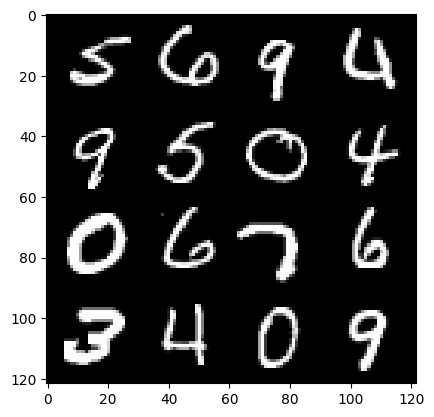

  8%|████████████▋                                                                                                                                                        | 36/469 [00:01<00:14, 29.29it/s]

130: step 61000 / Gen Loss: 0.2794408354461192 / Disc Loss: 0.2794408354461192


 20%|████████████████████████████████▎                                                                                                                                    | 92/469 [00:02<00:09, 38.74it/s]

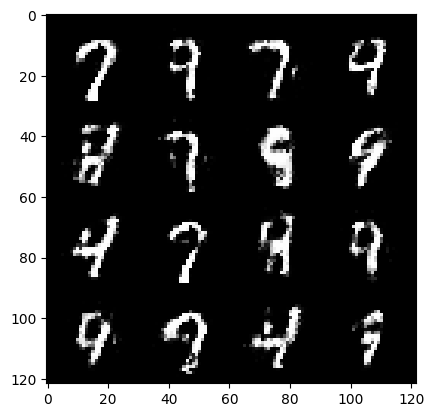

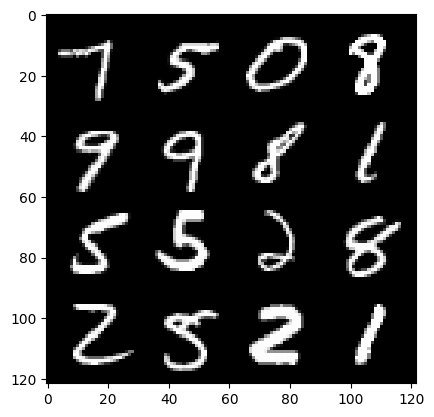

 20%|█████████████████████████████████▊                                                                                                                                   | 96/469 [00:02<00:10, 34.62it/s]

132: step 62000 / Gen Loss: 0.27360569205880175 / Disc Loss: 0.27360569205880175


 32%|█████████████████████████████████████████████████████▏                                                                                                              | 152/469 [00:03<00:08, 38.69it/s]

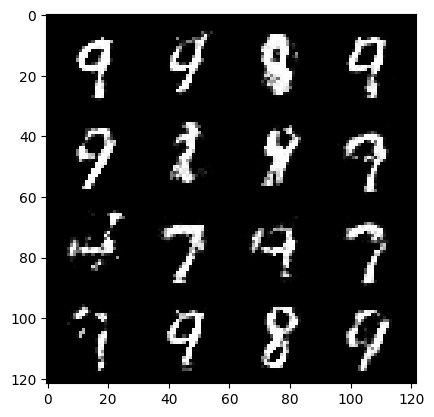

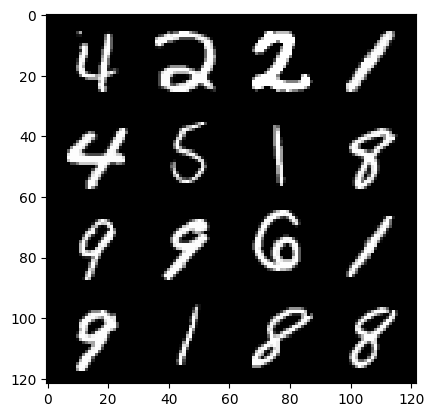

 34%|███████████████████████████████████████████████████████▉                                                                                                            | 160/469 [00:04<00:08, 36.08it/s]

134: step 63000 / Gen Loss: 0.2757402882277965 / Disc Loss: 0.2757402882277965


 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                        | 216/469 [00:05<00:06, 38.25it/s]

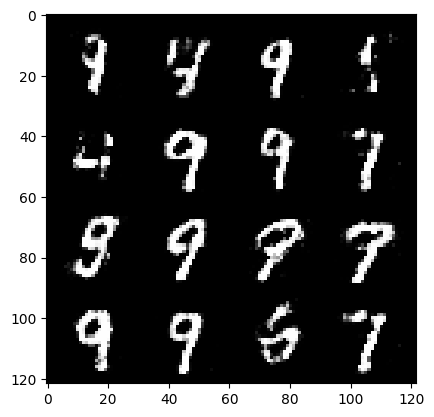

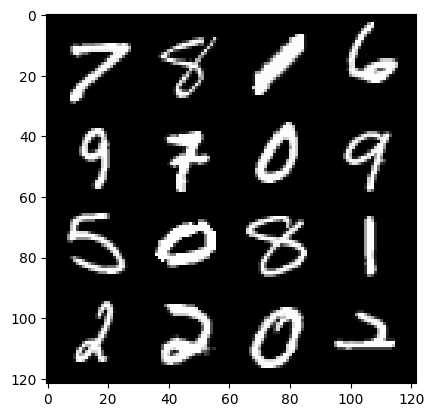

 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                     | 224/469 [00:06<00:06, 36.40it/s]

136: step 64000 / Gen Loss: 0.29648207332193816 / Disc Loss: 0.29648207332193816


 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 276/469 [00:07<00:04, 38.76it/s]

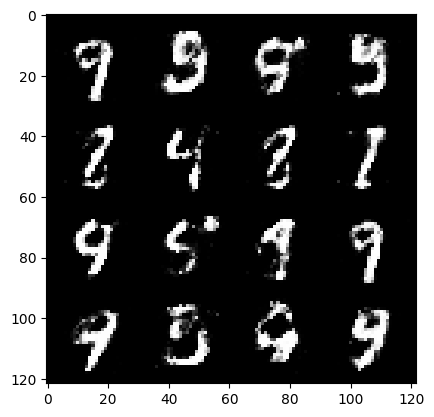

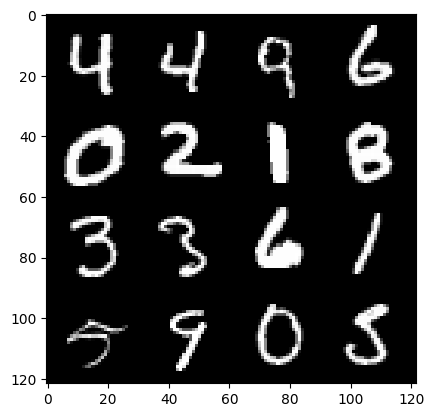

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 284/469 [00:07<00:04, 37.27it/s]

138: step 65000 / Gen Loss: 0.30060540965199456 / Disc Loss: 0.30060540965199456


 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 340/469 [00:08<00:03, 38.43it/s]

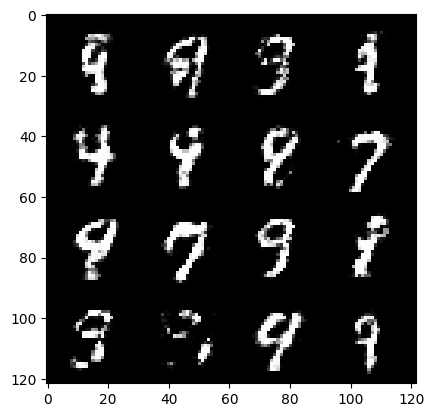

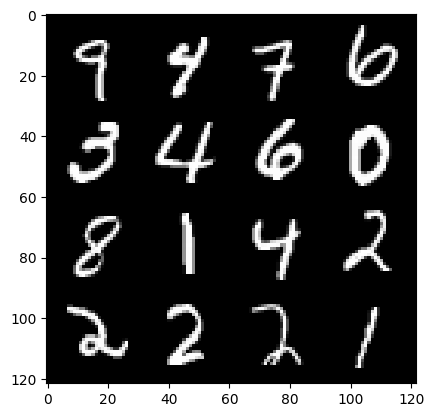

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 344/469 [00:09<00:03, 37.19it/s]

140: step 66000 / Gen Loss: 0.2957101344019172 / Disc Loss: 0.2957101344019172


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 400/469 [00:10<00:01, 38.61it/s]

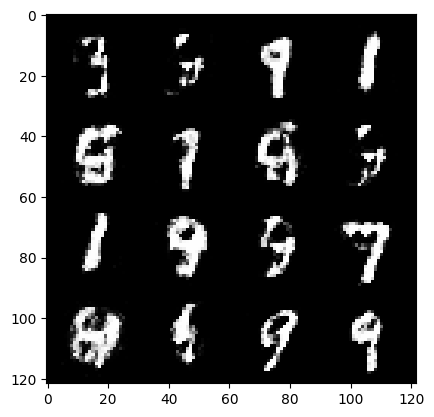

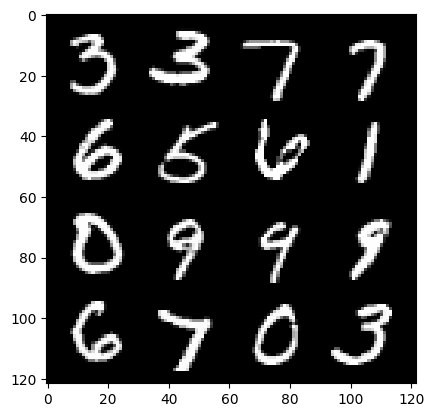

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 408/469 [00:10<00:01, 37.53it/s]

142: step 67000 / Gen Loss: 0.2873454645574091 / Disc Loss: 0.2873454645574091


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 464/469 [00:12<00:00, 38.22it/s]

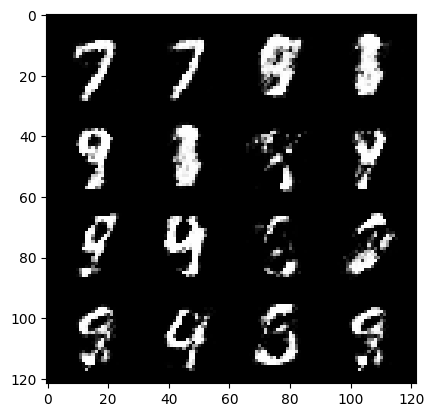

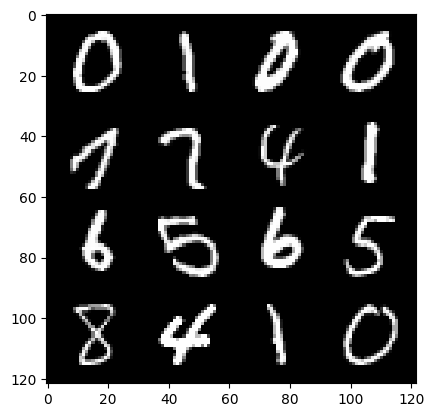

  0%|                                                                                                                                                                              | 0/469 [00:00<?, ?it/s]

144: step 68000 / Gen Loss: 0.2981967774033547 / Disc Loss: 0.2981967774033547


 12%|███████████████████▋                                                                                                                                                 | 56/469 [00:01<00:10, 38.57it/s]

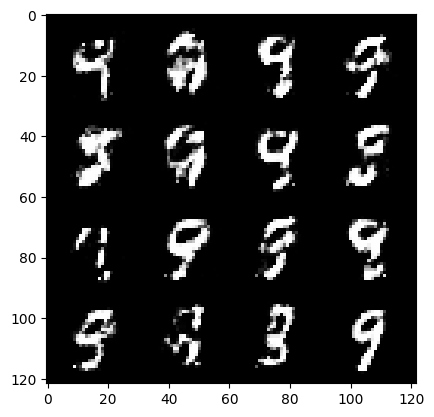

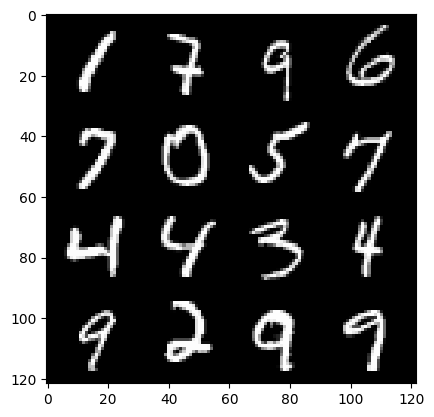

 14%|██████████████████████▌                                                                                                                                              | 64/469 [00:01<00:12, 32.67it/s]

147: step 69000 / Gen Loss: 0.30471951125562236 / Disc Loss: 0.30471951125562236


 25%|████████████████████████████████████████▌                                                                                                                           | 116/469 [00:03<00:09, 38.23it/s]

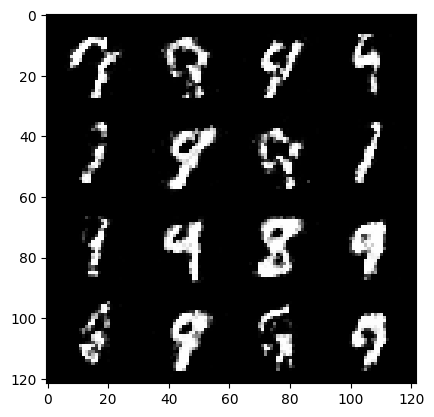

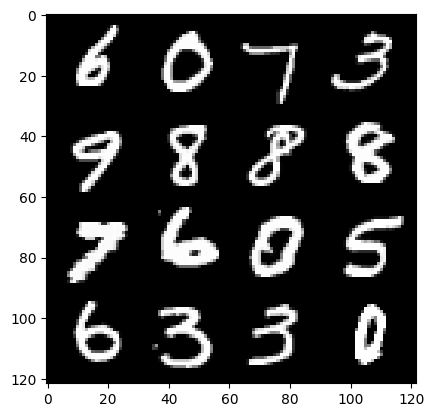

 26%|███████████████████████████████████████████▎                                                                                                                        | 124/469 [00:03<00:09, 34.72it/s]

149: step 70000 / Gen Loss: 0.32730958276987127 / Disc Loss: 0.32730958276987127


 38%|██████████████████████████████████████████████████████████████▉                                                                                                     | 180/469 [00:04<00:07, 38.78it/s]

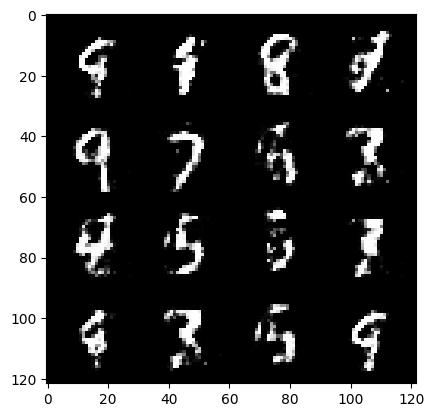

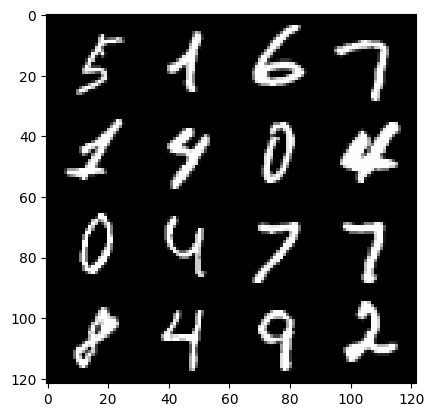

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                  | 188/469 [00:05<00:07, 36.55it/s]

151: step 71000 / Gen Loss: 0.31820272473990957 / Disc Loss: 0.31820272473990957


 51%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                | 240/469 [00:06<00:05, 38.20it/s]

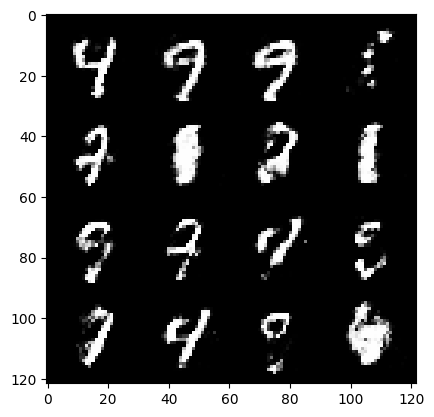

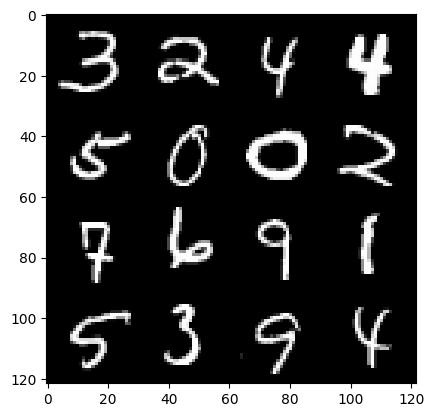

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 248/469 [00:06<00:06, 36.52it/s]

153: step 72000 / Gen Loss: 0.3165694223046302 / Disc Loss: 0.3165694223046302


 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 304/469 [00:07<00:04, 38.61it/s]

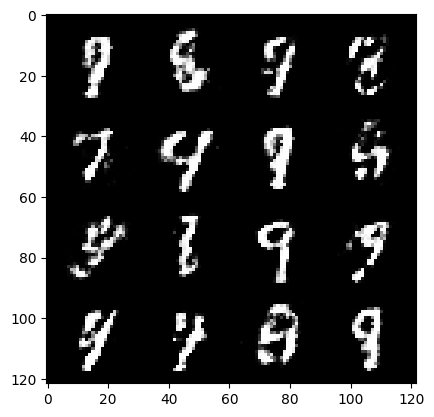

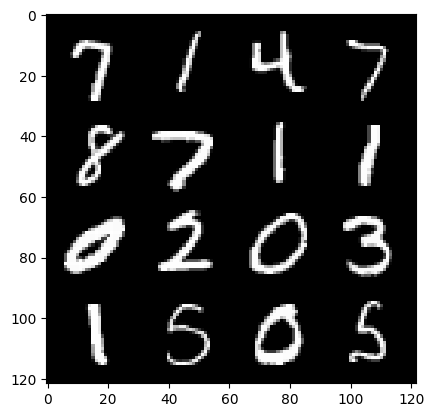

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 312/469 [00:08<00:04, 37.24it/s]

155: step 73000 / Gen Loss: 0.33686208595335454 / Disc Loss: 0.33686208595335454


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 364/469 [00:09<00:02, 38.47it/s]

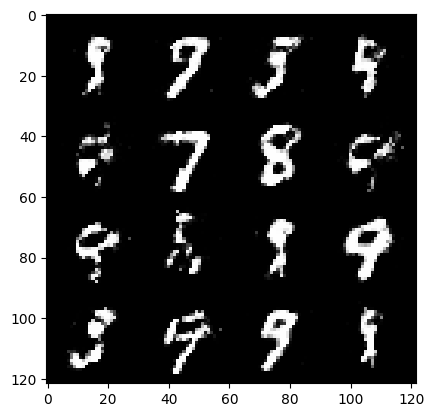

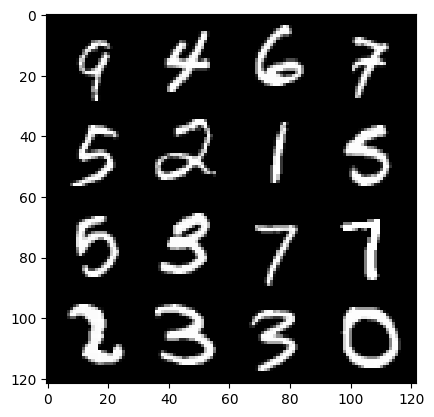

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 376/469 [00:10<00:02, 37.35it/s]

157: step 74000 / Gen Loss: 0.3484606259912252 / Disc Loss: 0.3484606259912252


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 428/469 [00:11<00:01, 38.52it/s]

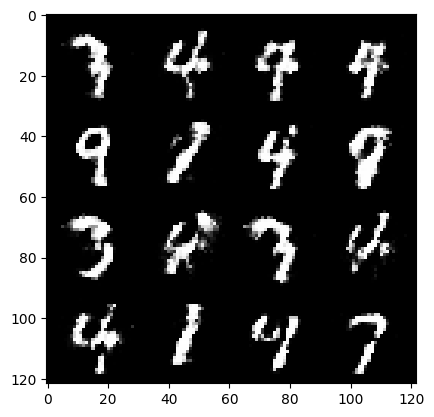

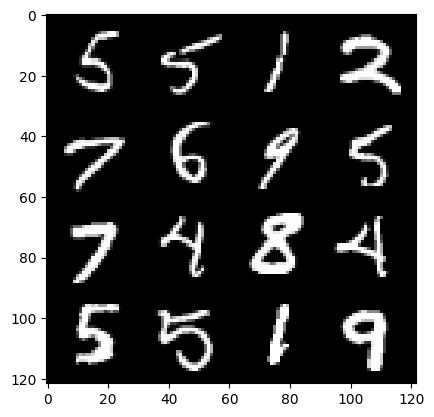

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 436/469 [00:11<00:00, 37.53it/s]

159: step 75000 / Gen Loss: 0.34449415516853343 / Disc Loss: 0.34449415516853343


  4%|███████                                                                                                                                                              | 20/469 [00:00<00:11, 38.68it/s]

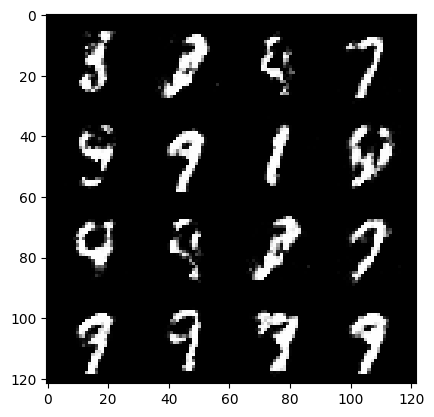

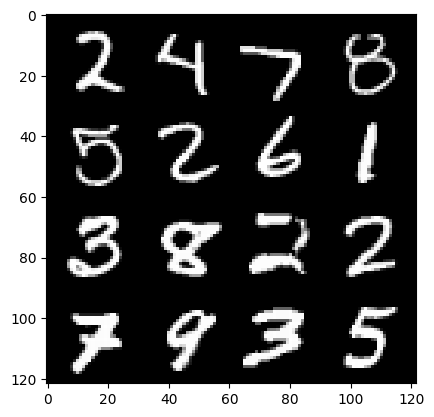

  6%|█████████▊                                                                                                                                                           | 28/469 [00:01<00:16, 27.45it/s]

162: step 76000 / Gen Loss: 0.3496443000882867 / Disc Loss: 0.3496443000882867


 18%|█████████████████████████████▌                                                                                                                                       | 84/469 [00:02<00:10, 38.48it/s]

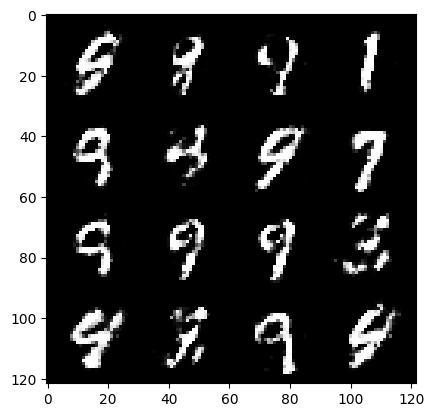

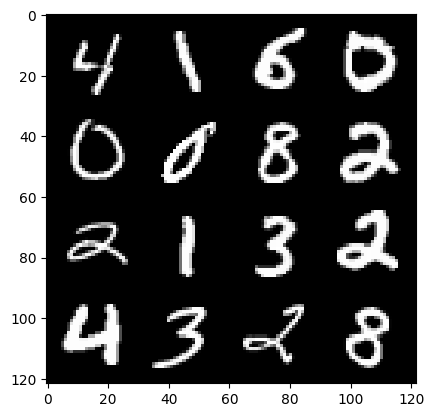

 20%|████████████████████████████████▎                                                                                                                                    | 92/469 [00:02<00:11, 34.20it/s]

164: step 77000 / Gen Loss: 0.35272875404357884 / Disc Loss: 0.35272875404357884


 31%|██████████████████████████████████████████████████▎                                                                                                                 | 144/469 [00:03<00:08, 38.54it/s]

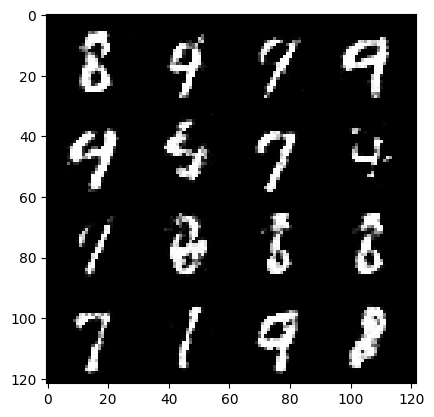

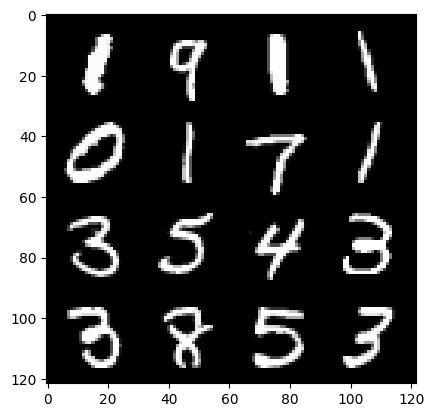

 32%|█████████████████████████████████████████████████████▏                                                                                                              | 152/469 [00:04<00:08, 35.66it/s]

166: step 78000 / Gen Loss: 0.369669912844896 / Disc Loss: 0.369669912844896


 44%|████████████████████████████████████████████████████████████████████████▋                                                                                           | 208/469 [00:05<00:06, 38.73it/s]

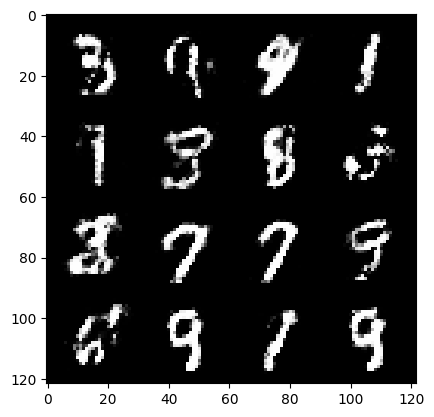

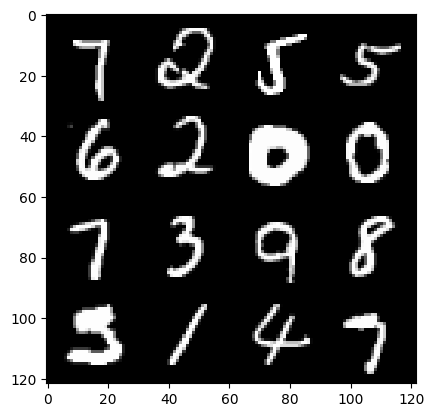

 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                        | 216/469 [00:05<00:06, 36.78it/s]

168: step 79000 / Gen Loss: 0.3818667187988759 / Disc Loss: 0.3818667187988759


 57%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 268/469 [00:06<00:05, 38.74it/s]

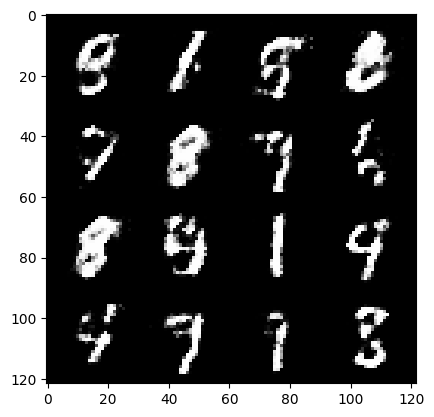

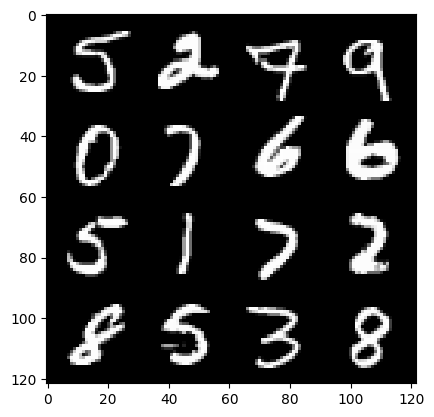

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 276/469 [00:07<00:05, 36.49it/s]

170: step 80000 / Gen Loss: 0.3639264015257355 / Disc Loss: 0.3639264015257355


 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 332/469 [00:08<00:03, 38.69it/s]

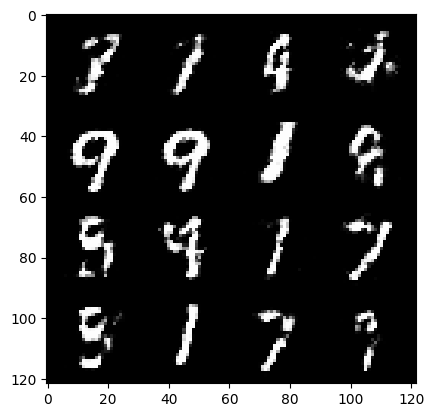

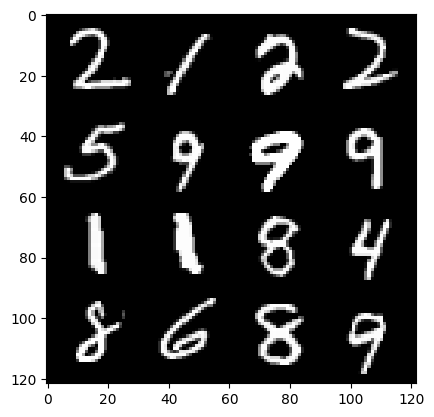

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 340/469 [00:09<00:03, 37.43it/s]

172: step 81000 / Gen Loss: 0.3847926408052443 / Disc Loss: 0.3847926408052443


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 392/469 [00:10<00:02, 38.07it/s]

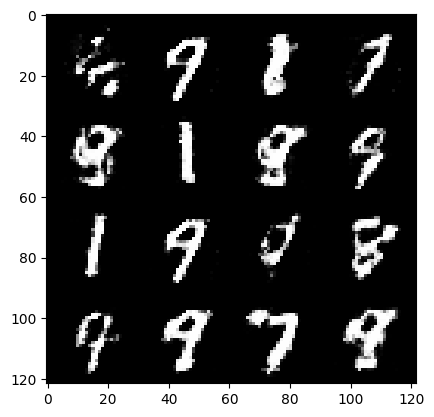

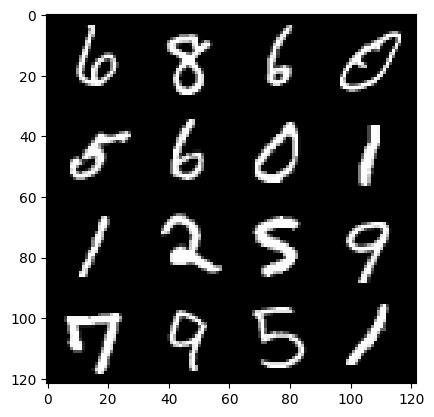

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 400/469 [00:10<00:01, 36.98it/s]

174: step 82000 / Gen Loss: 0.3768709509074692 / Disc Loss: 0.3768709509074692


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 456/469 [00:11<00:00, 38.45it/s]

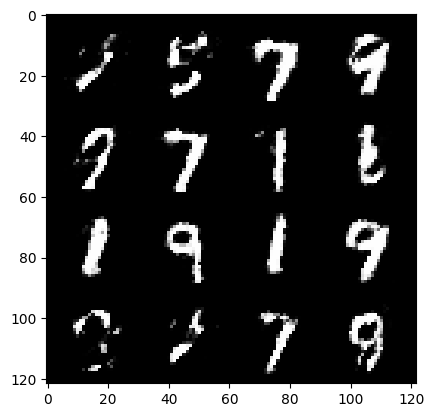

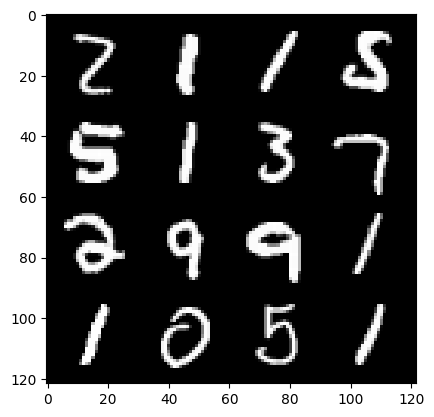

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 464/469 [00:12<00:00, 37.53it/s]

176: step 83000 / Gen Loss: 0.37645799073576935 / Disc Loss: 0.37645799073576935


 10%|████████████████▉                                                                                                                                                    | 48/469 [00:01<00:10, 38.87it/s]

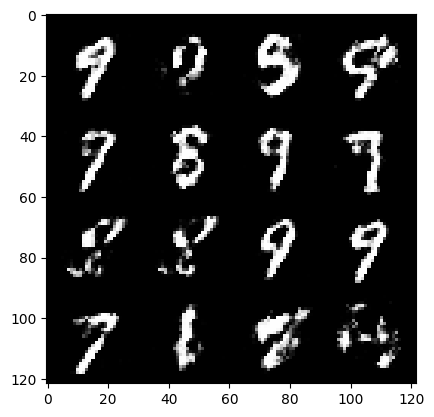

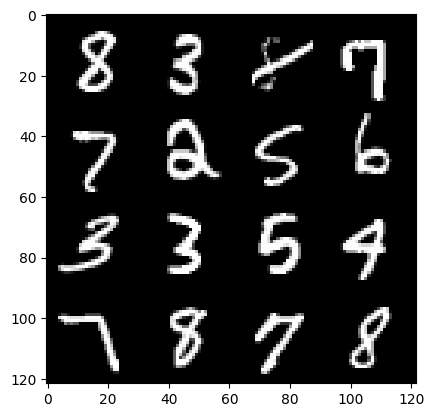

 12%|███████████████████▋                                                                                                                                                 | 56/469 [00:01<00:12, 31.94it/s]

179: step 84000 / Gen Loss: 0.38953792273998206 / Disc Loss: 0.38953792273998206


 23%|█████████████████████████████████████▊                                                                                                                              | 108/469 [00:02<00:09, 38.57it/s]

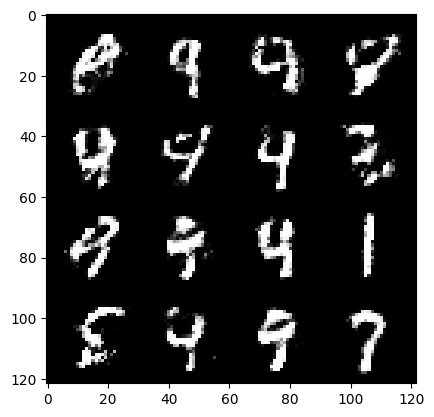

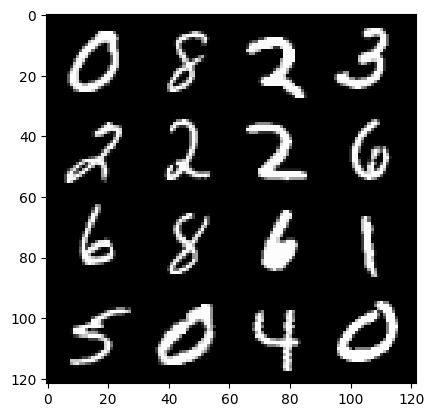

 25%|████████████████████████████████████████▌                                                                                                                           | 116/469 [00:03<00:10, 35.13it/s]

181: step 85000 / Gen Loss: 0.4037036860585211 / Disc Loss: 0.4037036860585211


 37%|████████████████████████████████████████████████████████████▏                                                                                                       | 172/469 [00:04<00:07, 37.84it/s]

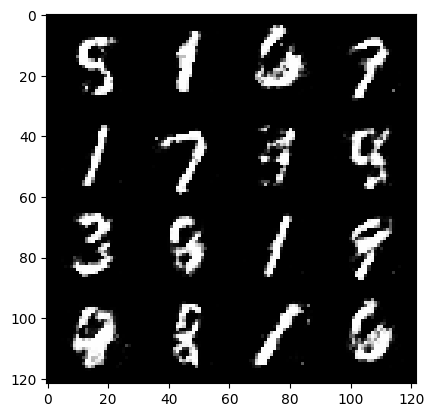

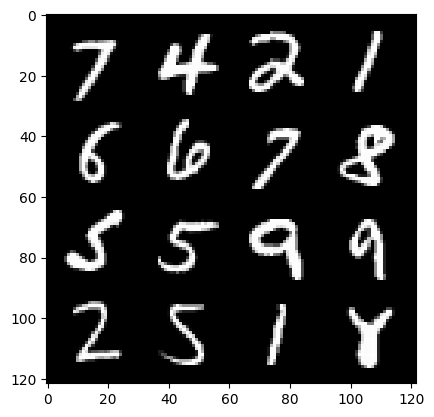

 38%|██████████████████████████████████████████████████████████████▉                                                                                                     | 180/469 [00:05<00:08, 35.59it/s]

183: step 86000 / Gen Loss: 0.413735482960939 / Disc Loss: 0.413735482960939


 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 232/469 [00:05<00:06, 38.71it/s]

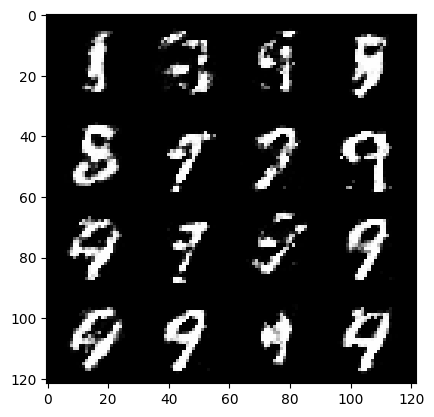

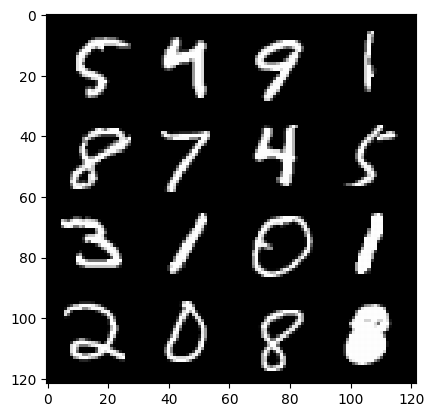

 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 244/469 [00:06<00:06, 36.96it/s]

185: step 87000 / Gen Loss: 0.4164089981615545 / Disc Loss: 0.4164089981615545


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 296/469 [00:07<00:04, 38.48it/s]

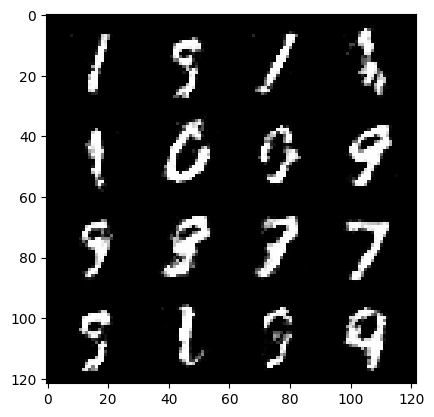

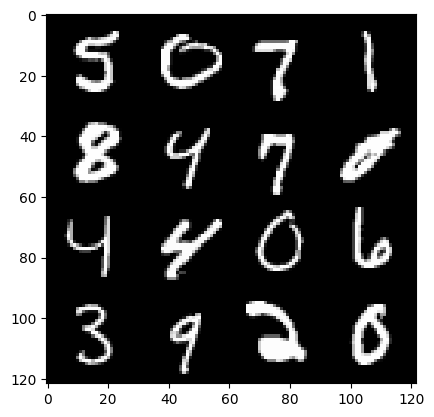

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 304/469 [00:08<00:04, 37.02it/s]

187: step 88000 / Gen Loss: 0.39149968615174263 / Disc Loss: 0.39149968615174263


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 356/469 [00:09<00:02, 38.60it/s]

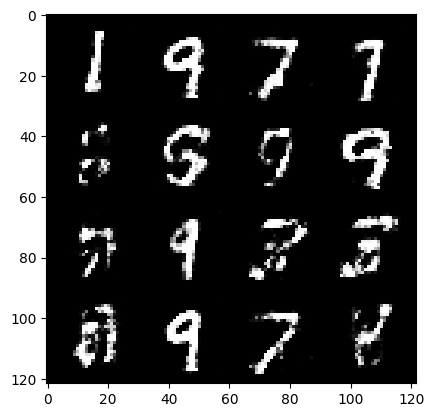

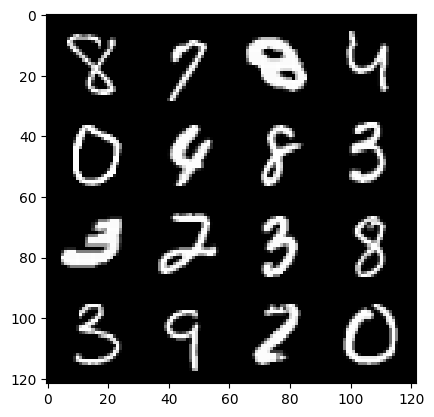

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 364/469 [00:09<00:02, 37.41it/s]

189: step 89000 / Gen Loss: 0.3976016761660571 / Disc Loss: 0.3976016761660571


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 420/469 [00:10<00:01, 38.65it/s]

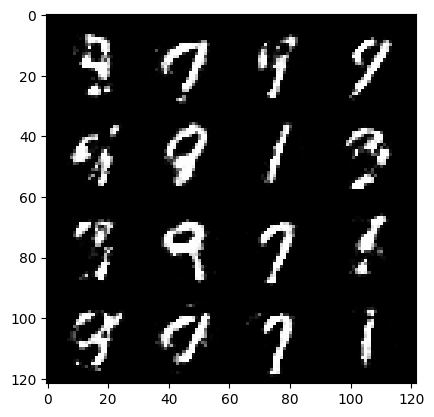

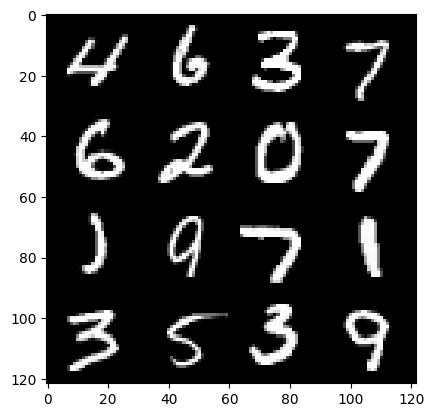

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 428/469 [00:11<00:01, 37.63it/s]

191: step 90000 / Gen Loss: 0.38105781814455947 / Disc Loss: 0.38105781814455947


  3%|████▏                                                                                                                                                                | 12/469 [00:00<00:11, 38.58it/s]

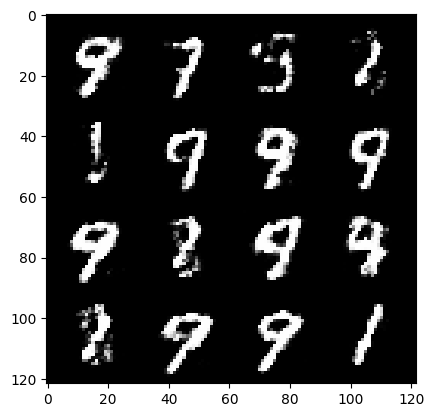

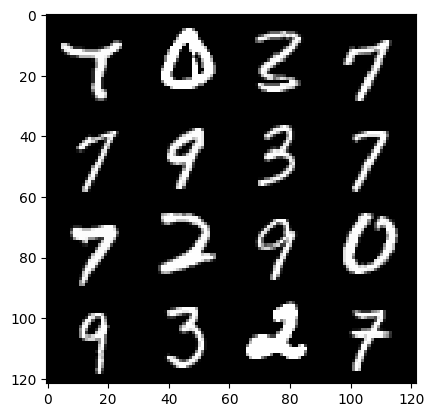

  4%|███████                                                                                                                                                              | 20/469 [00:00<00:18, 24.48it/s]

194: step 91000 / Gen Loss: 0.37958315679431043 / Disc Loss: 0.37958315679431043


 16%|██████████████████████████▋                                                                                                                                          | 76/469 [00:01<00:10, 38.54it/s]

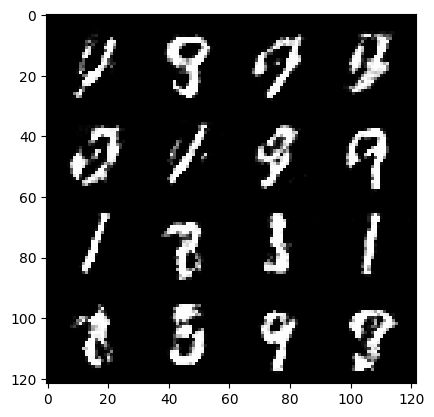

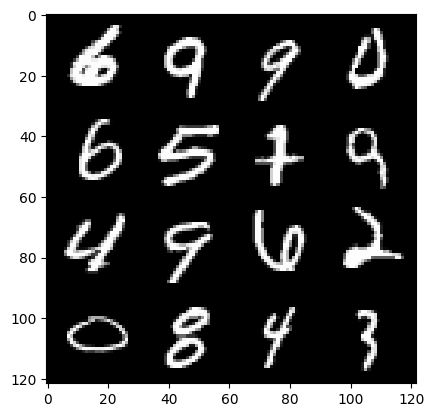

 18%|█████████████████████████████▌                                                                                                                                       | 84/469 [00:02<00:11, 33.72it/s]

196: step 92000 / Gen Loss: 0.3826988713741299 / Disc Loss: 0.3826988713741299


 29%|███████████████████████████████████████████████▌                                                                                                                    | 136/469 [00:03<00:08, 38.60it/s]

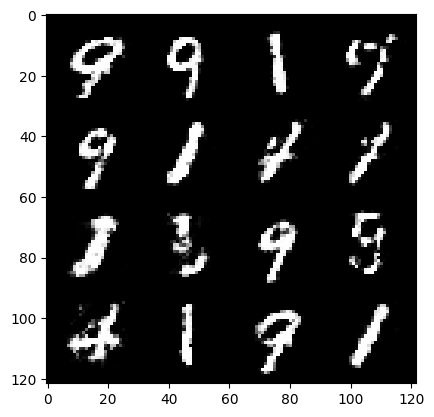

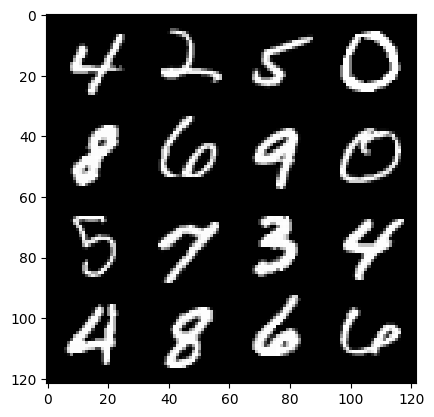

 31%|██████████████████████████████████████████████████▎                                                                                                                 | 144/469 [00:04<00:09, 35.72it/s]

198: step 93000 / Gen Loss: 0.4127483142912387 / Disc Loss: 0.4127483142912387


 43%|█████████████████████████████████████████████████████████████████████▉                                                                                              | 200/469 [00:05<00:06, 38.49it/s]

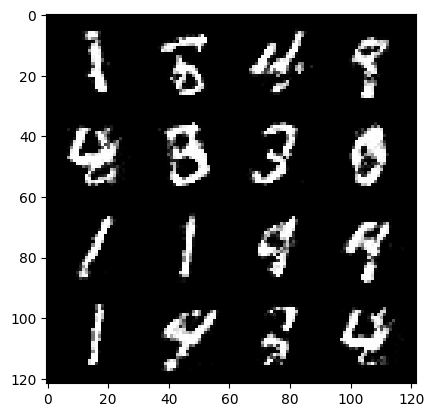

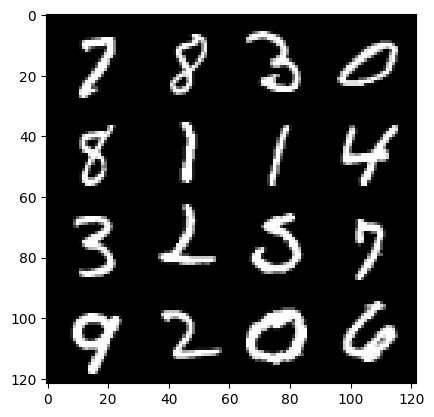

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                           | 208/469 [00:05<00:07, 36.46it/s]

200: step 94000 / Gen Loss: 0.40449253994226486 / Disc Loss: 0.40449253994226486


 55%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 260/469 [00:06<00:05, 38.24it/s]

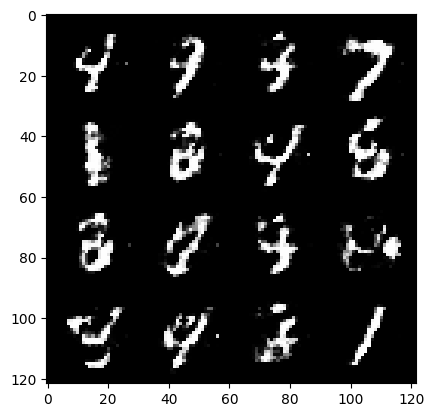

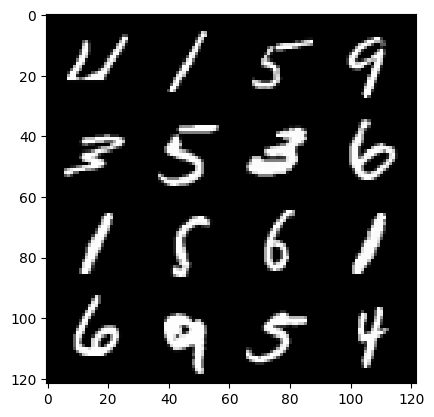

 57%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 268/469 [00:07<00:05, 36.67it/s]

202: step 95000 / Gen Loss: 0.42012602713704117 / Disc Loss: 0.42012602713704117


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 324/469 [00:08<00:03, 38.19it/s]

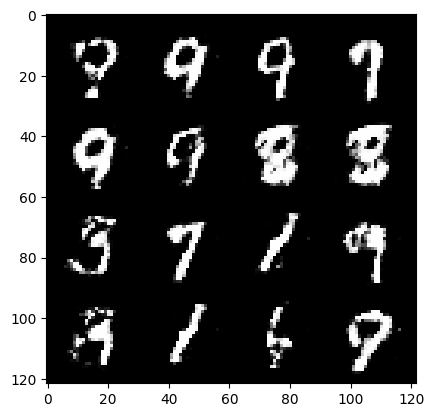

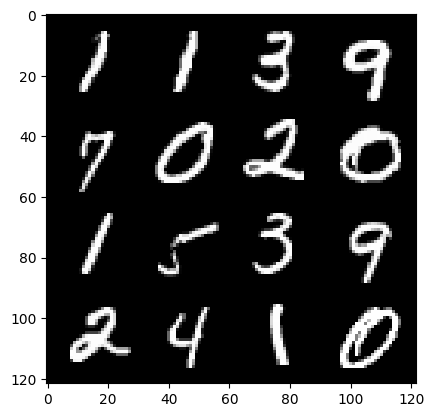

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 328/469 [00:08<00:03, 36.90it/s]

204: step 96000 / Gen Loss: 0.41860174843668924 / Disc Loss: 0.41860174843668924


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 384/469 [00:09<00:02, 38.59it/s]

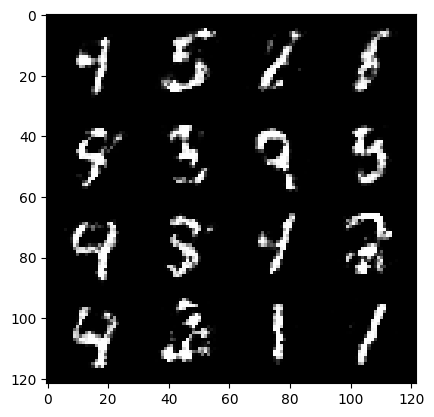

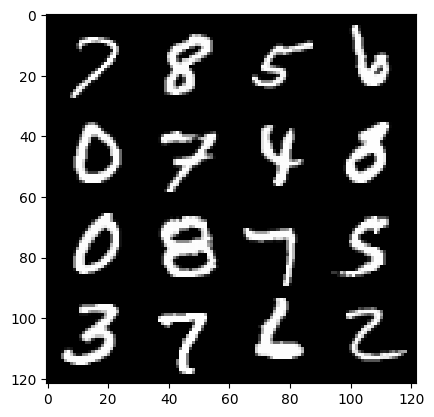

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 392/469 [00:10<00:02, 37.48it/s]

206: step 97000 / Gen Loss: 0.42514844009280145 / Disc Loss: 0.42514844009280145


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 448/469 [00:11<00:00, 38.39it/s]

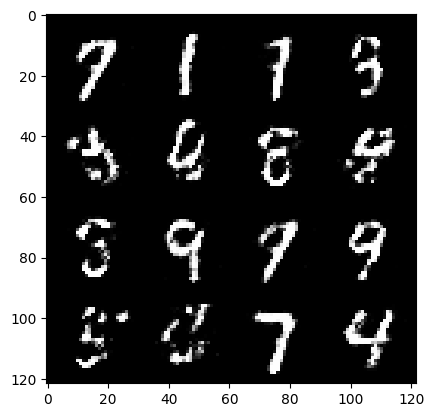

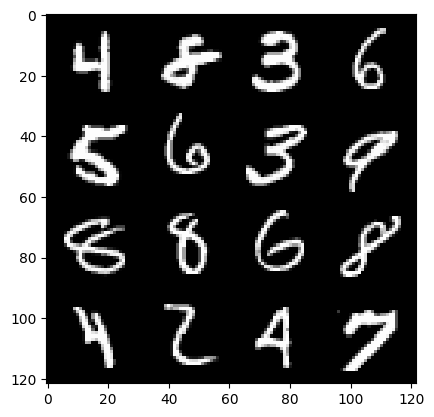

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 456/469 [00:12<00:00, 37.42it/s]

208: step 98000 / Gen Loss: 0.4175389978885647 / Disc Loss: 0.4175389978885647


  9%|██████████████                                                                                                                                                       | 40/469 [00:01<00:10, 39.56it/s]

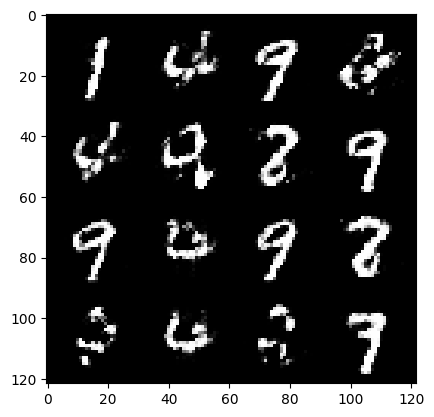

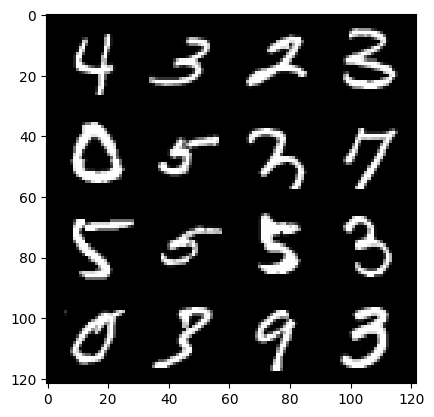

 11%|█████████████████▌                                                                                                                                                   | 50/469 [00:01<00:13, 32.03it/s]

211: step 99000 / Gen Loss: 0.4282174542844295 / Disc Loss: 0.4282174542844295


 22%|███████████████████████████████████▋                                                                                                                                | 102/469 [00:02<00:09, 39.19it/s]

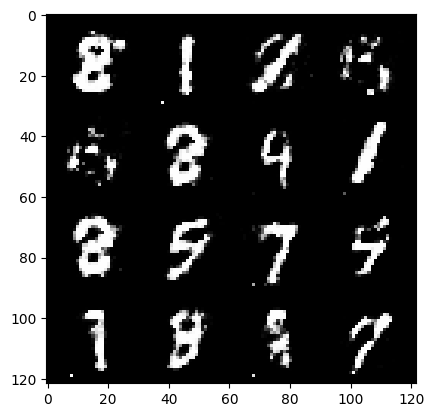

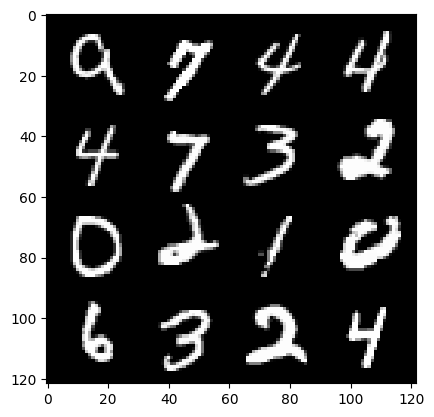

 24%|███████████████████████████████████████▏                                                                                                                            | 112/469 [00:03<00:10, 35.48it/s]

213: step 100000 / Gen Loss: 0.43944050532579465 / Disc Loss: 0.43944050532579465


 35%|█████████████████████████████████████████████████████████▎                                                                                                          | 164/469 [00:04<00:08, 38.01it/s]

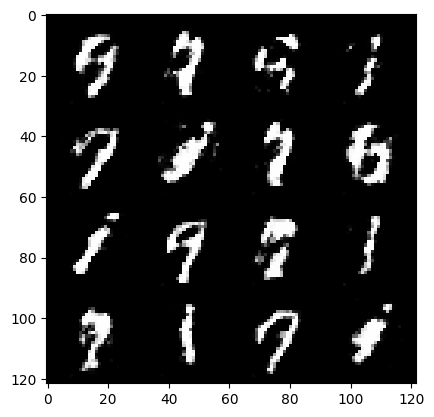

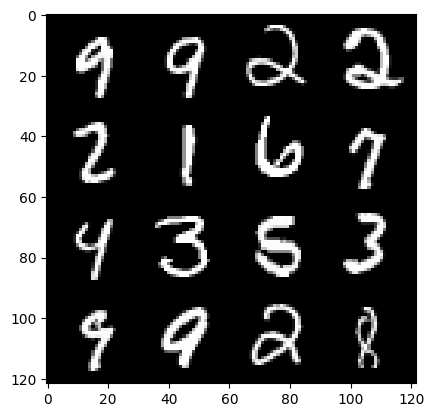

 37%|████████████████████████████████████████████████████████████▏                                                                                                       | 172/469 [00:04<00:08, 35.68it/s]

215: step 101000 / Gen Loss: 0.505438406437636 / Disc Loss: 0.505438406437636


 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                     | 224/469 [00:05<00:06, 37.72it/s]

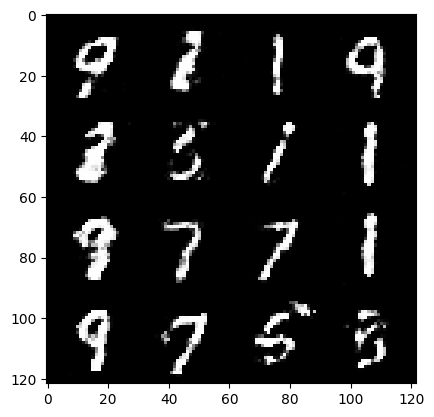

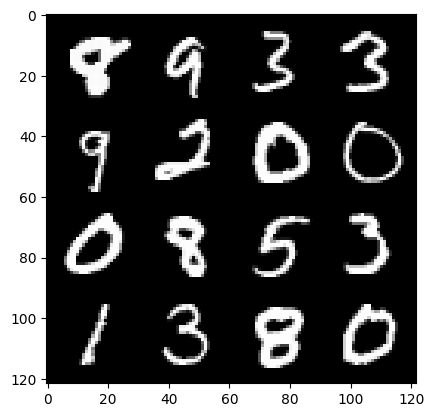

 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 232/469 [00:06<00:06, 35.97it/s]

217: step 102000 / Gen Loss: 0.42394932577013983 / Disc Loss: 0.42394932577013983


 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 288/469 [00:07<00:04, 37.84it/s]

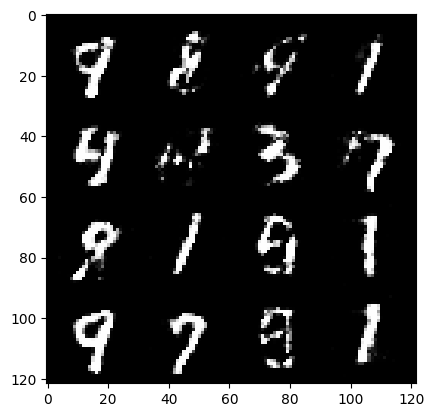

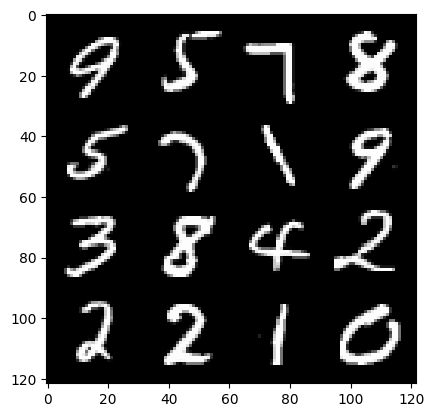

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                            | 296/469 [00:08<00:04, 36.44it/s]

219: step 103000 / Gen Loss: 0.4387123058140279 / Disc Loss: 0.4387123058140279


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 348/469 [00:09<00:03, 37.47it/s]

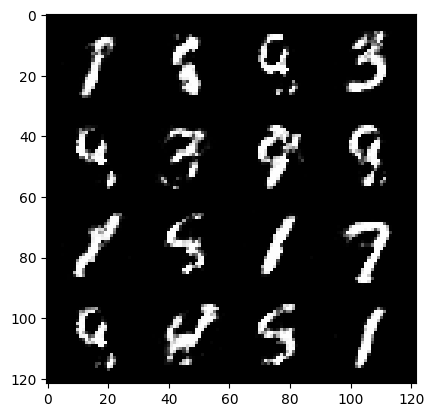

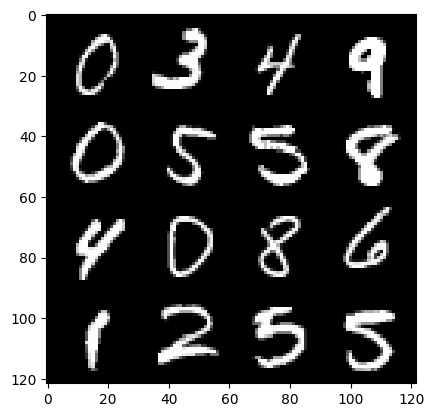

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 356/469 [00:09<00:03, 36.34it/s]

221: step 104000 / Gen Loss: 0.4524443646073343 / Disc Loss: 0.4524443646073343


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 412/469 [00:10<00:01, 37.77it/s]

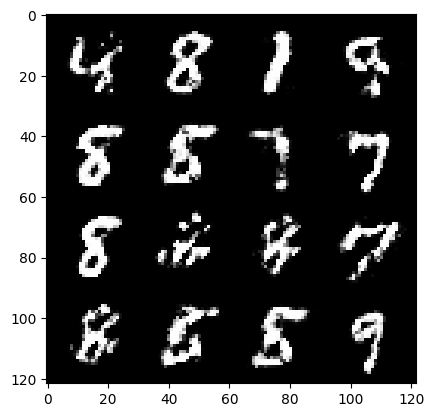

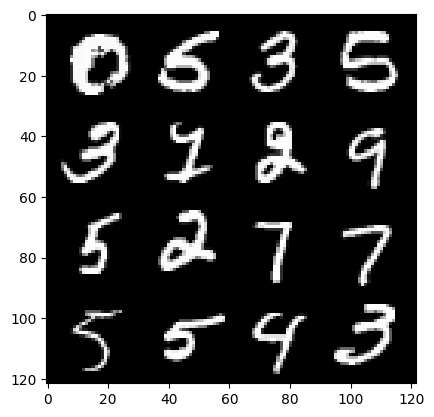

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 420/469 [00:11<00:01, 36.79it/s]

223: step 105000 / Gen Loss: 0.46011818784475317 / Disc Loss: 0.46011818784475317


  1%|█▍                                                                                                                                                                    | 4/469 [00:00<00:12, 37.74it/s]

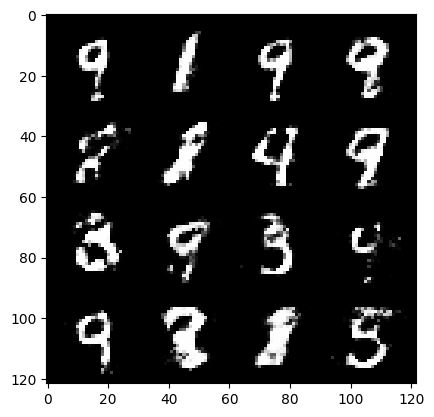

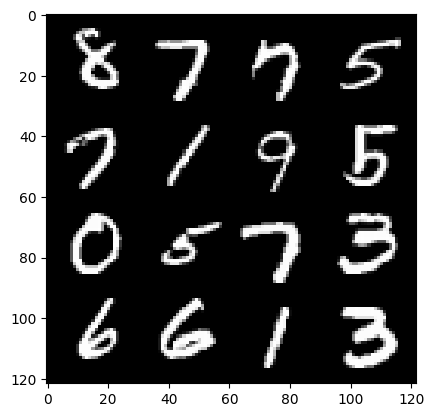

  3%|████▏                                                                                                                                                                | 12/469 [00:00<00:23, 19.54it/s]

226: step 106000 / Gen Loss: 0.45430499714612865 / Disc Loss: 0.45430499714612865


 14%|███████████████████████▉                                                                                                                                             | 68/469 [00:01<00:10, 38.33it/s]

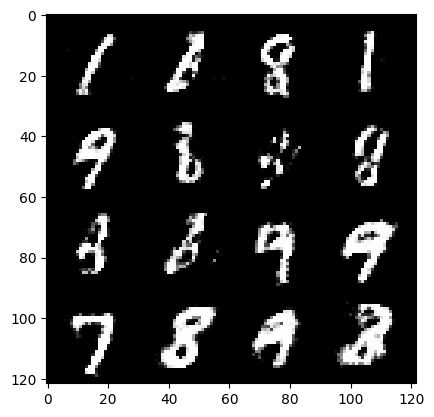

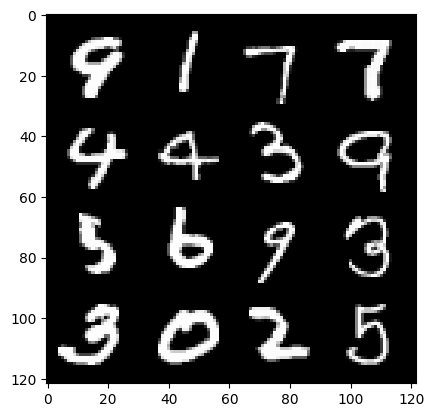

 16%|██████████████████████████▋                                                                                                                                          | 76/469 [00:02<00:11, 33.32it/s]

228: step 107000 / Gen Loss: 0.4552989033758639 / Disc Loss: 0.4552989033758639


 27%|████████████████████████████████████████████                                                                                                                        | 126/469 [00:03<00:08, 38.46it/s]

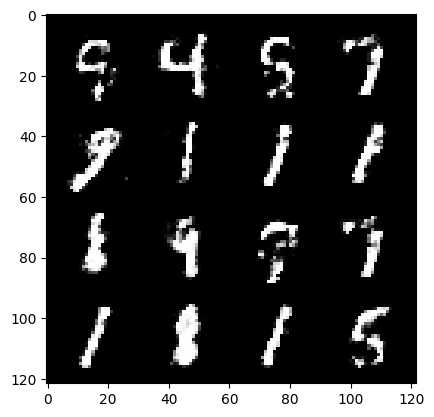

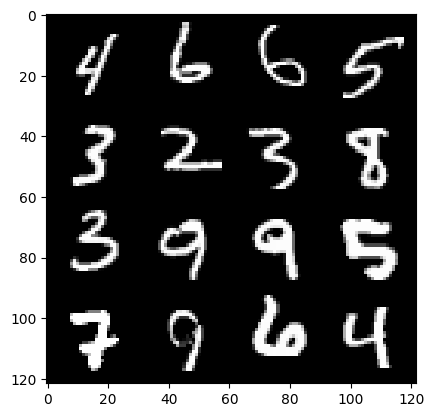

 29%|███████████████████████████████████████████████▌                                                                                                                    | 136/469 [00:03<00:09, 35.44it/s]

230: step 108000 / Gen Loss: 0.4404701211154461 / Disc Loss: 0.4404701211154461


 41%|███████████████████████████████████████████████████████████████████▏                                                                                                | 192/469 [00:05<00:07, 37.81it/s]

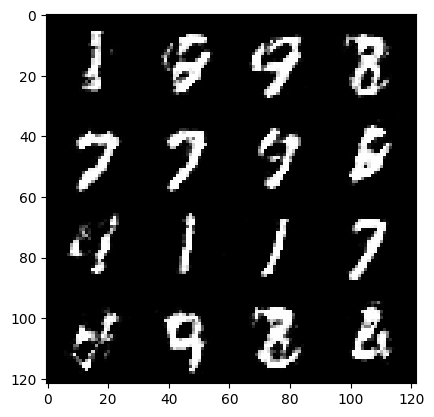

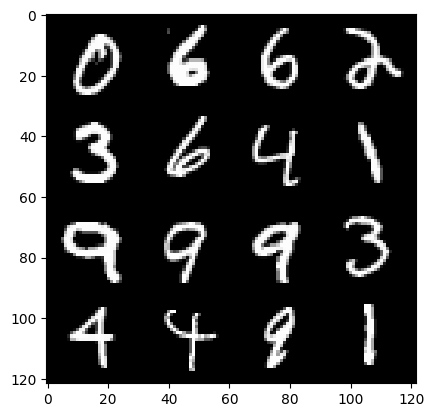

 43%|█████████████████████████████████████████████████████████████████████▉                                                                                              | 200/469 [00:05<00:07, 35.82it/s]

232: step 109000 / Gen Loss: 0.43676204359531356 / Disc Loss: 0.43676204359531356


 54%|████████████████████████████████████████████████████████████████████████████████████████                                                                            | 252/469 [00:06<00:05, 36.32it/s]

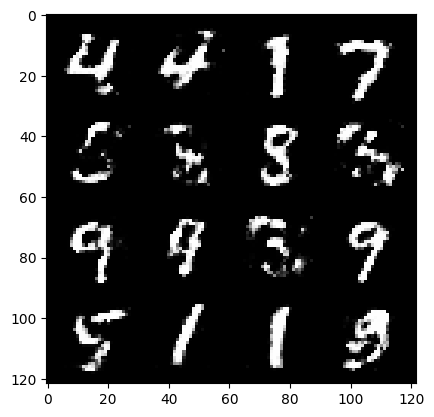

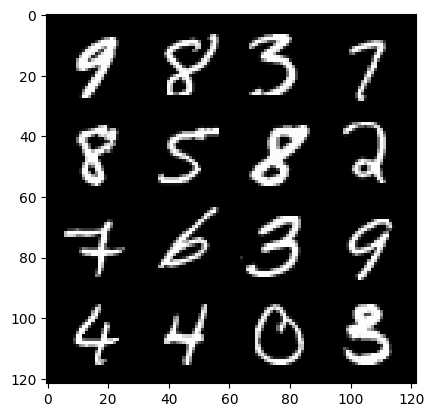

 55%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 260/469 [00:07<00:05, 34.90it/s]

234: step 110000 / Gen Loss: 0.4472403901219368 / Disc Loss: 0.4472403901219368


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 316/469 [00:08<00:04, 37.45it/s]

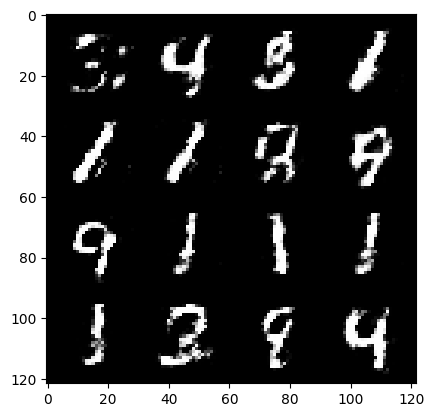

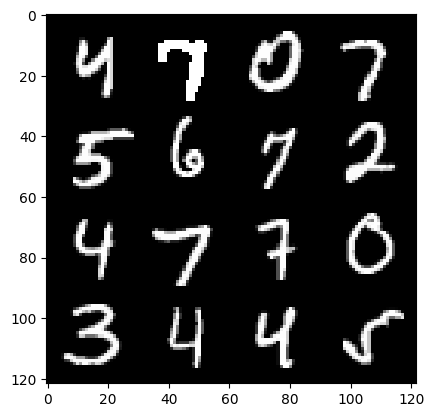

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 324/469 [00:08<00:04, 36.04it/s]

236: step 111000 / Gen Loss: 0.4497051900923254 / Disc Loss: 0.4497051900923254


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 376/469 [00:10<00:02, 37.39it/s]

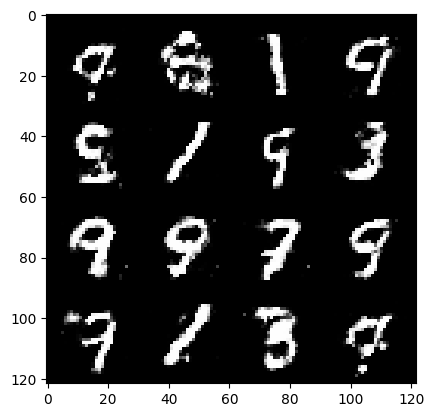

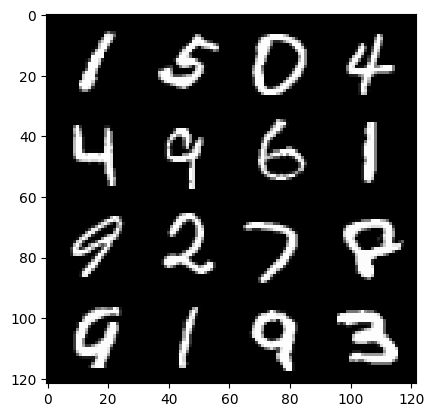

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 384/469 [00:10<00:02, 36.35it/s]

238: step 112000 / Gen Loss: 0.4512990373075011 / Disc Loss: 0.4512990373075011


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 440/469 [00:11<00:00, 37.55it/s]

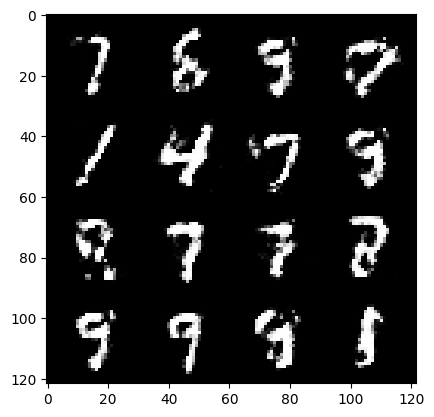

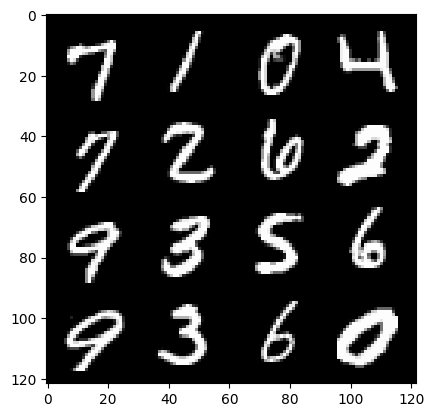

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 444/469 [00:12<00:00, 36.60it/s]

240: step 113000 / Gen Loss: 0.4490033126473431 / Disc Loss: 0.4490033126473431


  7%|███████████▎                                                                                                                                                         | 32/469 [00:00<00:11, 37.47it/s]

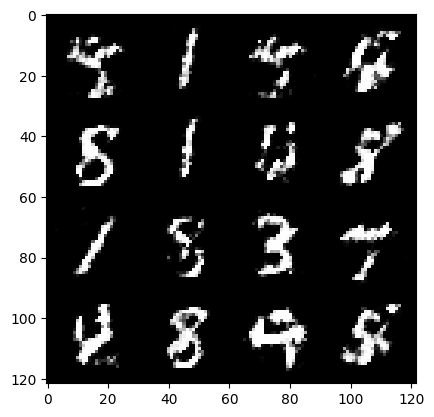

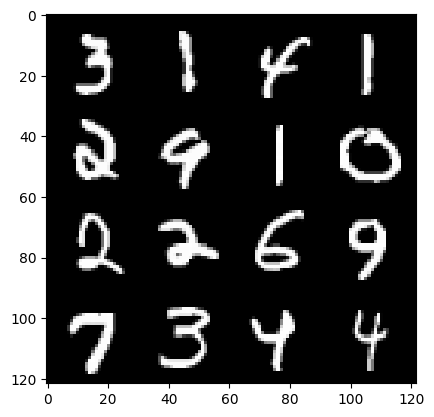

  9%|██████████████                                                                                                                                                       | 40/469 [00:01<00:14, 29.22it/s]

243: step 114000 / Gen Loss: 0.44814361405372605 / Disc Loss: 0.44814361405372605


 20%|████████████████████████████████▎                                                                                                                                    | 92/469 [00:02<00:09, 37.94it/s]

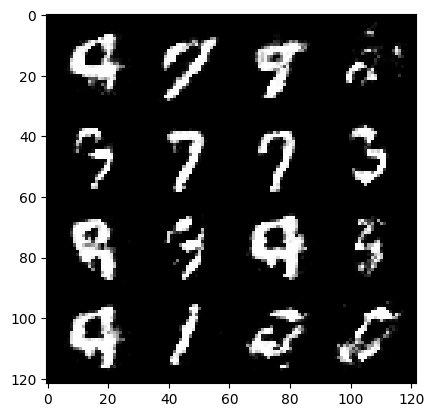

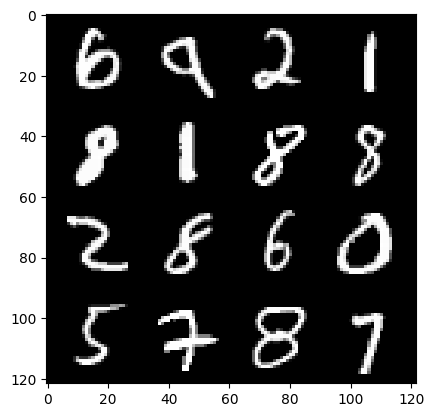

 21%|██████████████████████████████████▉                                                                                                                                 | 100/469 [00:02<00:10, 33.98it/s]

245: step 115000 / Gen Loss: 0.4408089459240438 / Disc Loss: 0.4408089459240438


 33%|██████████████████████████████████████████████████████▌                                                                                                             | 156/469 [00:04<00:08, 37.65it/s]

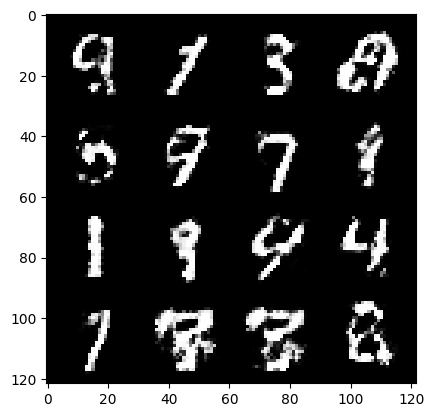

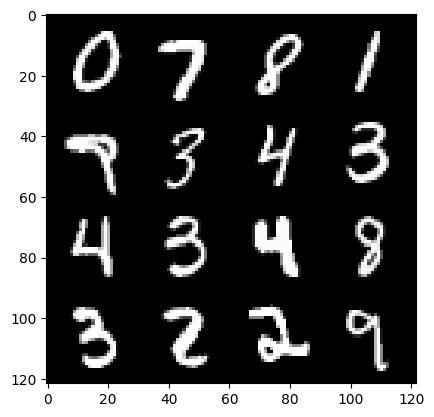

 35%|█████████████████████████████████████████████████████████▎                                                                                                          | 164/469 [00:04<00:08, 34.20it/s]

247: step 116000 / Gen Loss: 0.4718646071851255 / Disc Loss: 0.4718646071851255


 46%|███████████████████████████████████████████████████████████████████████████▌                                                                                        | 216/469 [00:06<00:07, 35.93it/s]

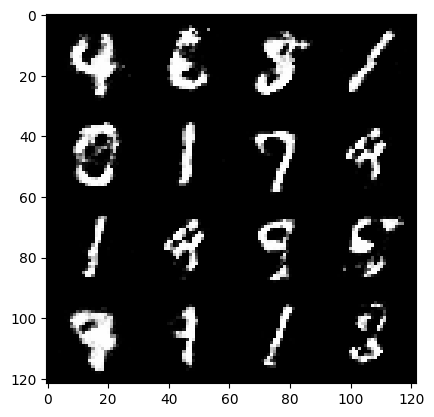

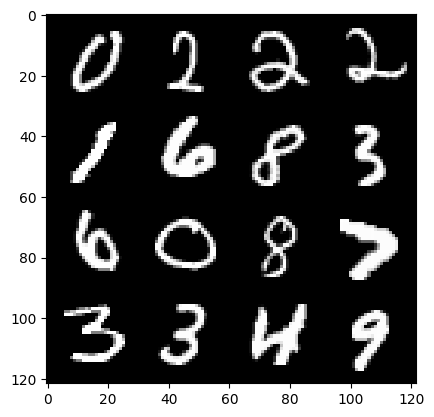

 48%|██████████████████████████████████████████████████████████████████████████████▎                                                                                     | 224/469 [00:06<00:07, 34.28it/s]

249: step 117000 / Gen Loss: 0.46963335022330255 / Disc Loss: 0.46963335022330255


 60%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 280/469 [00:07<00:05, 36.39it/s]

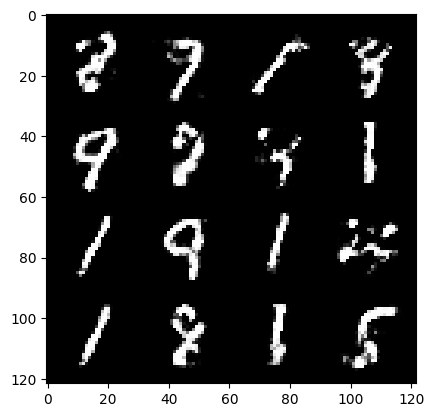

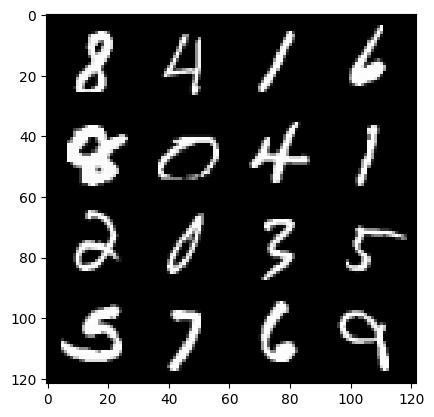

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 288/469 [00:08<00:05, 35.02it/s]

251: step 118000 / Gen Loss: 0.4697346613407142 / Disc Loss: 0.4697346613407142


 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 340/469 [00:10<00:03, 33.18it/s]

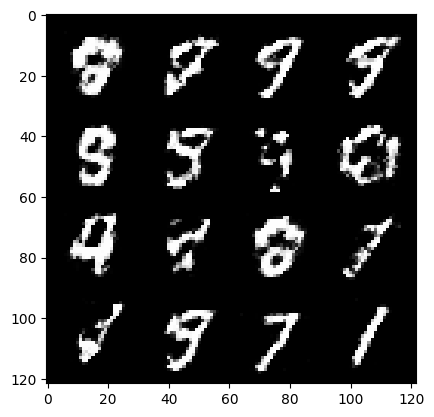

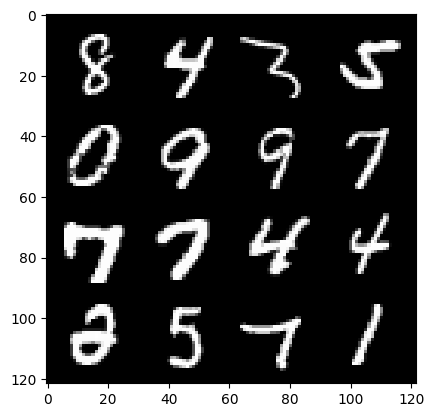

 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                          | 348/469 [00:10<00:03, 32.23it/s]

253: step 119000 / Gen Loss: 0.4790021654963494 / Disc Loss: 0.4790021654963494


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 404/469 [00:12<00:01, 33.65it/s]

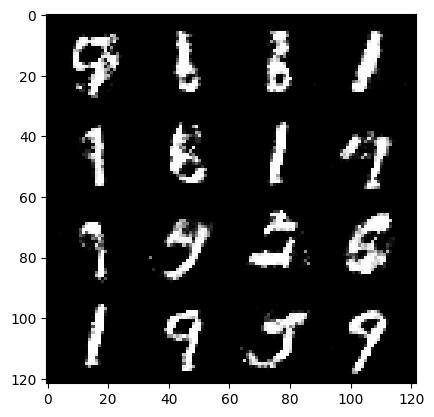

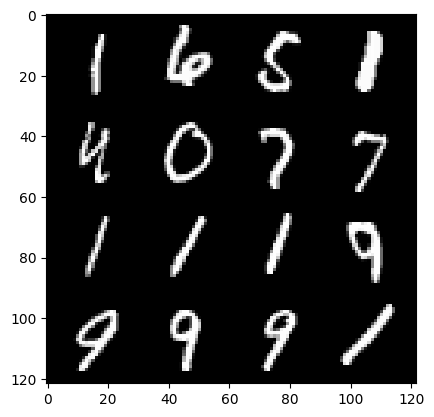

 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 412/469 [00:12<00:01, 32.87it/s]

255: step 120000 / Gen Loss: 0.4947112362086769 / Disc Loss: 0.4947112362086769


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 464/469 [00:12<00:00, 38.07it/s]

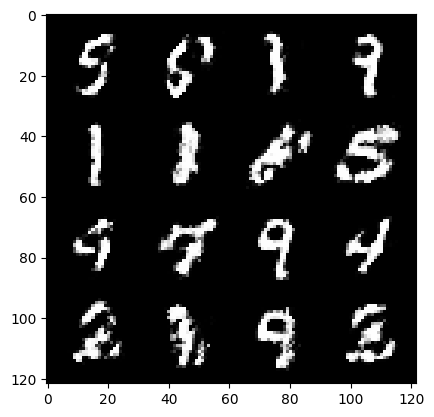

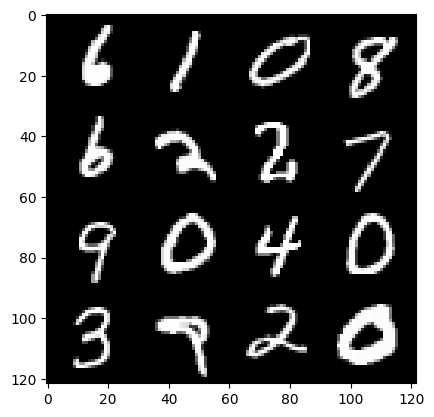

  1%|█▍                                                                                                                                                                    | 4/469 [00:00<00:12, 37.74it/s]

257: step 121000 / Gen Loss: 0.47991033032536495 / Disc Loss: 0.47991033032536495


 13%|█████████████████████                                                                                                                                                | 60/469 [00:01<00:10, 38.46it/s]

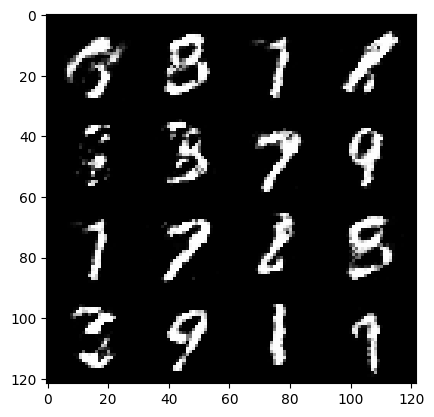

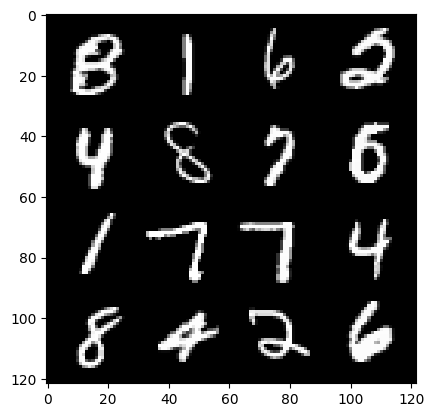

 14%|███████████████████████▉                                                                                                                                             | 68/469 [00:02<00:12, 32.85it/s]

260: step 122000 / Gen Loss: 0.47773964405059804 / Disc Loss: 0.47773964405059804


 26%|█████████████████████████████████████████▉                                                                                                                          | 120/469 [00:03<00:08, 38.78it/s]

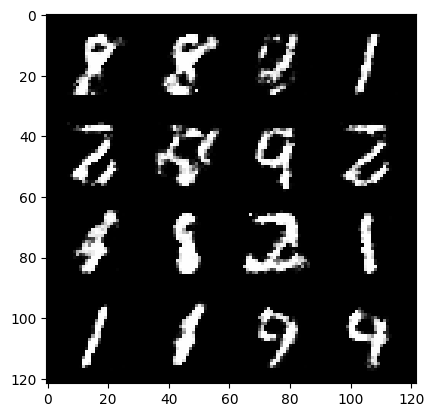

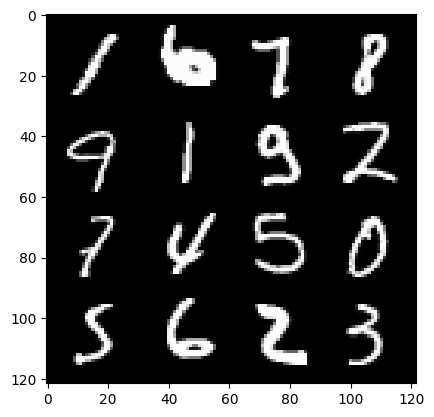

 27%|████████████████████████████████████████████▊                                                                                                                       | 128/469 [00:03<00:09, 35.55it/s]

262: step 123000 / Gen Loss: 0.4754382223188877 / Disc Loss: 0.4754382223188877


 39%|████████████████████████████████████████████████████████████████▎                                                                                                   | 184/469 [00:04<00:07, 38.63it/s]

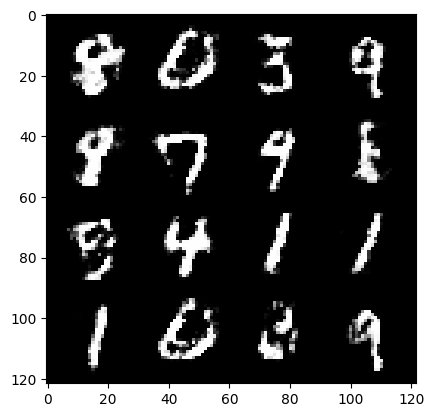

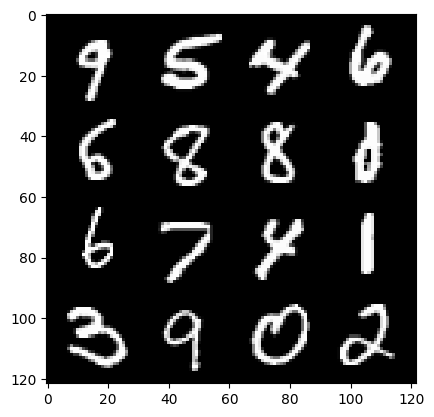

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                  | 188/469 [00:05<00:07, 36.39it/s]

264: step 124000 / Gen Loss: 0.4924036124050623 / Disc Loss: 0.4924036124050623


 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 244/469 [00:06<00:05, 38.72it/s]

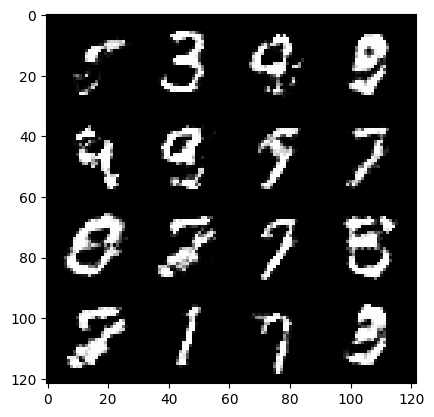

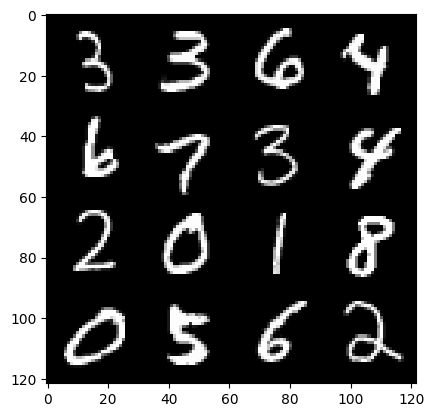

 54%|████████████████████████████████████████████████████████████████████████████████████████                                                                            | 252/469 [00:06<00:05, 37.00it/s]

266: step 125000 / Gen Loss: 0.5059887780547142 / Disc Loss: 0.5059887780547142


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 308/469 [00:07<00:04, 38.67it/s]

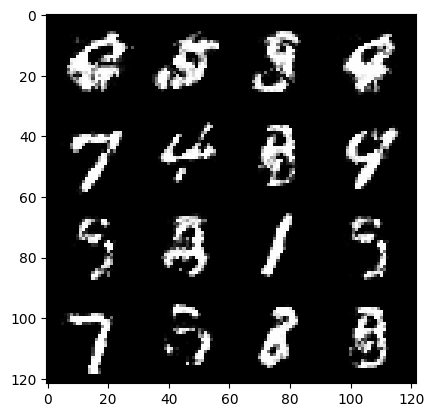

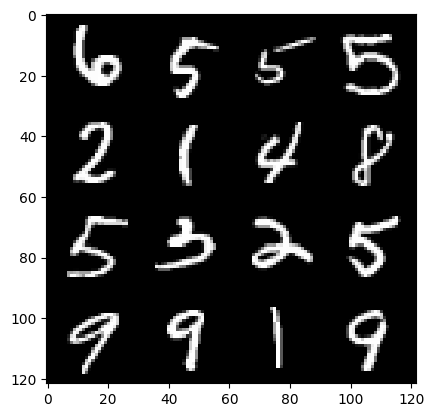

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 312/469 [00:08<00:04, 37.29it/s]

268: step 126000 / Gen Loss: 0.5008912250101566 / Disc Loss: 0.5008912250101566


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 368/469 [00:09<00:02, 38.80it/s]

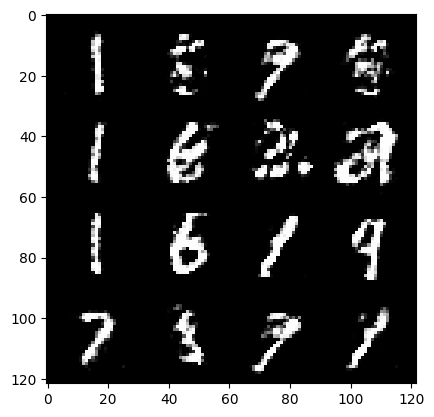

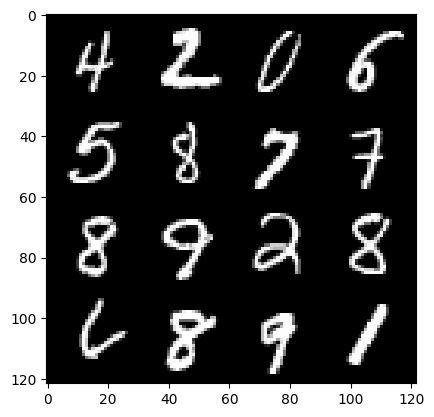

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 376/469 [00:09<00:02, 37.64it/s]

270: step 127000 / Gen Loss: 0.48497948354482623 / Disc Loss: 0.48497948354482623


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 430/469 [00:11<00:01, 37.71it/s]

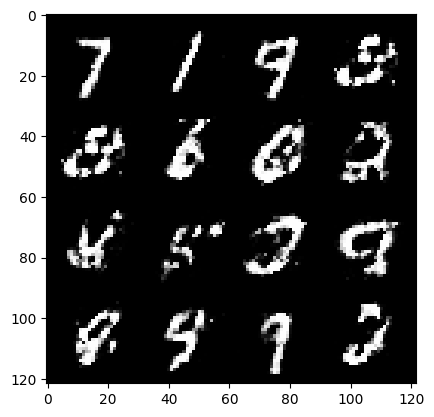

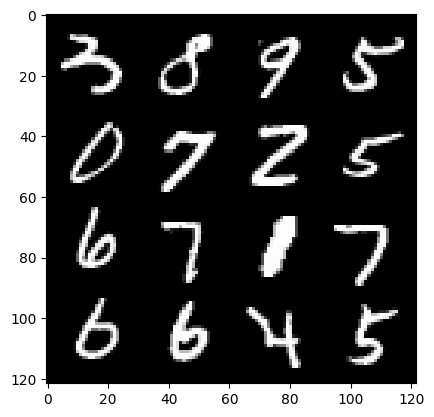

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 440/469 [00:11<00:00, 36.77it/s]

272: step 128000 / Gen Loss: 0.48692213490605385 / Disc Loss: 0.48692213490605385


  5%|████████▍                                                                                                                                                            | 24/469 [00:00<00:11, 38.65it/s]

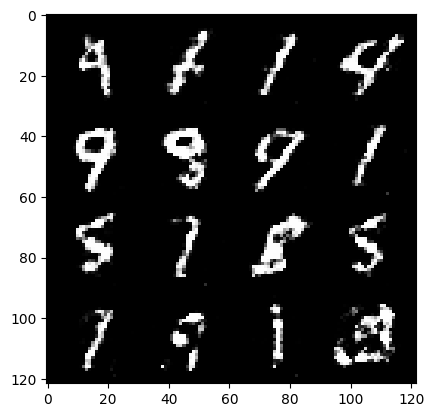

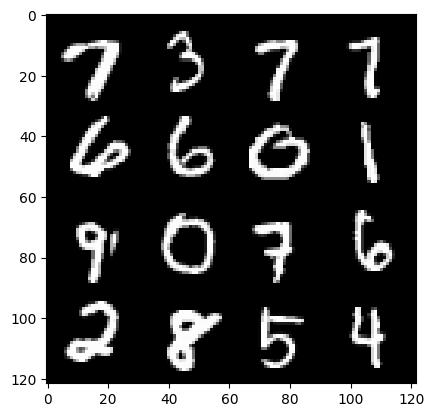

  7%|███████████▎                                                                                                                                                         | 32/469 [00:01<00:15, 28.37it/s]

275: step 129000 / Gen Loss: 0.4922170707285408 / Disc Loss: 0.4922170707285408


 18%|█████████████████████████████▌                                                                                                                                       | 84/469 [00:02<00:09, 38.80it/s]

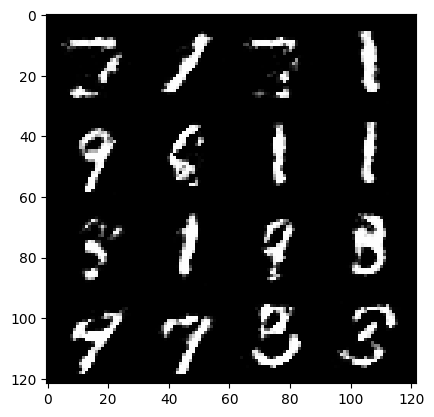

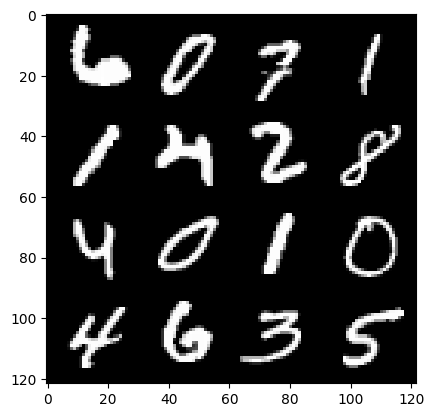

 20%|█████████████████████████████████▊                                                                                                                                   | 96/469 [00:02<00:10, 34.47it/s]

277: step 130000 / Gen Loss: 0.48140350520610836 / Disc Loss: 0.48140350520610836


 32%|███████████████████████████████████████████████████▊                                                                                                                | 148/469 [00:03<00:08, 38.42it/s]

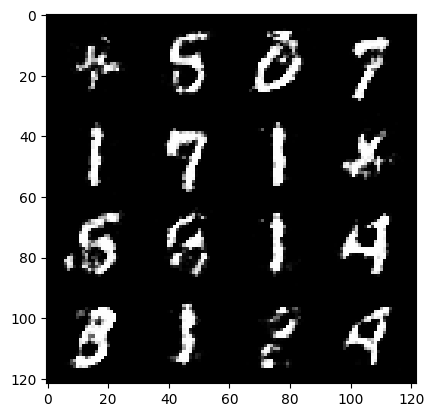

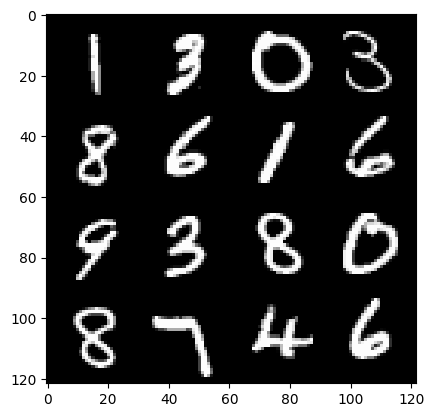

 33%|██████████████████████████████████████████████████████▌                                                                                                             | 156/469 [00:04<00:08, 35.82it/s]

279: step 131000 / Gen Loss: 0.4787196764945979 / Disc Loss: 0.4787196764945979


 44%|████████████████████████████████████████████████████████████████████████▋                                                                                           | 208/469 [00:05<00:06, 38.70it/s]

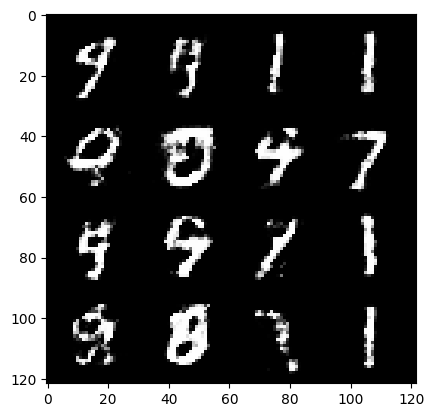

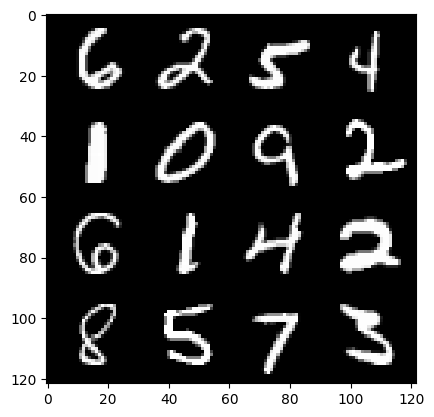

 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                       | 220/469 [00:05<00:06, 36.75it/s]

281: step 132000 / Gen Loss: 0.47260476207733165 / Disc Loss: 0.47260476207733165


 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 272/469 [00:07<00:05, 38.83it/s]

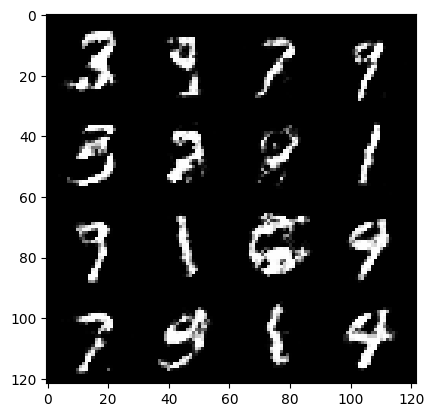

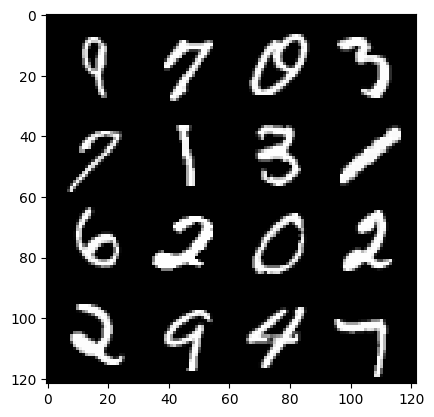

 60%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                  | 280/469 [00:07<00:05, 37.28it/s]

283: step 133000 / Gen Loss: 0.48068818727135587 / Disc Loss: 0.48068818727135587


 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 332/469 [00:08<00:03, 37.82it/s]

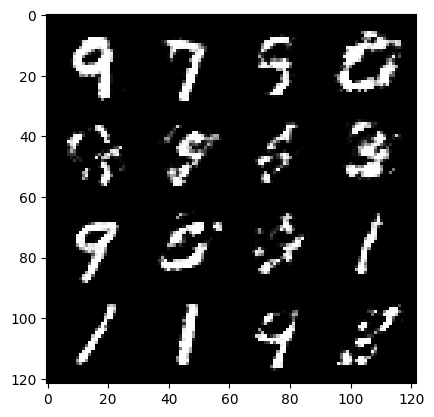

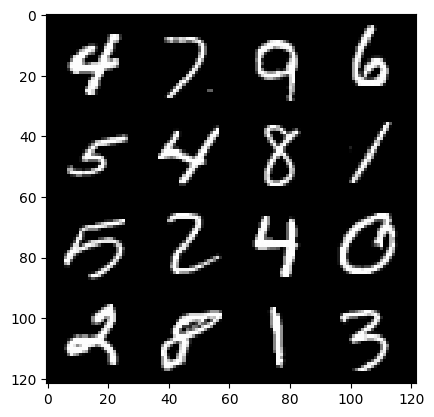

 72%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 340/469 [00:09<00:03, 36.63it/s]

285: step 134000 / Gen Loss: 0.5001027264893055 / Disc Loss: 0.5001027264893055


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 396/469 [00:10<00:01, 38.63it/s]

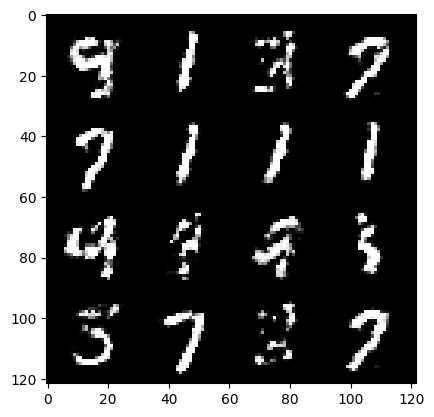

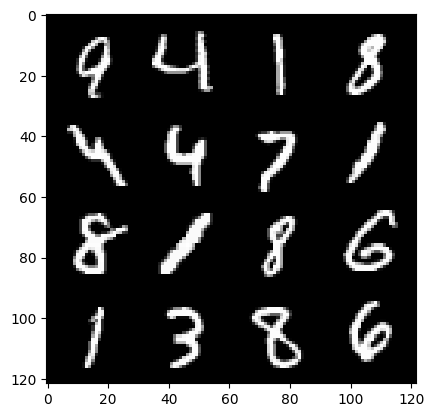

 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 404/469 [00:10<00:01, 37.55it/s]

287: step 135000 / Gen Loss: 0.5070034250319007 / Disc Loss: 0.5070034250319007


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 456/469 [00:11<00:00, 38.72it/s]

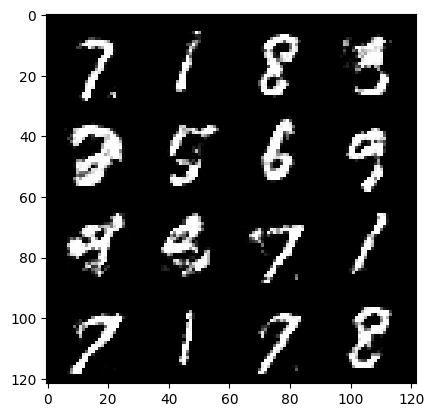

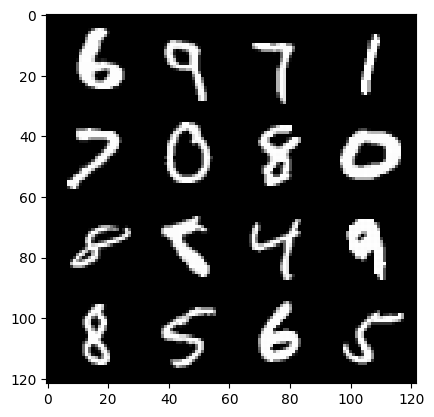

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 464/469 [00:12<00:00, 37.78it/s]

289: step 136000 / Gen Loss: 0.49906604734063176 / Disc Loss: 0.49906604734063176


 11%|██████████████████▎                                                                                                                                                  | 52/469 [00:01<00:10, 38.63it/s]

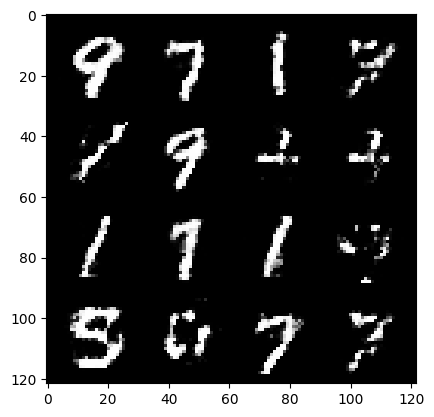

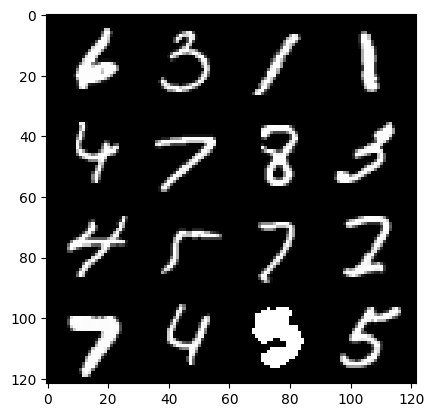

 12%|███████████████████▋                                                                                                                                                 | 56/469 [00:01<00:12, 32.11it/s]

292: step 137000 / Gen Loss: 0.4910762656033042 / Disc Loss: 0.4910762656033042


 24%|███████████████████████████████████████▏                                                                                                                            | 112/469 [00:03<00:09, 37.25it/s]

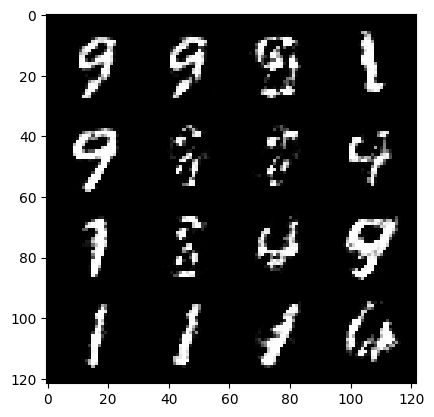

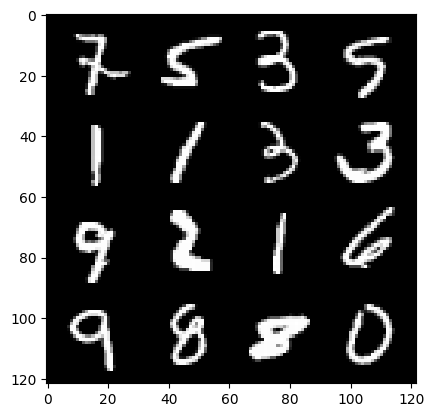

 26%|█████████████████████████████████████████▉                                                                                                                          | 120/469 [00:03<00:10, 34.06it/s]

294: step 138000 / Gen Loss: 0.48586662885546683 / Disc Loss: 0.48586662885546683


 38%|█████████████████████████████████████████████████████████████▌                                                                                                      | 176/469 [00:04<00:07, 38.66it/s]

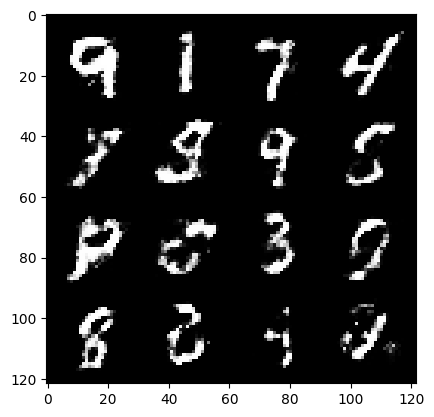

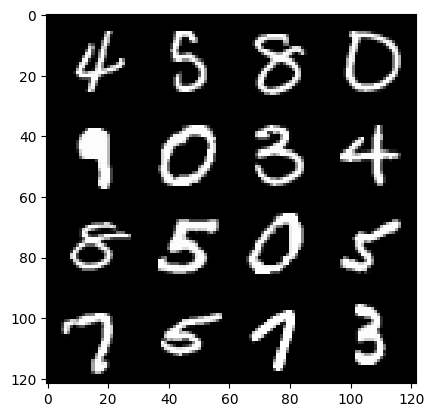

 39%|████████████████████████████████████████████████████████████████▎                                                                                                   | 184/469 [00:05<00:07, 36.37it/s]

296: step 139000 / Gen Loss: 0.4897180108726027 / Disc Loss: 0.4897180108726027


 50%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 236/469 [00:06<00:06, 38.31it/s]

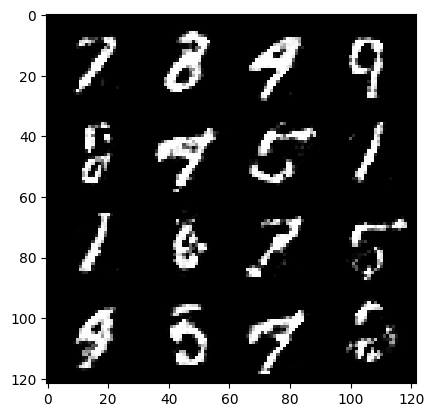

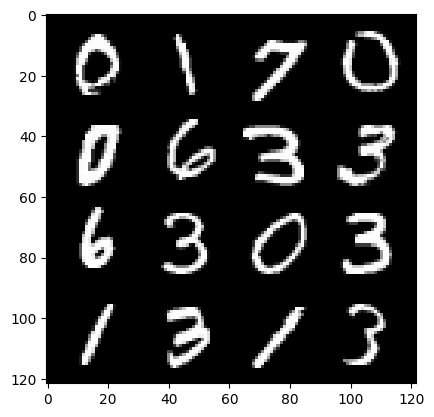

 52%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 244/469 [00:06<00:06, 36.59it/s]

298: step 140000 / Gen Loss: 0.4691064365804197 / Disc Loss: 0.4691064365804197


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 300/469 [00:07<00:04, 38.37it/s]

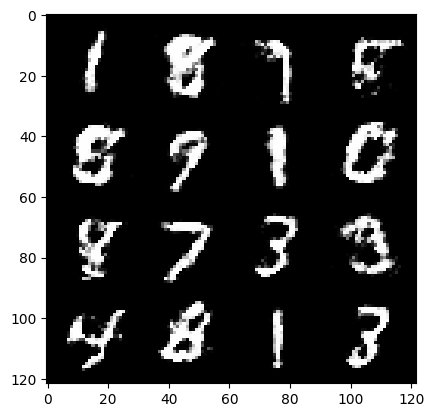

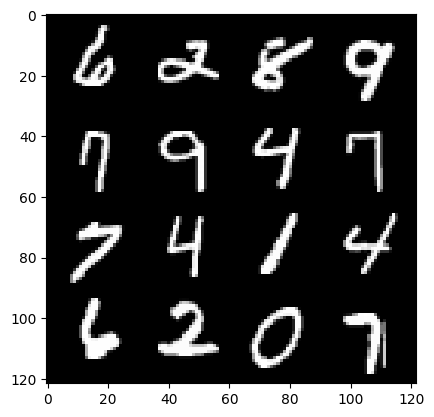

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 308/469 [00:08<00:04, 37.00it/s]

300: step 141000 / Gen Loss: 0.4874187714159485 / Disc Loss: 0.4874187714159485


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 360/469 [00:09<00:02, 38.63it/s]

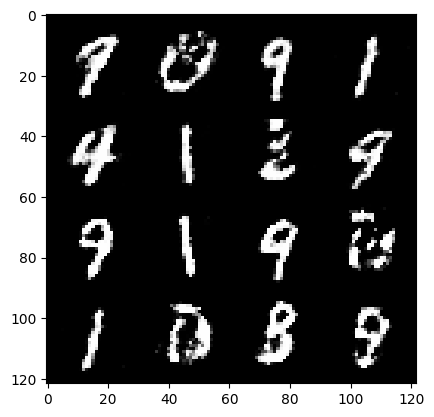

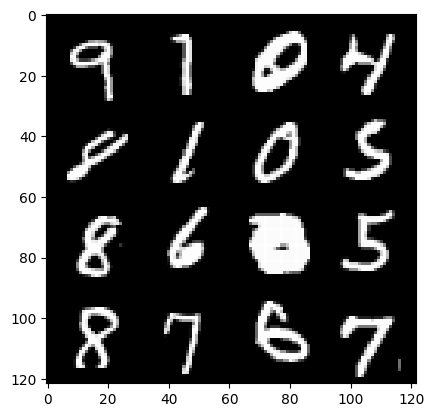

 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 368/469 [00:09<00:02, 37.48it/s]

302: step 142000 / Gen Loss: 0.49032579150795985 / Disc Loss: 0.49032579150795985


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 424/469 [00:10<00:01, 38.76it/s]

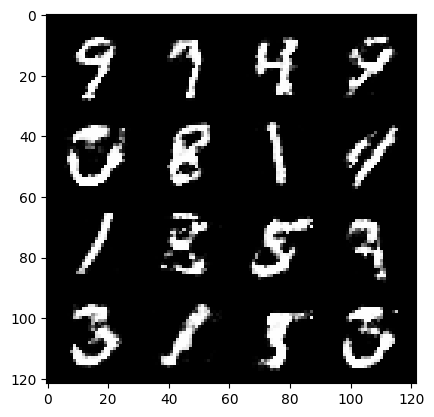

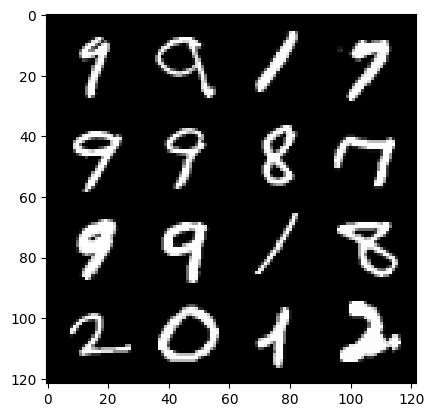

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 432/469 [00:11<00:00, 37.75it/s]

304: step 143000 / Gen Loss: 0.48802553421258943 / Disc Loss: 0.48802553421258943


  3%|█████▋                                                                                                                                                               | 16/469 [00:00<00:11, 38.65it/s]

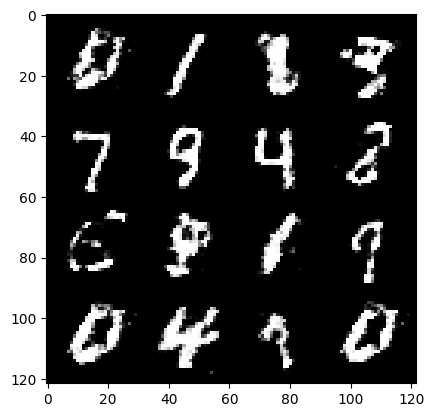

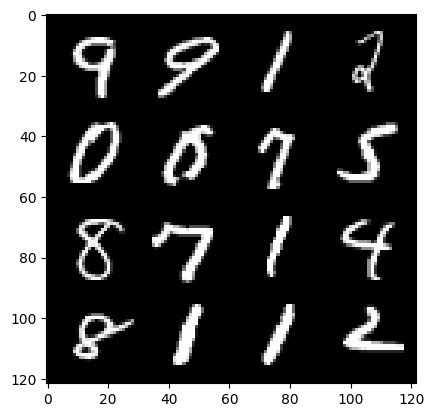

  5%|████████▍                                                                                                                                                            | 24/469 [00:00<00:17, 26.17it/s]

307: step 144000 / Gen Loss: 0.47968591365218155 / Disc Loss: 0.47968591365218155


 16%|██████████████████████████▋                                                                                                                                          | 76/469 [00:01<00:10, 38.64it/s]

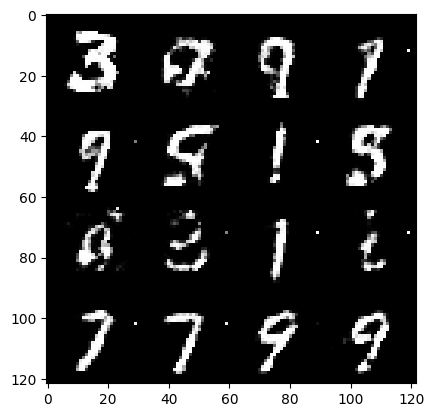

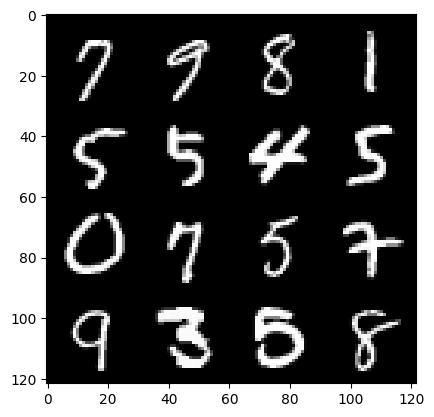

 18%|█████████████████████████████▌                                                                                                                                       | 84/469 [00:02<00:11, 34.08it/s]

309: step 145000 / Gen Loss: 0.5454270499944688 / Disc Loss: 0.5454270499944688


 30%|████████████████████████████████████████████████▉                                                                                                                   | 140/469 [00:03<00:08, 38.56it/s]

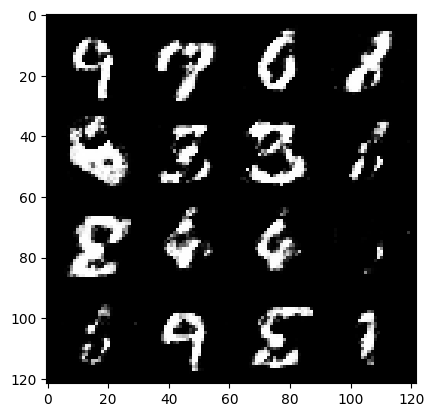

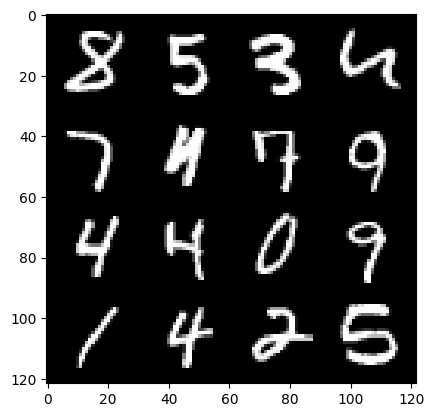

 32%|███████████████████████████████████████████████████▊                                                                                                                | 148/469 [00:04<00:08, 35.82it/s]

311: step 146000 / Gen Loss: 0.6706808058023451 / Disc Loss: 0.6706808058023451


 43%|█████████████████████████████████████████████████████████████████████▉                                                                                              | 200/469 [00:05<00:06, 38.48it/s]

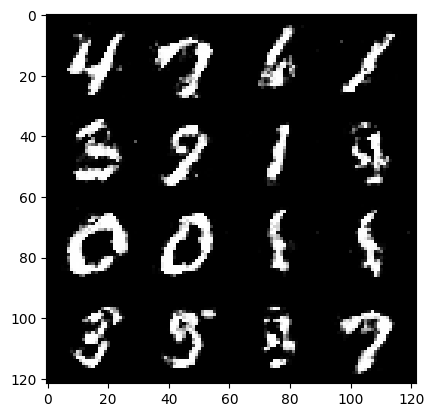

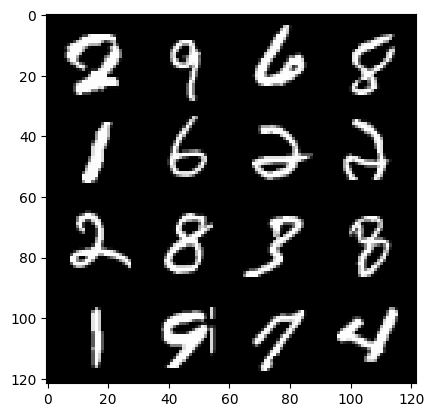

 44%|████████████████████████████████████████████████████████████████████████▋                                                                                           | 208/469 [00:05<00:07, 36.46it/s]

313: step 147000 / Gen Loss: 0.5779443269371987 / Disc Loss: 0.5779443269371987


 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 264/469 [00:06<00:05, 38.69it/s]

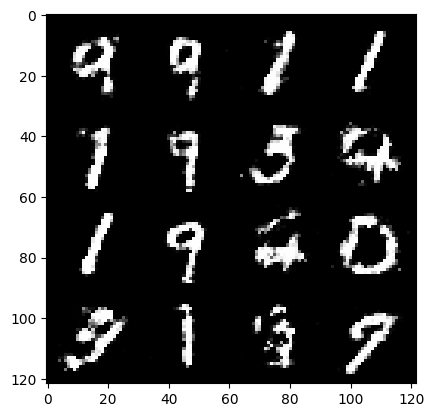

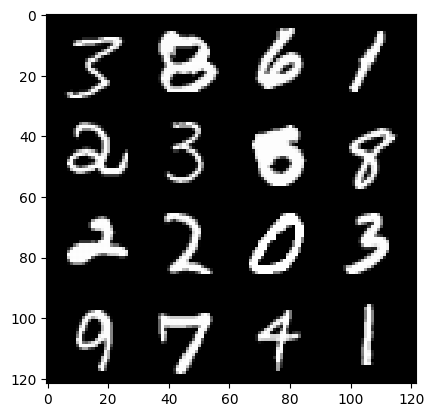

 58%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 272/469 [00:07<00:05, 37.10it/s]

315: step 148000 / Gen Loss: 0.5502018818855285 / Disc Loss: 0.5502018818855285


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 324/469 [00:08<00:03, 38.53it/s]

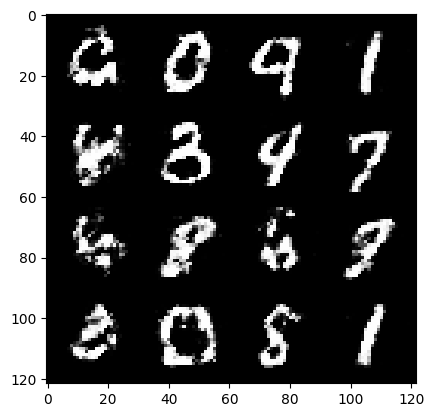

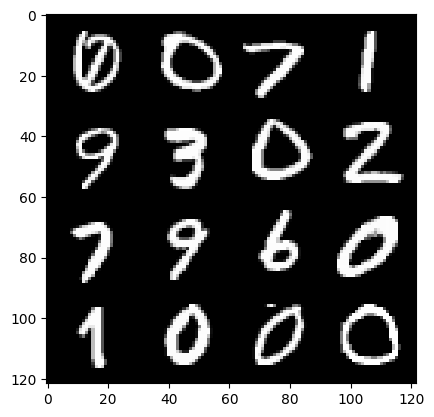

 71%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                | 332/469 [00:08<00:03, 37.25it/s]

317: step 149000 / Gen Loss: 0.5196806405484673 / Disc Loss: 0.5196806405484673


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 388/469 [00:10<00:02, 38.67it/s]

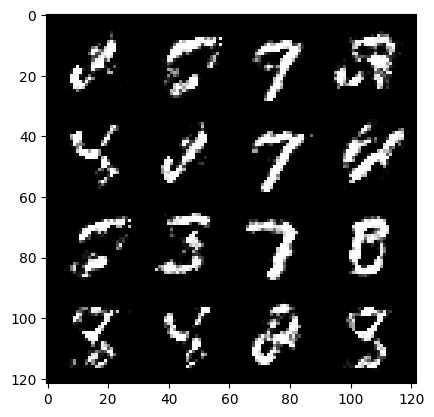

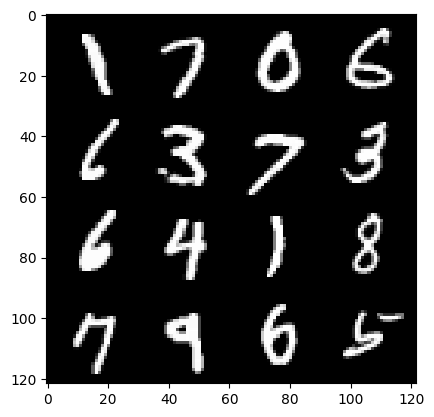

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 396/469 [00:10<00:01, 37.57it/s]

319: step 150000 / Gen Loss: 0.49516227769851634 / Disc Loss: 0.49516227769851634


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 448/469 [00:11<00:00, 38.69it/s]

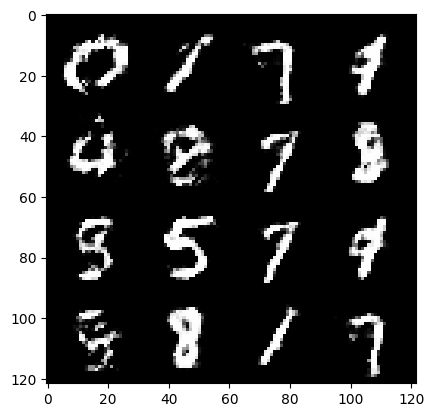

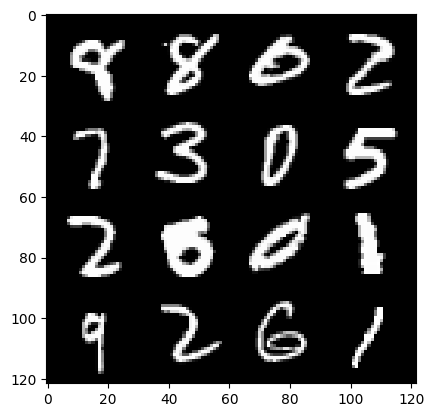

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 456/469 [00:12<00:00, 37.74it/s]

321: step 151000 / Gen Loss: 0.49136343693733275 / Disc Loss: 0.49136343693733275


  9%|███████████████▍                                                                                                                                                     | 44/469 [00:01<00:10, 38.83it/s]

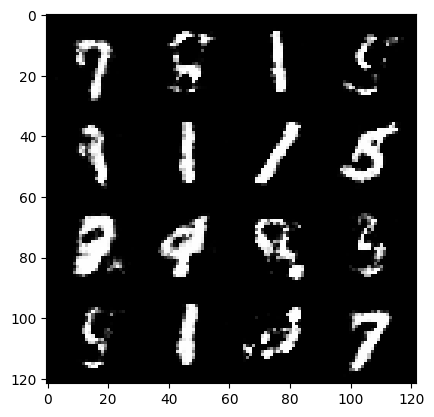

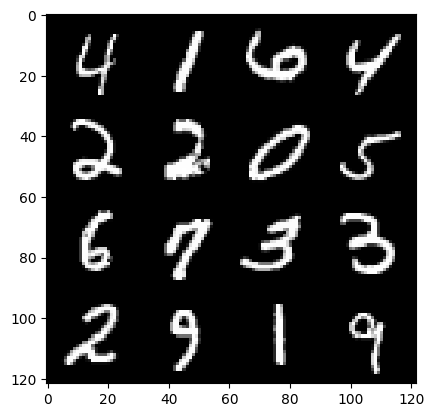

 11%|██████████████████▎                                                                                                                                                  | 52/469 [00:01<00:13, 31.55it/s]

324: step 152000 / Gen Loss: 0.48256769791245435 / Disc Loss: 0.48256769791245435


 22%|████████████████████████████████████▎                                                                                                                               | 104/469 [00:02<00:09, 38.72it/s]

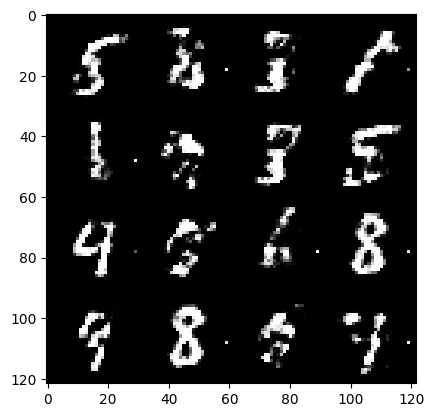

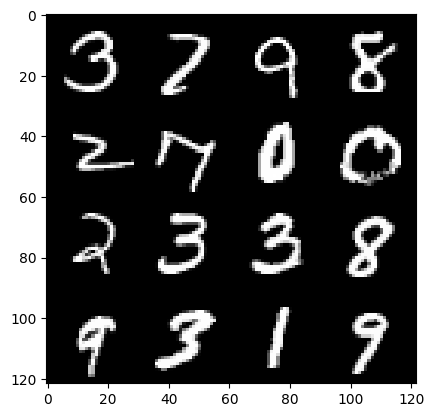

 24%|███████████████████████████████████████▏                                                                                                                            | 112/469 [00:03<00:10, 35.10it/s]

326: step 153000 / Gen Loss: 0.552607778072357 / Disc Loss: 0.552607778072357


 36%|██████████████████████████████████████████████████████████▋                                                                                                         | 168/469 [00:04<00:07, 38.57it/s]

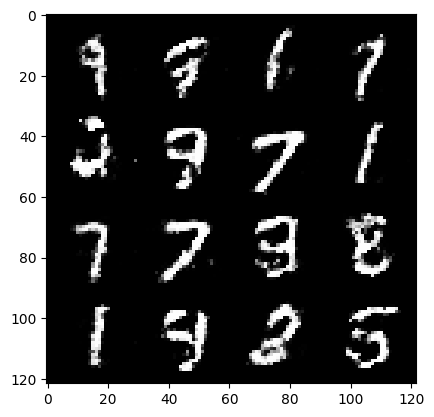

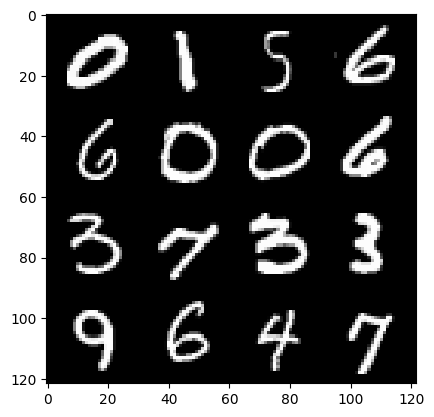

 38%|█████████████████████████████████████████████████████████████▌                                                                                                      | 176/469 [00:04<00:08, 36.19it/s]

328: step 154000 / Gen Loss: 0.493057022809982 / Disc Loss: 0.493057022809982


 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                    | 228/469 [00:05<00:06, 38.60it/s]

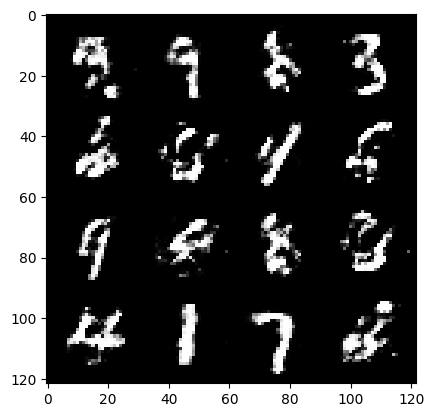

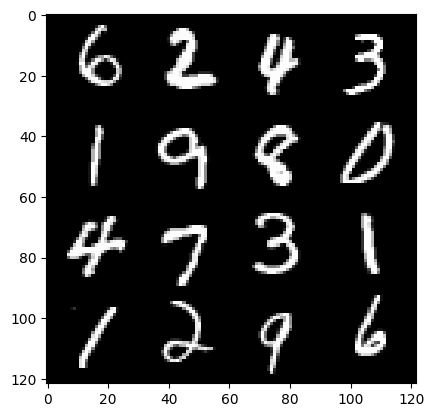

 50%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 236/469 [00:06<00:06, 36.80it/s]

330: step 155000 / Gen Loss: 0.5071856388151644 / Disc Loss: 0.5071856388151644


 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 292/469 [00:07<00:04, 38.75it/s]

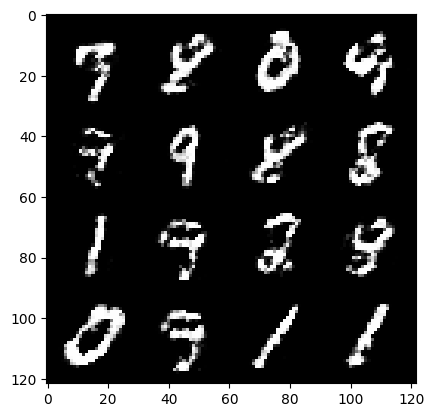

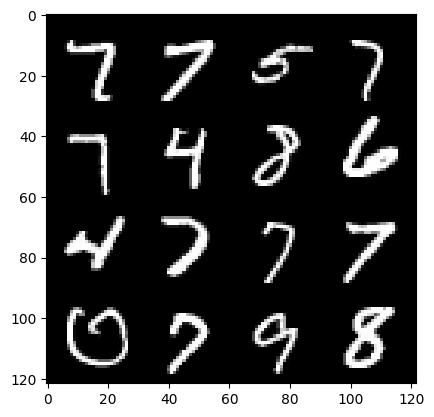

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 300/469 [00:08<00:04, 37.30it/s]

332: step 156000 / Gen Loss: 0.48498512092232715 / Disc Loss: 0.48498512092232715


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 352/469 [00:09<00:03, 38.66it/s]

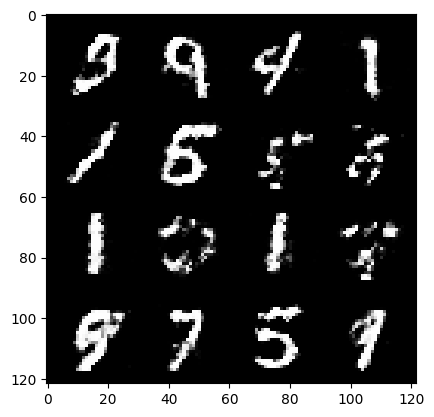

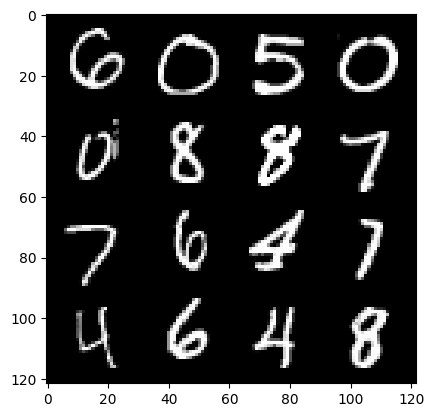

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 360/469 [00:09<00:02, 37.45it/s]

334: step 157000 / Gen Loss: 0.47652743512392004 / Disc Loss: 0.47652743512392004


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 416/469 [00:10<00:01, 38.53it/s]

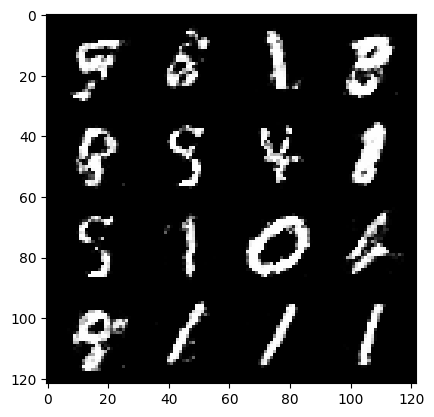

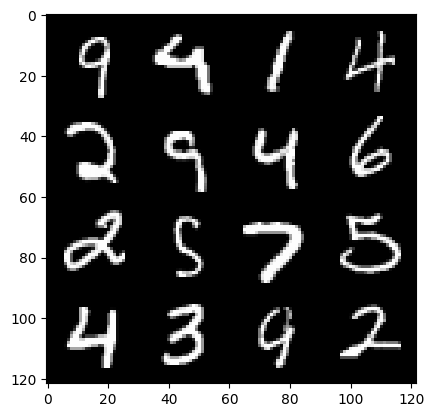

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 420/469 [00:11<00:01, 37.04it/s]

336: step 158000 / Gen Loss: 0.48727899172902084 / Disc Loss: 0.48727899172902084


  2%|██▊                                                                                                                                                                   | 8/469 [00:00<00:11, 38.83it/s]

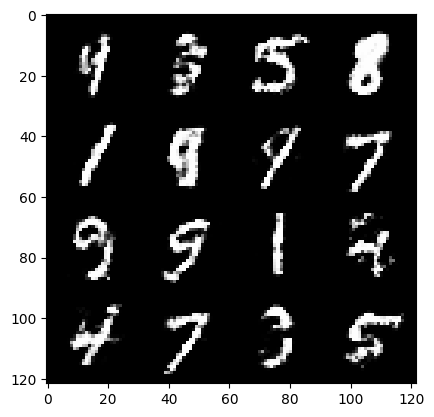

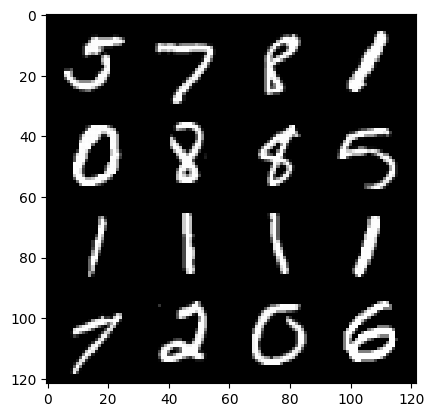

  3%|█████▋                                                                                                                                                               | 16/469 [00:00<00:20, 22.57it/s]

339: step 159000 / Gen Loss: 0.5037380292117594 / Disc Loss: 0.5037380292117594


 14%|███████████████████████▉                                                                                                                                             | 68/469 [00:01<00:10, 38.55it/s]

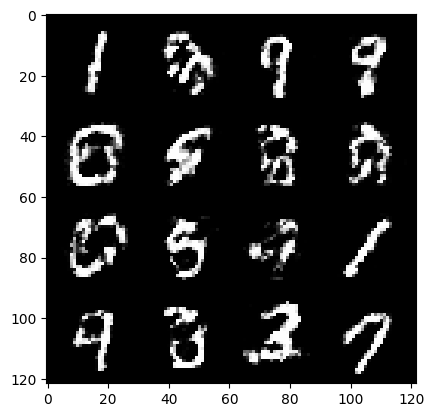

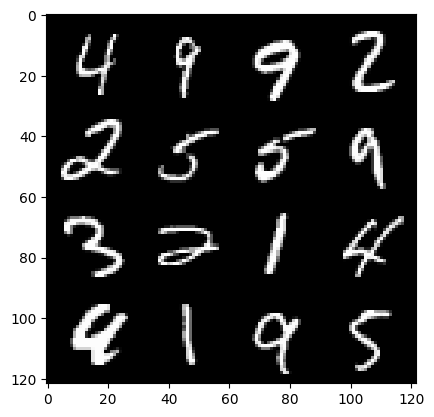

 16%|██████████████████████████▋                                                                                                                                          | 76/469 [00:02<00:11, 33.44it/s]

341: step 160000 / Gen Loss: 0.4989140515327456 / Disc Loss: 0.4989140515327456


 28%|██████████████████████████████████████████████▏                                                                                                                     | 132/469 [00:03<00:08, 38.55it/s]

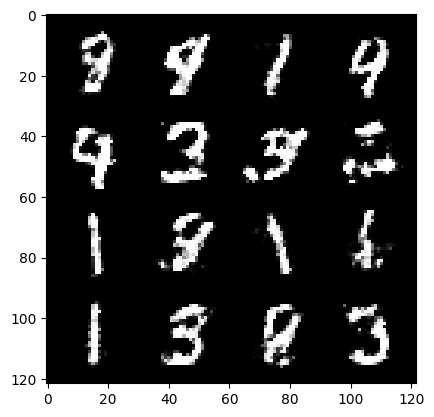

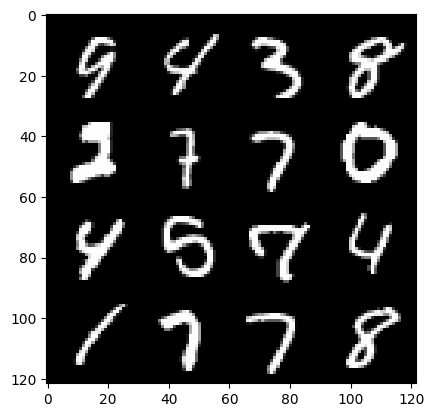

 30%|████████████████████████████████████████████████▉                                                                                                                   | 140/469 [00:03<00:09, 35.63it/s]

343: step 161000 / Gen Loss: 0.49349881762266157 / Disc Loss: 0.49349881762266157


 41%|███████████████████████████████████████████████████████████████████▏                                                                                                | 192/469 [00:04<00:07, 38.55it/s]

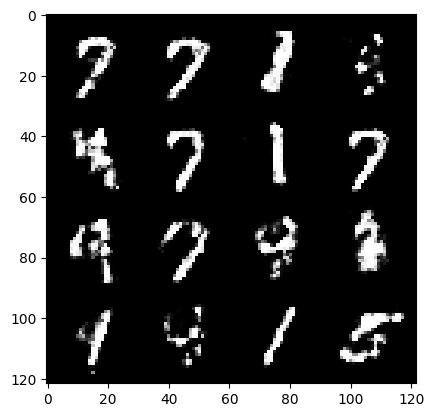

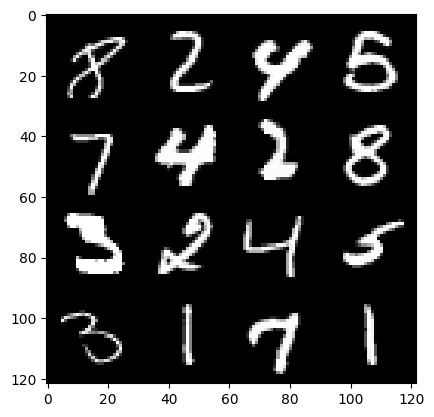

 43%|█████████████████████████████████████████████████████████████████████▉                                                                                              | 200/469 [00:05<00:07, 36.44it/s]

345: step 162000 / Gen Loss: 0.487323665589094 / Disc Loss: 0.487323665589094


 55%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 256/469 [00:06<00:05, 37.53it/s]

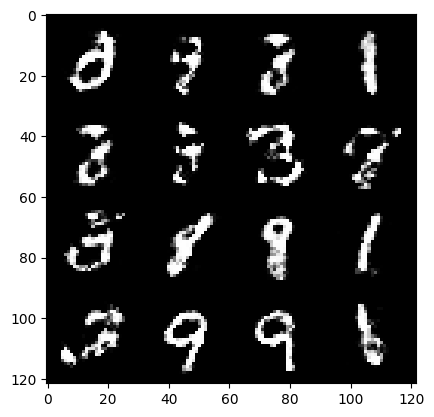

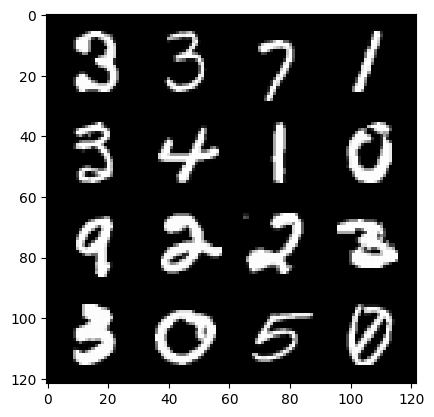

 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 264/469 [00:07<00:05, 36.03it/s]

347: step 163000 / Gen Loss: 0.4899090429544447 / Disc Loss: 0.4899090429544447


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 316/469 [00:08<00:03, 38.65it/s]

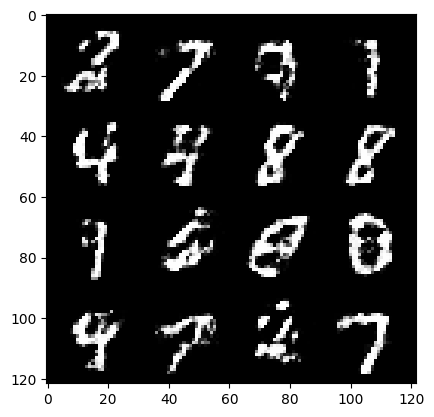

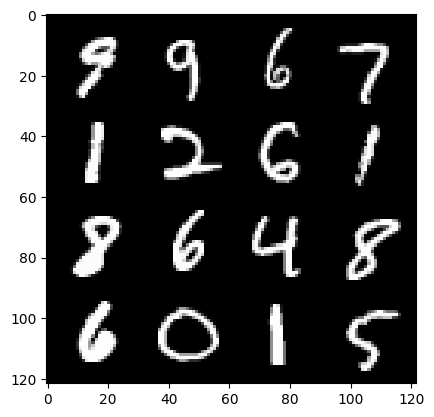

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 324/469 [00:08<00:03, 37.30it/s]

349: step 164000 / Gen Loss: 0.4676419033110144 / Disc Loss: 0.4676419033110144


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 380/469 [00:09<00:02, 38.73it/s]

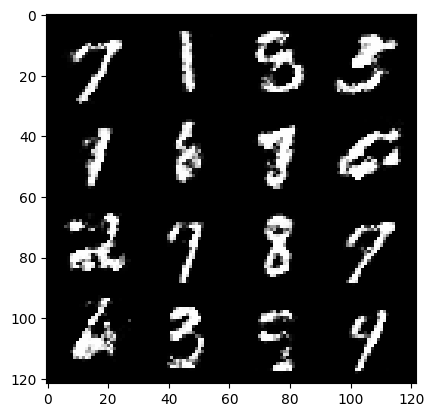

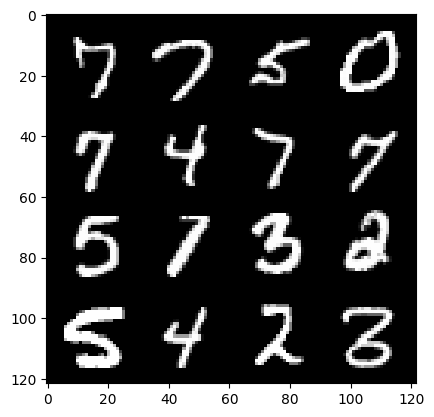

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 388/469 [00:10<00:02, 37.62it/s]

351: step 165000 / Gen Loss: 0.4856143736839286 / Disc Loss: 0.4856143736839286


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 440/469 [00:11<00:00, 38.78it/s]

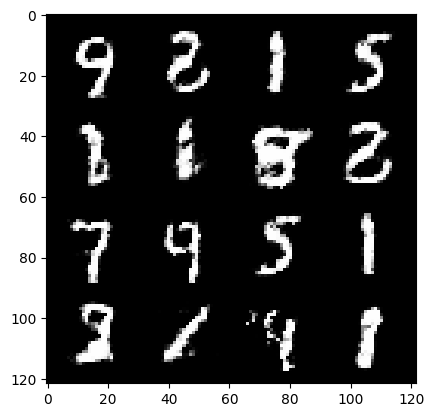

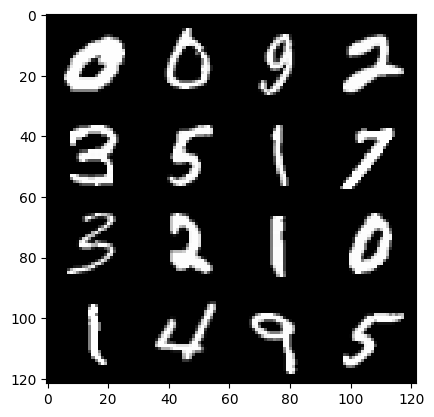

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 452/469 [00:11<00:00, 37.77it/s]

353: step 166000 / Gen Loss: 0.4838243316411973 / Disc Loss: 0.4838243316411973


  8%|████████████▋                                                                                                                                                        | 36/469 [00:00<00:11, 39.04it/s]

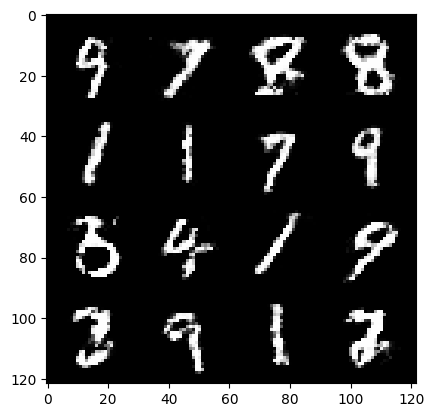

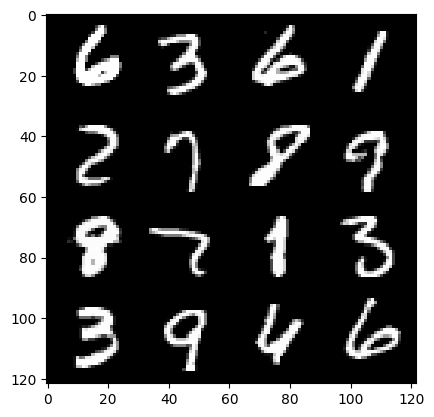

  9%|███████████████▍                                                                                                                                                     | 44/469 [00:01<00:13, 30.79it/s]

356: step 167000 / Gen Loss: 0.46829222983121876 / Disc Loss: 0.46829222983121876


 20%|█████████████████████████████████▊                                                                                                                                   | 96/469 [00:02<00:09, 38.16it/s]

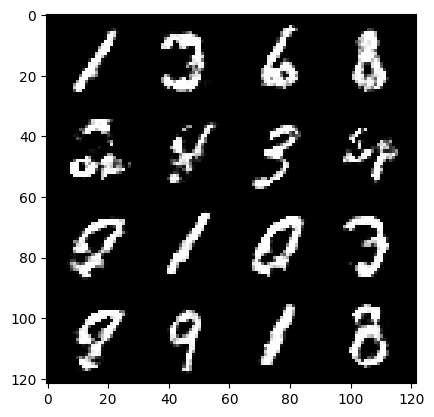

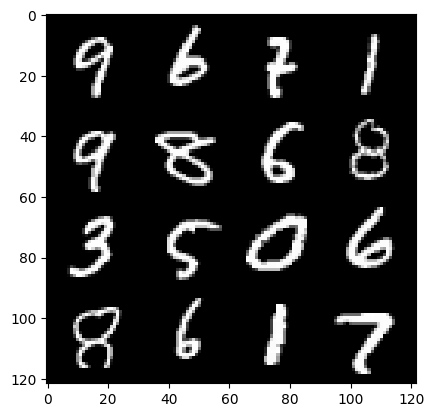

 22%|████████████████████████████████████▎                                                                                                                               | 104/469 [00:03<00:10, 34.33it/s]

358: step 168000 / Gen Loss: 0.49464014601707473 / Disc Loss: 0.49464014601707473


 34%|███████████████████████████████████████████████████████▉                                                                                                            | 160/469 [00:04<00:07, 38.78it/s]

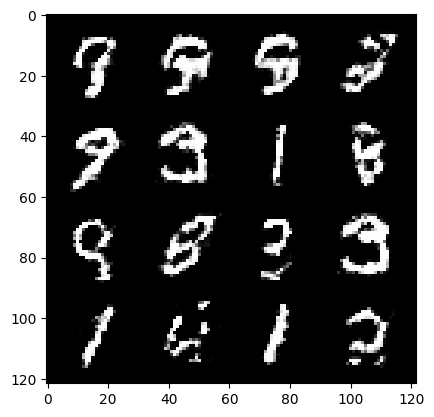

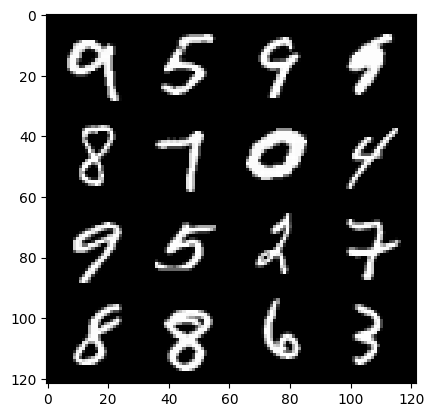

 36%|██████████████████████████████████████████████████████████▋                                                                                                         | 168/469 [00:04<00:08, 36.26it/s]

360: step 169000 / Gen Loss: 0.48165339201688795 / Disc Loss: 0.48165339201688795


 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                       | 220/469 [00:05<00:06, 38.56it/s]

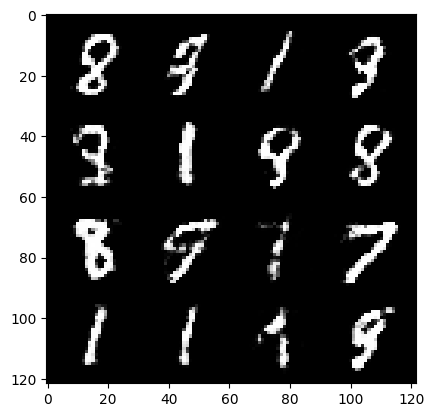

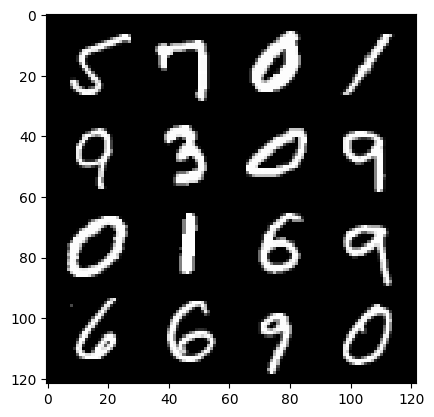

 49%|███████████████████████████████████████████████████████████████████████████████▋                                                                                    | 228/469 [00:06<00:06, 36.72it/s]

362: step 170000 / Gen Loss: 0.47318745797872525 / Disc Loss: 0.47318745797872525


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 284/469 [00:07<00:04, 38.65it/s]

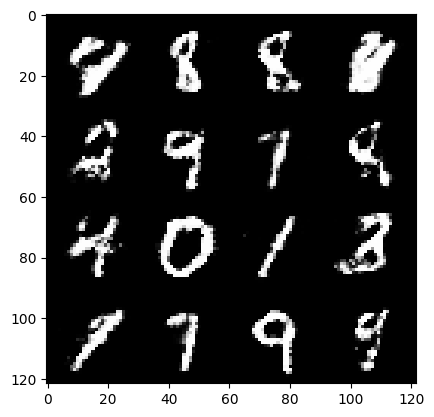

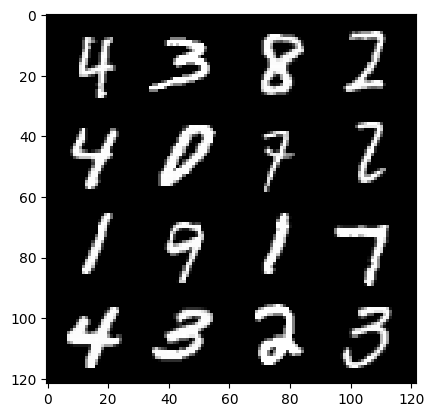

 61%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 288/469 [00:07<00:04, 37.17it/s]

364: step 171000 / Gen Loss: 0.4830003482401372 / Disc Loss: 0.4830003482401372


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 344/469 [00:08<00:03, 38.60it/s]

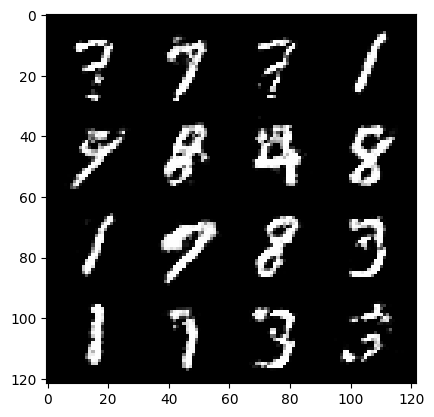

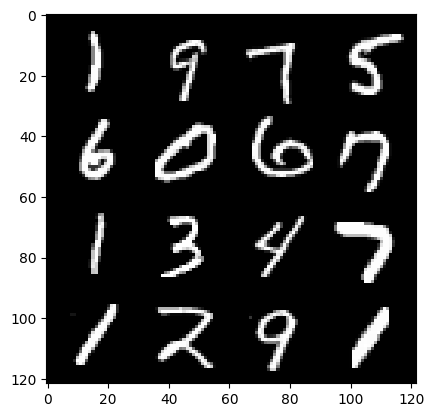

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 352/469 [00:09<00:03, 37.38it/s]

366: step 172000 / Gen Loss: 0.4739176748991013 / Disc Loss: 0.4739176748991013


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 408/469 [00:10<00:01, 38.72it/s]

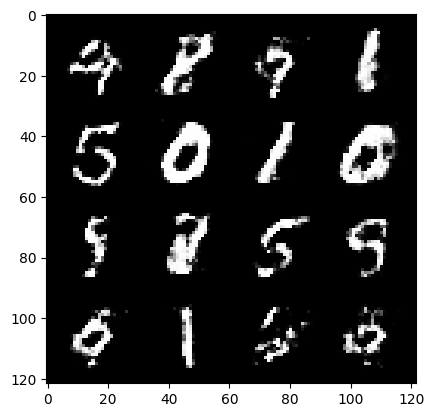

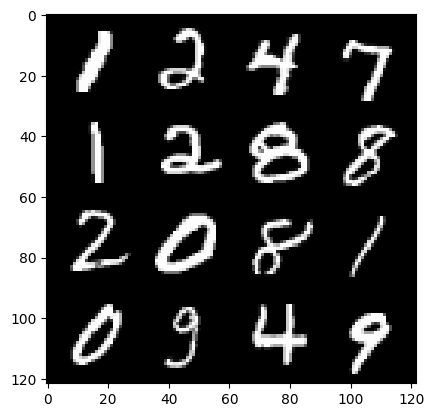

 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 416/469 [00:11<00:01, 37.67it/s]

368: step 173000 / Gen Loss: 0.4688426284193995 / Disc Loss: 0.4688426284193995


  0%|                                                                                                                                                                              | 0/469 [00:00<?, ?it/s]

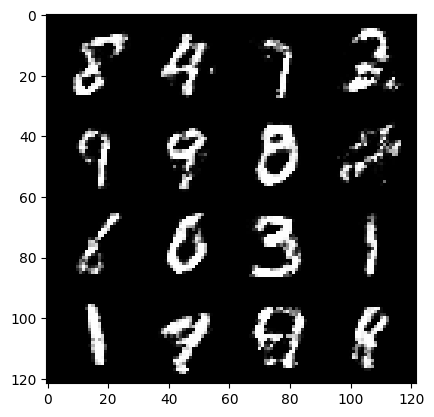

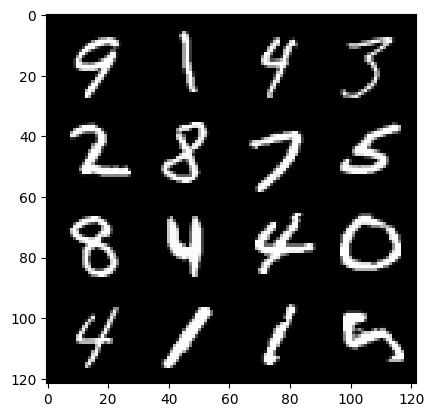

  1%|██                                                                                                                                                                    | 6/469 [00:00<00:34, 13.25it/s]

371: step 174000 / Gen Loss: 0.4813435207009309 / Disc Loss: 0.4813435207009309


 13%|█████████████████████                                                                                                                                                | 60/469 [00:01<00:10, 38.83it/s]

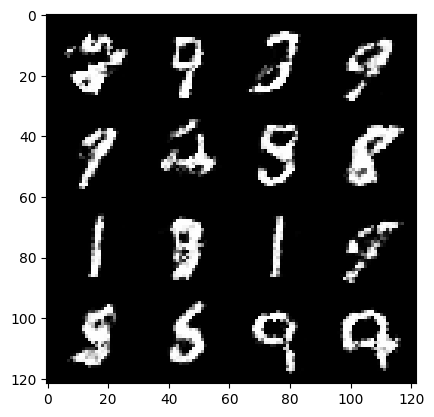

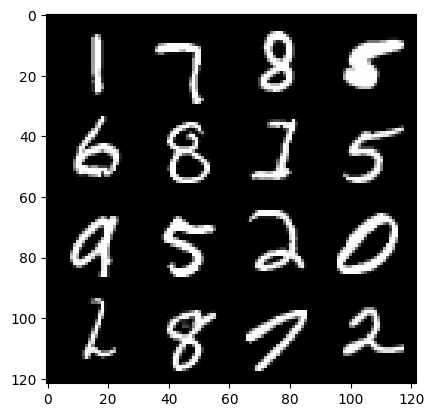

 14%|███████████████████████▉                                                                                                                                             | 68/469 [00:02<00:12, 33.17it/s]

373: step 175000 / Gen Loss: 0.48127513784170156 / Disc Loss: 0.48127513784170156


 26%|███████████████████████████████████████████▎                                                                                                                        | 124/469 [00:03<00:08, 38.64it/s]

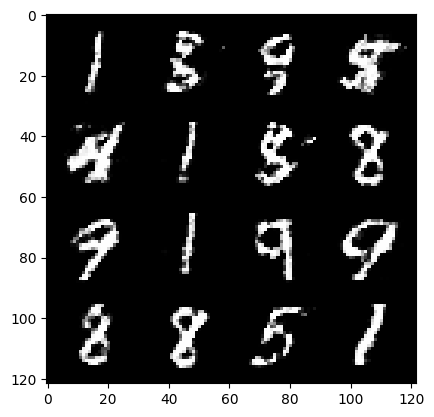

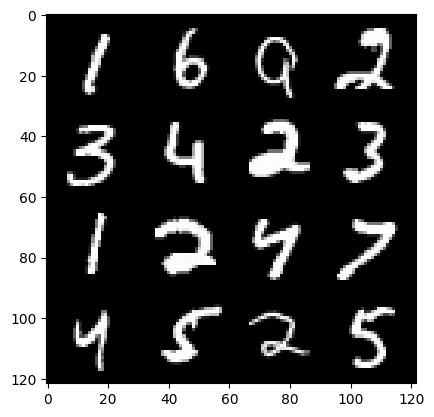

 28%|██████████████████████████████████████████████▏                                                                                                                     | 132/469 [00:03<00:09, 35.56it/s]

375: step 176000 / Gen Loss: 0.4810196963846683 / Disc Loss: 0.4810196963846683


 39%|████████████████████████████████████████████████████████████████▎                                                                                                   | 184/469 [00:04<00:07, 38.74it/s]

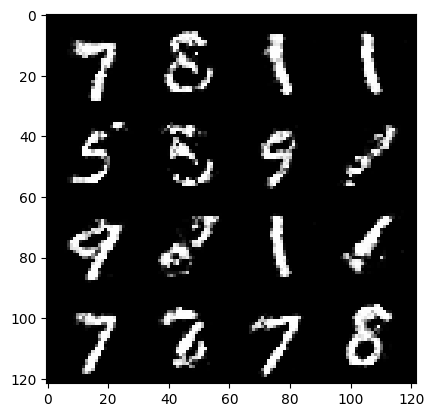

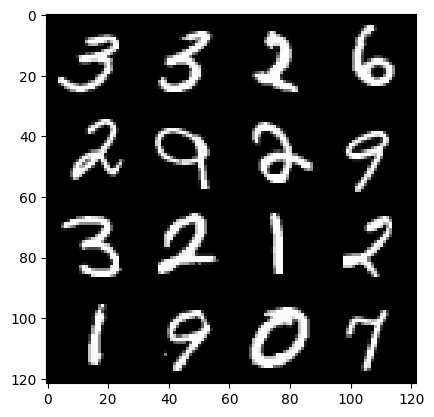

 42%|████████████████████████████████████████████████████████████████████▌                                                                                               | 196/469 [00:05<00:07, 36.51it/s]

377: step 177000 / Gen Loss: 0.4742589908540243 / Disc Loss: 0.4742589908540243


 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 248/469 [00:06<00:05, 38.64it/s]

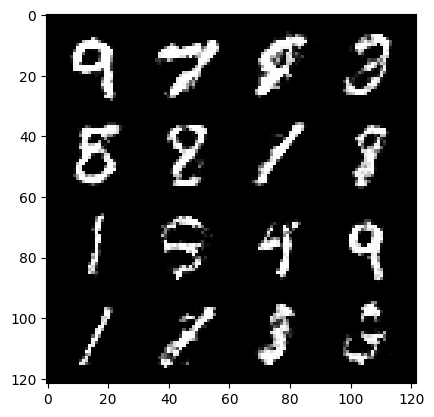

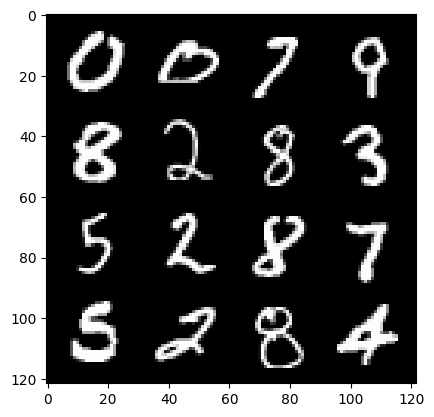

 55%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 256/469 [00:06<00:05, 36.97it/s]

379: step 178000 / Gen Loss: 0.485838311165571 / Disc Loss: 0.485838311165571


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 308/469 [00:08<00:04, 38.49it/s]

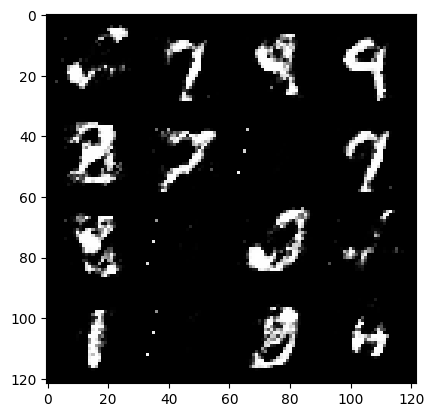

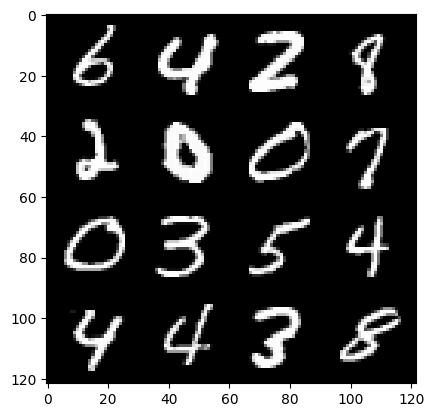

 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                     | 316/469 [00:08<00:04, 37.16it/s]

381: step 179000 / Gen Loss: 0.6535611132085317 / Disc Loss: 0.6535611132085317


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 372/469 [00:09<00:02, 38.69it/s]

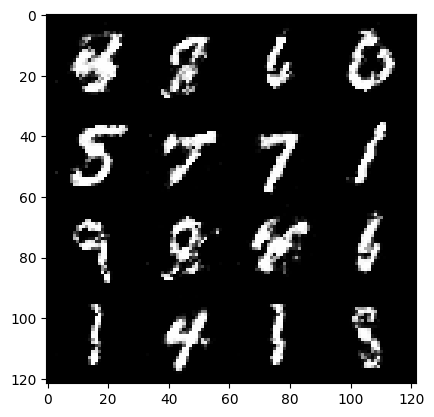

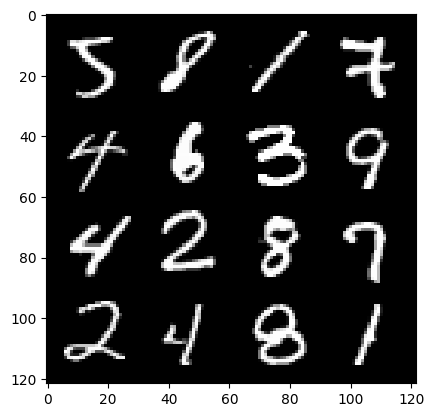

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 380/469 [00:10<00:02, 37.55it/s]

383: step 180000 / Gen Loss: 0.4773936743140218 / Disc Loss: 0.4773936743140218


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 432/469 [00:11<00:00, 38.69it/s]

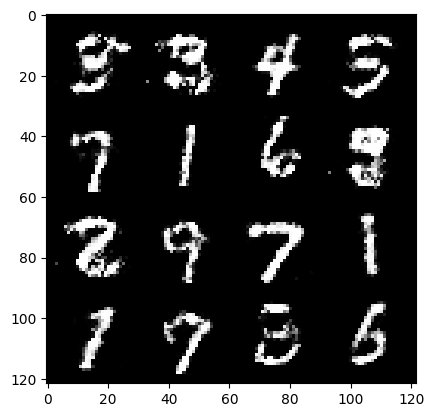

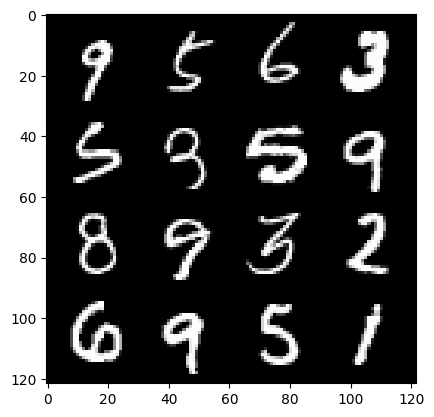

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 440/469 [00:11<00:00, 37.68it/s]

385: step 181000 / Gen Loss: 0.5111137511730199 / Disc Loss: 0.5111137511730199


  6%|█████████▊                                                                                                                                                           | 28/469 [00:00<00:11, 38.57it/s]

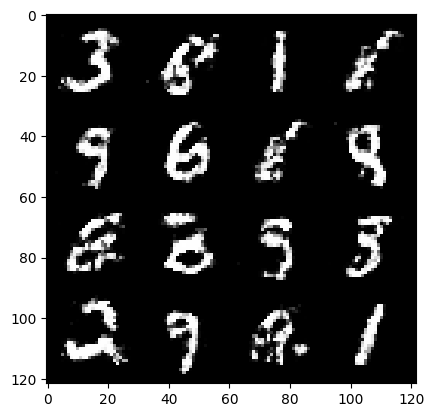

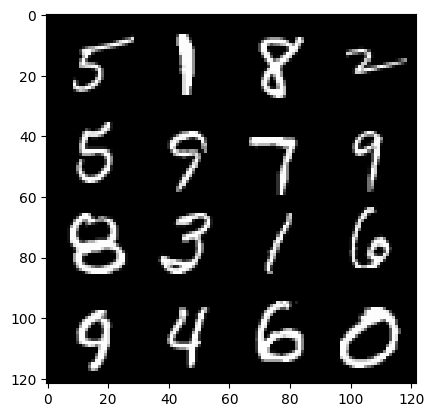

  8%|████████████▋                                                                                                                                                        | 36/469 [00:01<00:14, 29.22it/s]

388: step 182000 / Gen Loss: 0.47823129811882936 / Disc Loss: 0.47823129811882936


 19%|██████████████████████████████▉                                                                                                                                      | 88/469 [00:02<00:09, 38.78it/s]

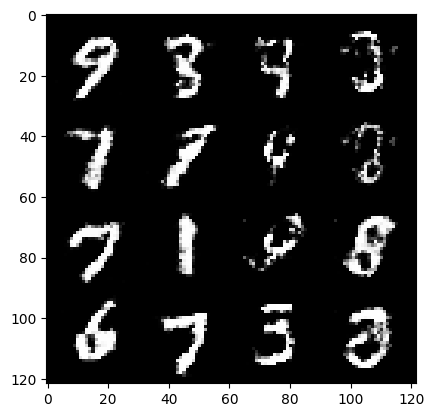

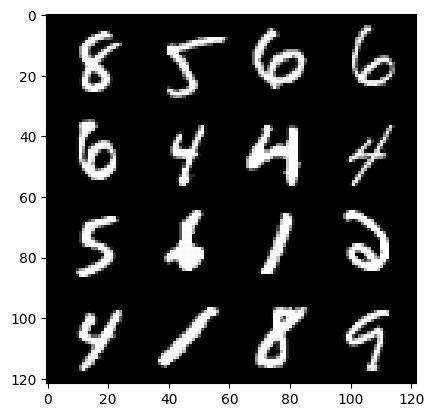

 20%|█████████████████████████████████▊                                                                                                                                   | 96/469 [00:02<00:10, 34.63it/s]

390: step 183000 / Gen Loss: 0.4949297675192361 / Disc Loss: 0.4949297675192361


 32%|█████████████████████████████████████████████████████▏                                                                                                              | 152/469 [00:03<00:08, 38.69it/s]

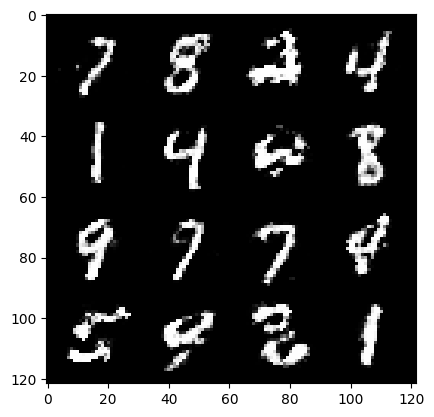

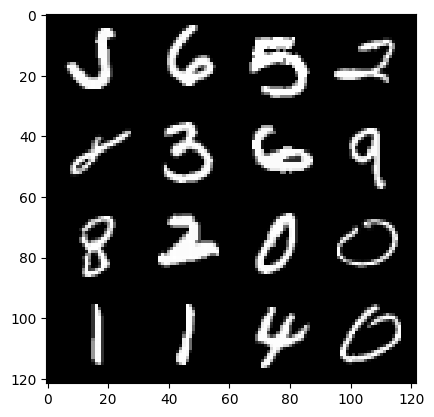

 34%|███████████████████████████████████████████████████████▉                                                                                                            | 160/469 [00:04<00:08, 36.08it/s]

392: step 184000 / Gen Loss: 0.4825949781835079 / Disc Loss: 0.4825949781835079


 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                         | 212/469 [00:05<00:06, 38.53it/s]

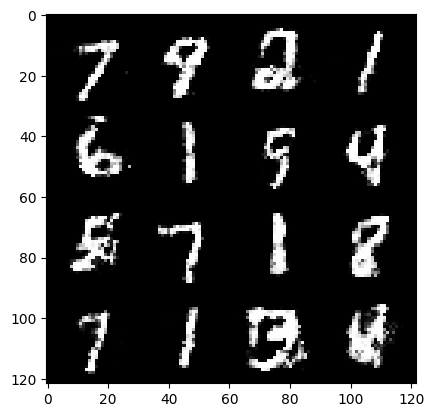

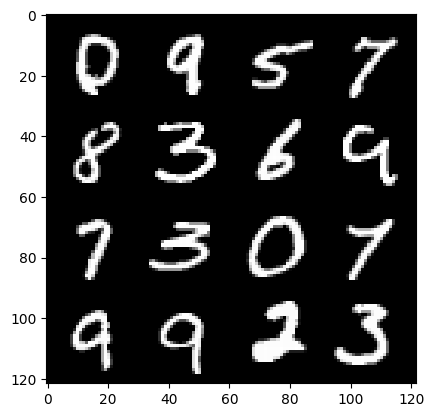

 47%|████████████████████████████████████████████████████████████████████████████▉                                                                                       | 220/469 [00:06<00:06, 36.61it/s]

394: step 185000 / Gen Loss: 0.47950745952129387 / Disc Loss: 0.47950745952129387


 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 276/469 [00:07<00:05, 38.16it/s]

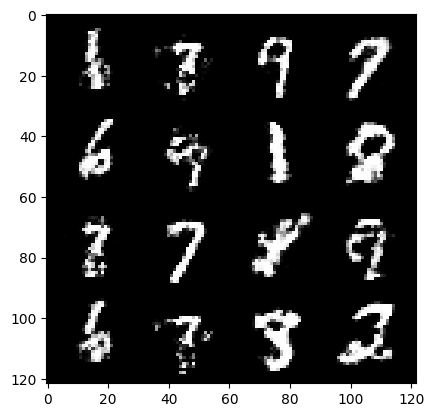

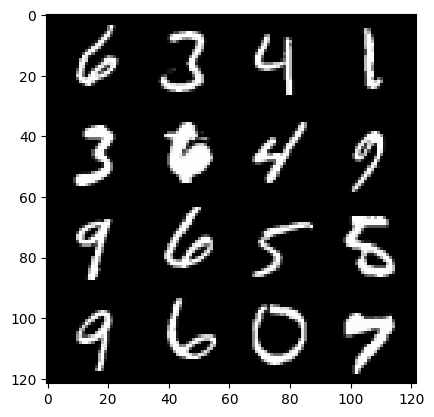

 61%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                | 284/469 [00:07<00:05, 36.66it/s]

396: step 186000 / Gen Loss: 0.47495982083678295 / Disc Loss: 0.47495982083678295


 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 336/469 [00:08<00:03, 38.59it/s]

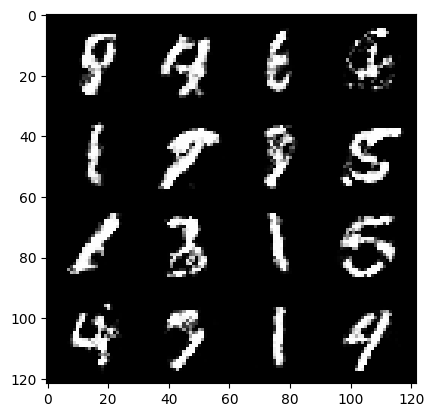

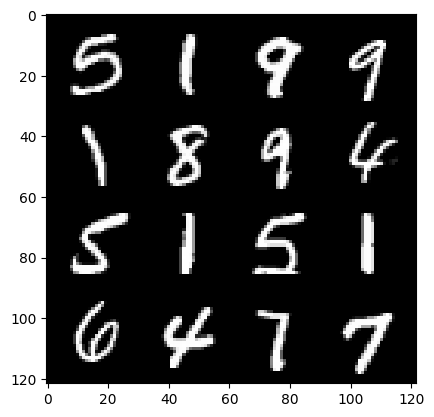

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                           | 344/469 [00:09<00:03, 37.35it/s]

398: step 187000 / Gen Loss: 0.46857046452164625 / Disc Loss: 0.46857046452164625


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 400/469 [00:10<00:01, 38.55it/s]

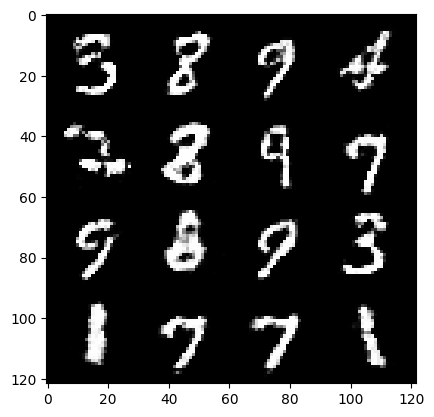

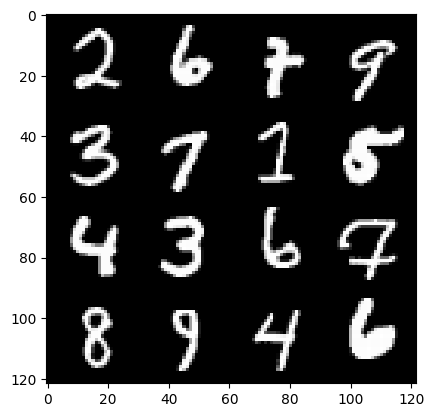

 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 408/469 [00:10<00:01, 37.49it/s]

400: step 188000 / Gen Loss: 0.478483302295208 / Disc Loss: 0.478483302295208


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 460/469 [00:11<00:00, 38.51it/s]

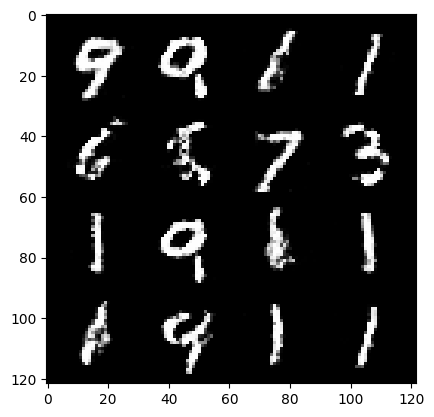

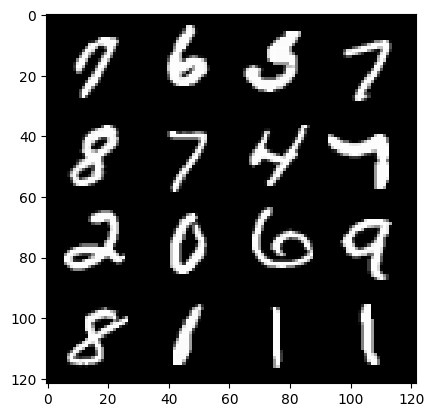

  0%|                                                                                                                                                                              | 0/469 [00:00<?, ?it/s]

402: step 189000 / Gen Loss: 0.47400104063749315 / Disc Loss: 0.47400104063749315


 11%|██████████████████▎                                                                                                                                                  | 52/469 [00:01<00:10, 38.63it/s]

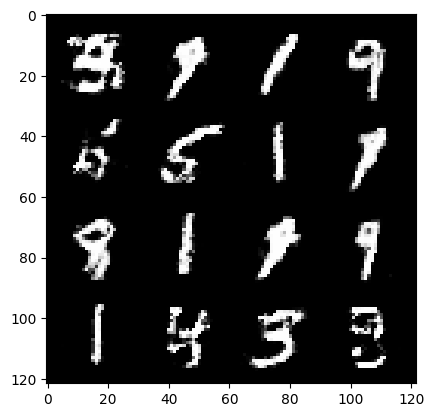

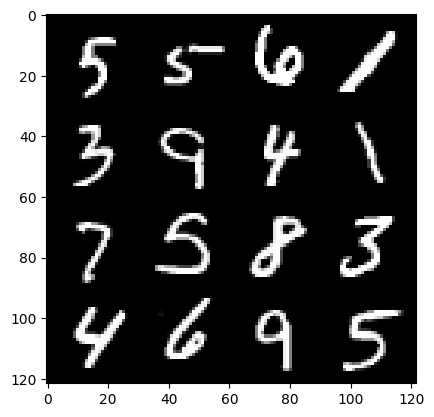

 13%|█████████████████████                                                                                                                                                | 60/469 [00:01<00:12, 32.36it/s]

405: step 190000 / Gen Loss: 0.4745563611090188 / Disc Loss: 0.4745563611090188


 25%|████████████████████████████████████████▌                                                                                                                           | 116/469 [00:02<00:09, 38.77it/s]

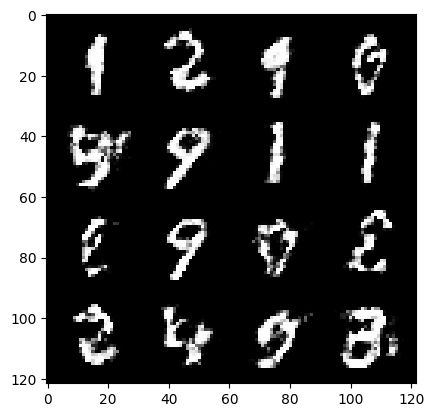

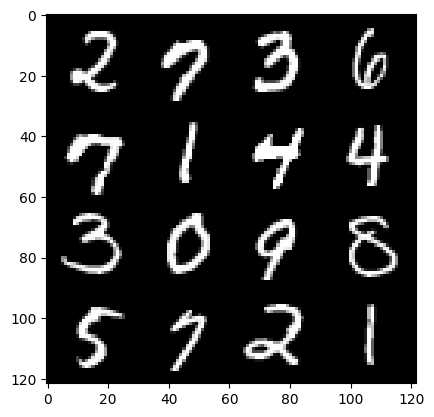

 26%|███████████████████████████████████████████▎                                                                                                                        | 124/469 [00:03<00:09, 35.50it/s]

407: step 191000 / Gen Loss: 0.4705623025000088 / Disc Loss: 0.4705623025000088


 38%|█████████████████████████████████████████████████████████████▌                                                                                                      | 176/469 [00:04<00:07, 38.72it/s]

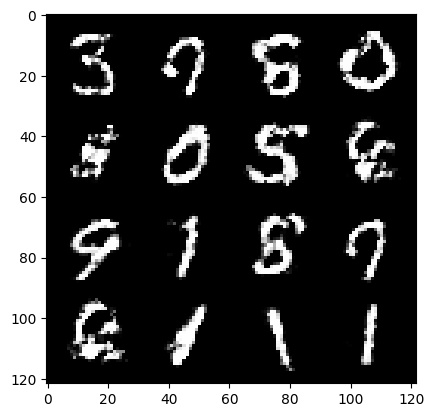

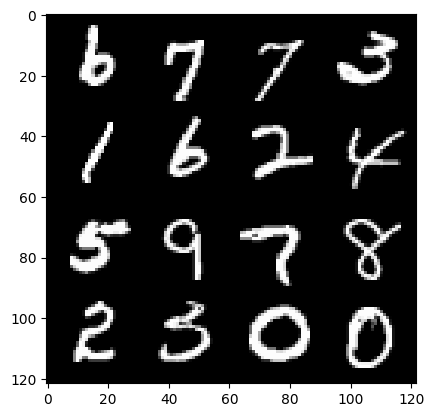

 40%|█████████████████████████████████████████████████████████████████▋                                                                                                  | 188/469 [00:05<00:07, 36.48it/s]

409: step 192000 / Gen Loss: 0.46608765995502477 / Disc Loss: 0.46608765995502477


 51%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                | 240/469 [00:06<00:05, 38.60it/s]

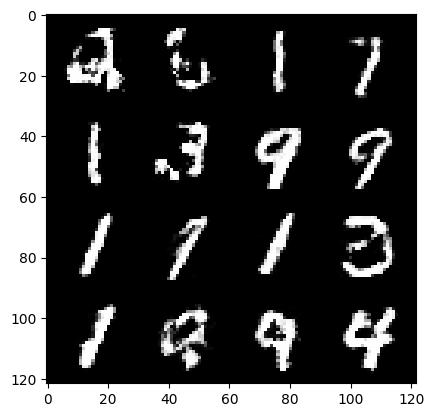

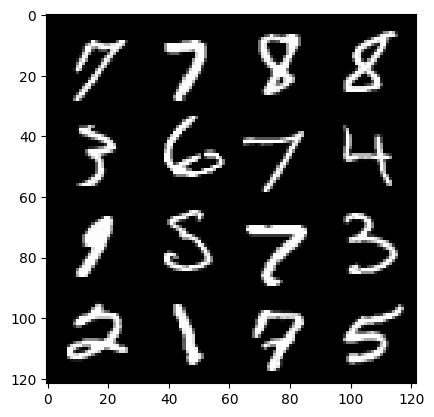

 53%|██████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 248/469 [00:06<00:05, 36.89it/s]

411: step 193000 / Gen Loss: 0.48415261548757565 / Disc Loss: 0.48415261548757565


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 300/469 [00:07<00:04, 38.75it/s]

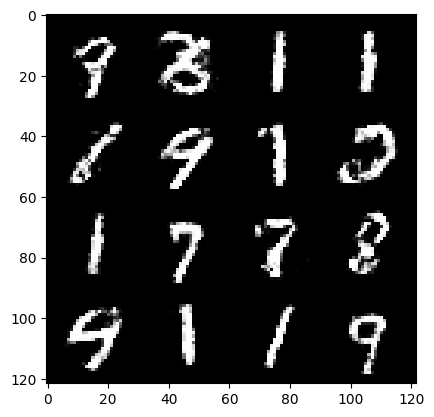

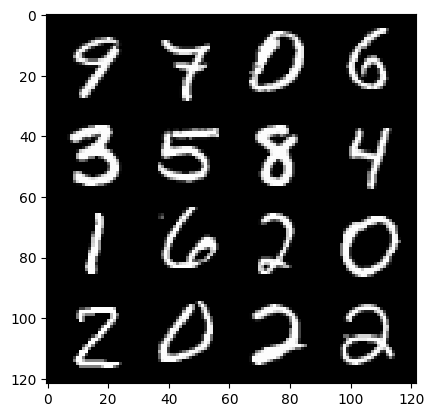

 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                        | 308/469 [00:08<00:04, 37.30it/s]

413: step 194000 / Gen Loss: 0.5015628031790258 / Disc Loss: 0.5015628031790258


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 364/469 [00:09<00:02, 38.42it/s]

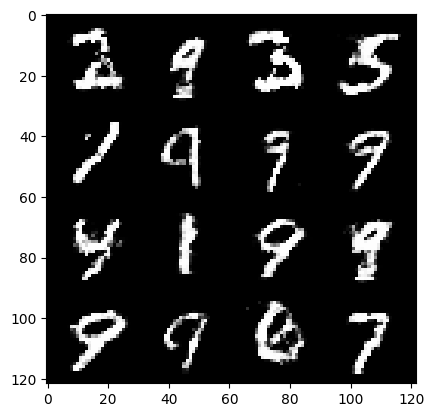

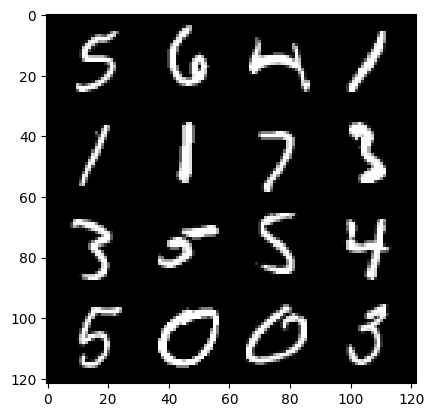

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                  | 372/469 [00:09<00:02, 37.28it/s]

415: step 195000 / Gen Loss: 0.48111186945438406 / Disc Loss: 0.48111186945438406


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 424/469 [00:10<00:01, 38.78it/s]

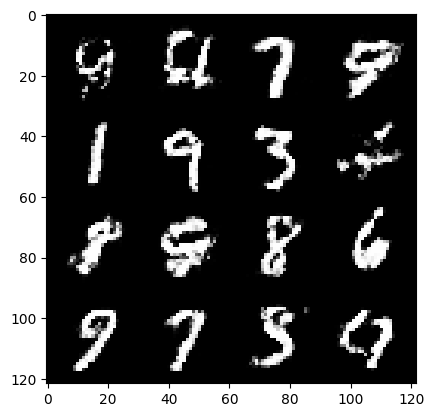

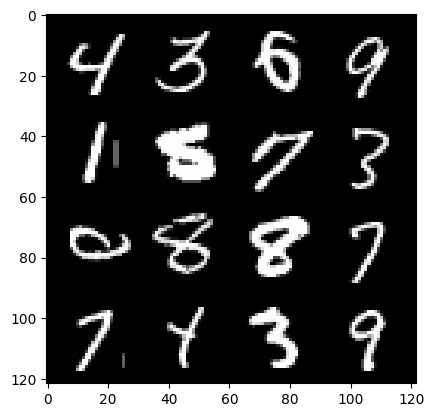

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 436/469 [00:11<00:00, 37.78it/s]

417: step 196000 / Gen Loss: 0.4848065732717514 / Disc Loss: 0.4848065732717514


  4%|███████                                                                                                                                                              | 20/469 [00:00<00:11, 38.91it/s]

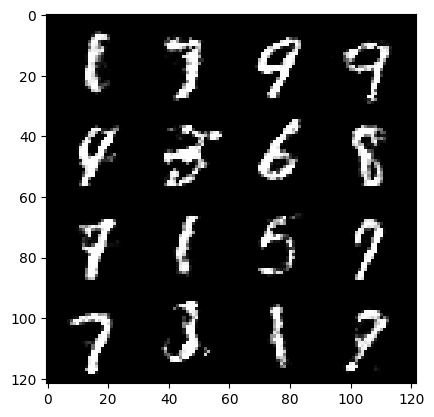

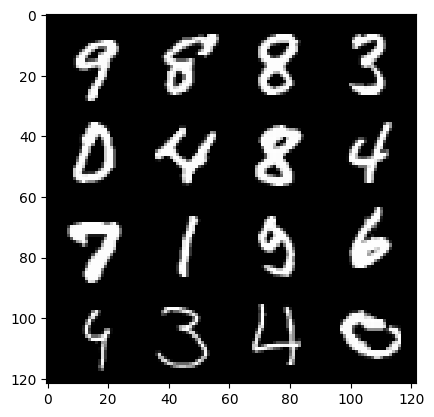

  6%|█████████▊                                                                                                                                                           | 28/469 [00:01<00:16, 27.42it/s]

420: step 197000 / Gen Loss: 0.48129639318585365 / Disc Loss: 0.48129639318585365


 17%|████████████████████████████▏                                                                                                                                        | 80/469 [00:02<00:10, 38.61it/s]

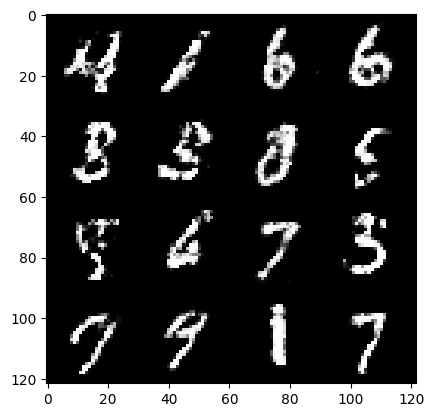

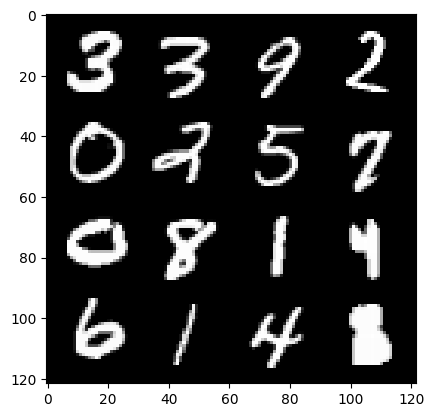

 19%|██████████████████████████████▉                                                                                                                                      | 88/469 [00:02<00:11, 34.15it/s]

422: step 198000 / Gen Loss: 0.4799987379014491 / Disc Loss: 0.4799987379014491


 31%|██████████████████████████████████████████████████▎                                                                                                                 | 144/469 [00:03<00:08, 38.77it/s]

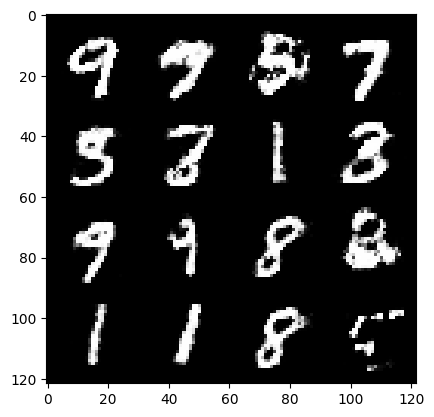

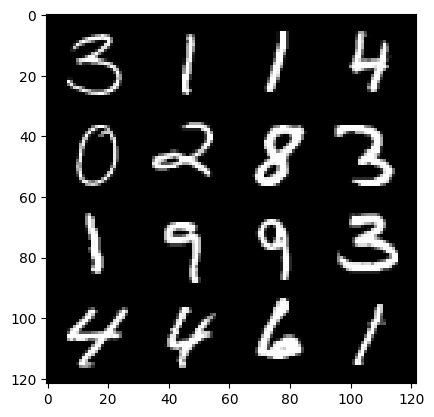

 32%|█████████████████████████████████████████████████████▏                                                                                                              | 152/469 [00:04<00:08, 35.75it/s]

424: step 199000 / Gen Loss: 0.46308935326337847 / Disc Loss: 0.46308935326337847


 43%|███████████████████████████████████████████████████████████████████████▎                                                                                            | 204/469 [00:05<00:06, 38.63it/s]

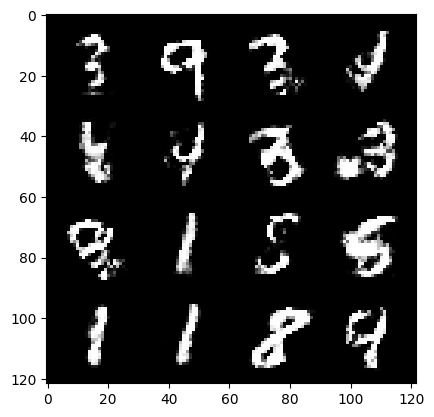

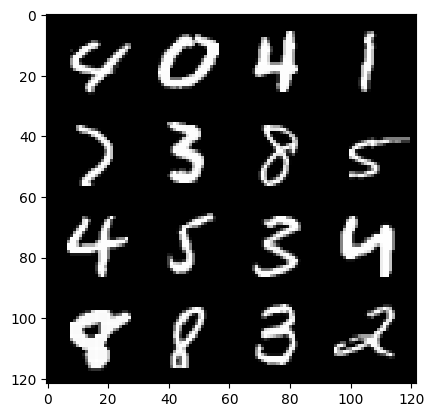

 45%|██████████████████████████████████████████████████████████████████████████▏                                                                                         | 212/469 [00:05<00:07, 36.63it/s]

426: step 200000 / Gen Loss: 0.45940359565615596 / Disc Loss: 0.45940359565615596


 57%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 268/469 [00:06<00:05, 38.66it/s]

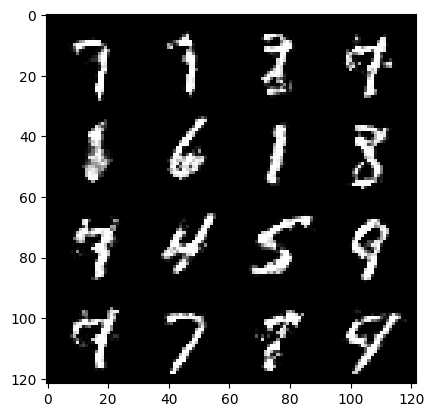

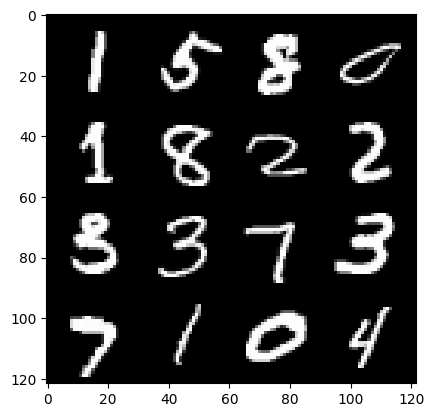

 59%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 276/469 [00:07<00:05, 37.11it/s]

428: step 201000 / Gen Loss: 0.4796034350395205 / Disc Loss: 0.4796034350395205


 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 328/469 [00:08<00:03, 37.44it/s]

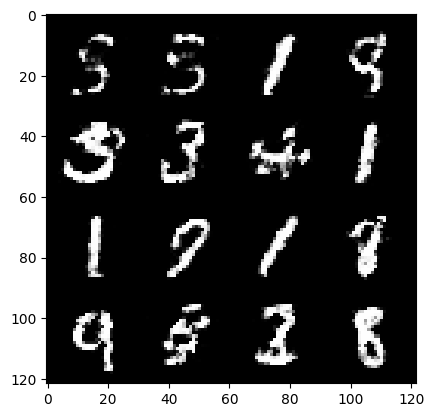

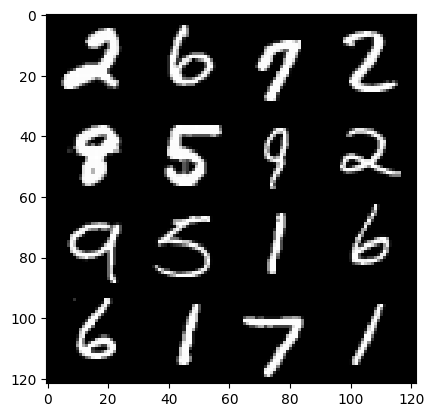

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 336/469 [00:09<00:03, 36.24it/s]

430: step 202000 / Gen Loss: 0.47063790854811627 / Disc Loss: 0.47063790854811627


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 392/469 [00:10<00:02, 38.09it/s]

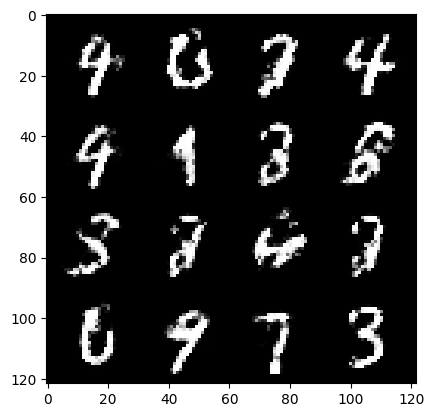

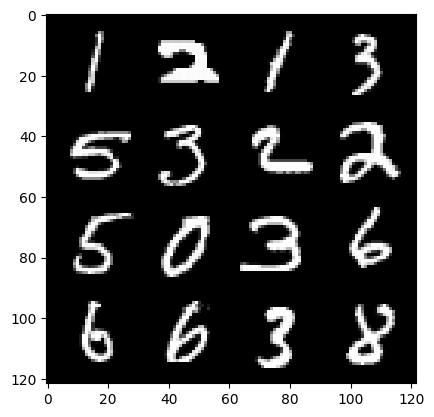

 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 400/469 [00:10<00:01, 37.02it/s]

432: step 203000 / Gen Loss: 0.4654287623763084 / Disc Loss: 0.4654287623763084


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 452/469 [00:11<00:00, 38.55it/s]

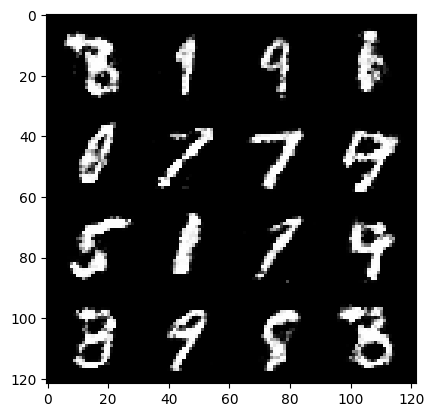

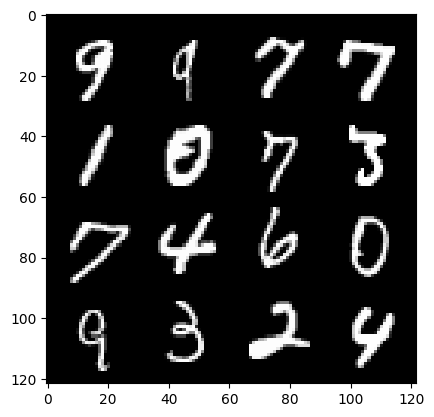

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 460/469 [00:12<00:00, 37.59it/s]

434: step 204000 / Gen Loss: 0.4579731752276424 / Disc Loss: 0.4579731752276424


  9%|███████████████▍                                                                                                                                                     | 44/469 [00:01<00:11, 38.13it/s]

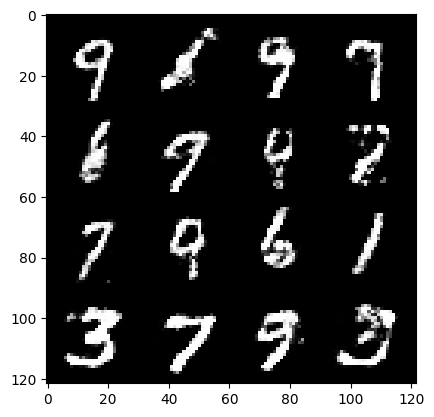

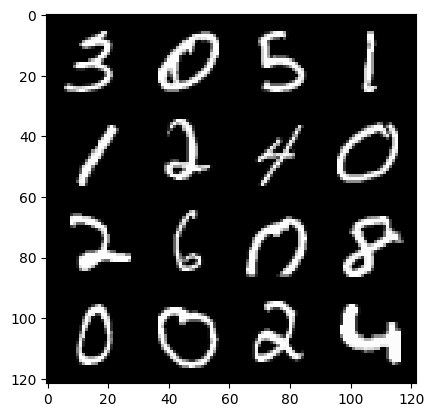

 11%|██████████████████▎                                                                                                                                                  | 52/469 [00:01<00:13, 31.10it/s]

437: step 205000 / Gen Loss: 0.46448586133122505 / Disc Loss: 0.46448586133122505


 23%|█████████████████████████████████████▊                                                                                                                              | 108/469 [00:03<00:10, 35.79it/s]

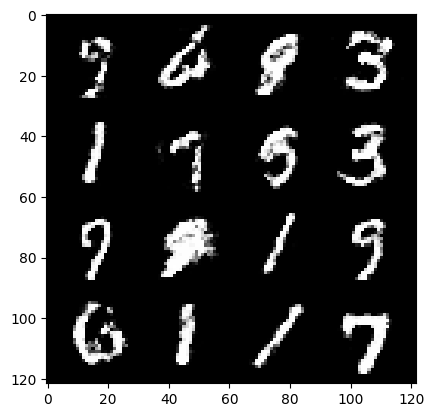

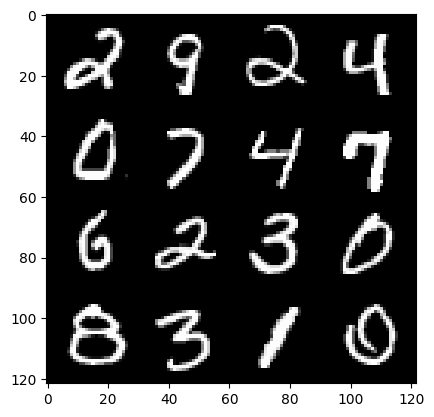

 25%|████████████████████████████████████████▌                                                                                                                           | 116/469 [00:03<00:10, 32.66it/s]

439: step 206000 / Gen Loss: 0.46401361322402973 / Disc Loss: 0.46401361322402973


 36%|██████████████████████████████████████████████████████████▋                                                                                                         | 168/469 [00:04<00:08, 36.90it/s]

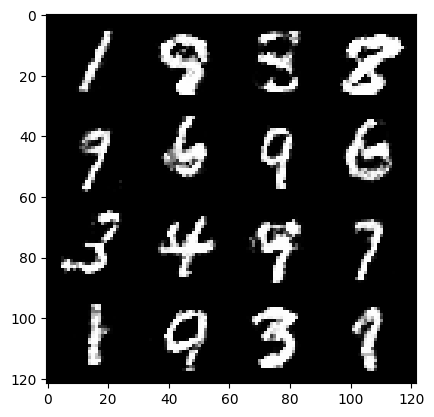

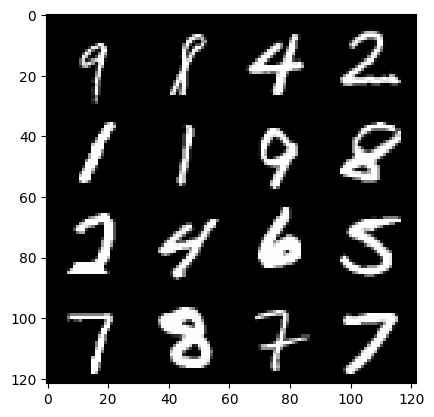

 38%|█████████████████████████████████████████████████████████████▌                                                                                                      | 176/469 [00:05<00:08, 34.68it/s]

441: step 207000 / Gen Loss: 0.46917925226688434 / Disc Loss: 0.46917925226688434


 49%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                  | 232/469 [00:06<00:06, 36.99it/s]

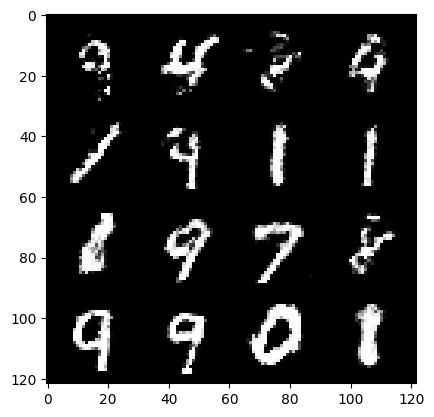

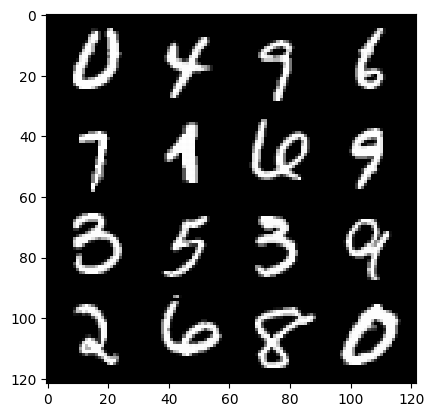

 51%|███████████████████████████████████████████████████████████████████████████████████▉                                                                                | 240/469 [00:06<00:06, 35.34it/s]

443: step 208000 / Gen Loss: 0.4643743131458763 / Disc Loss: 0.4643743131458763


 62%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                              | 292/469 [00:08<00:04, 36.23it/s]

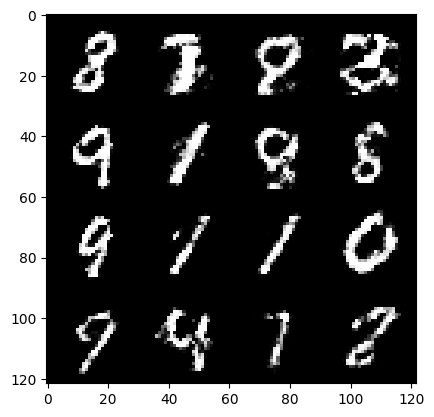

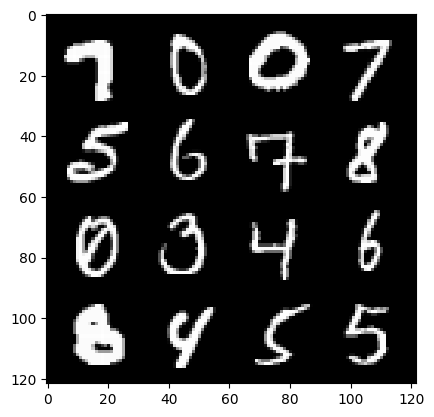

 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 300/469 [00:08<00:04, 34.31it/s]

445: step 209000 / Gen Loss: 0.455639555335045 / Disc Loss: 0.455639555335045


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 356/469 [00:09<00:03, 36.58it/s]

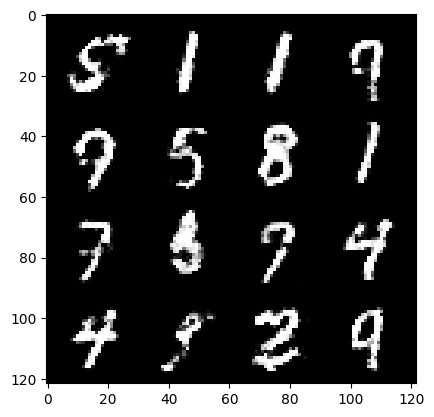

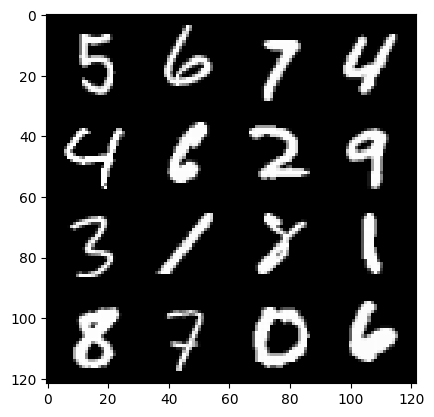

 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 364/469 [00:10<00:02, 35.46it/s]

447: step 210000 / Gen Loss: 0.46631669259071273 / Disc Loss: 0.46631669259071273


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 416/469 [00:11<00:01, 36.74it/s]

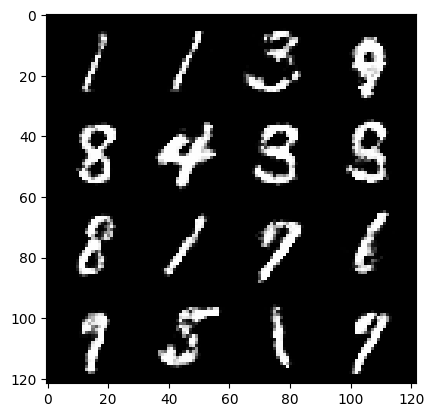

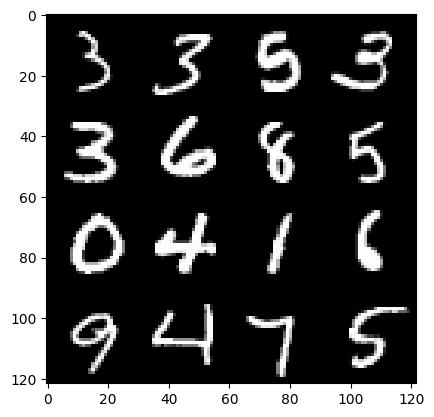

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 424/469 [00:11<00:01, 35.80it/s]

449: step 211000 / Gen Loss: 0.4595449528396128 / Disc Loss: 0.4595449528396128


  3%|████▏                                                                                                                                                                | 12/469 [00:00<00:12, 36.92it/s]

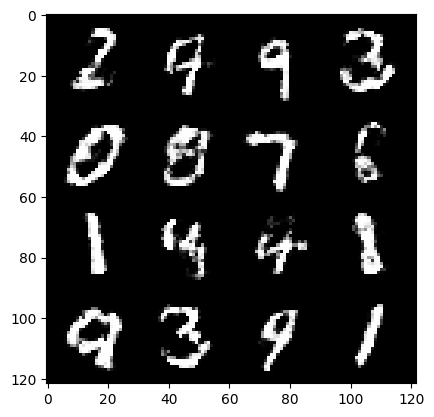

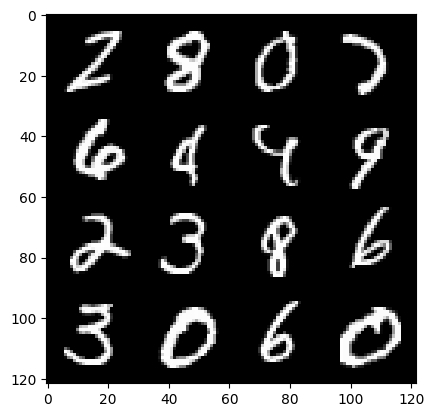

  3%|█████▋                                                                                                                                                               | 16/469 [00:00<00:21, 21.39it/s]

452: step 212000 / Gen Loss: 0.46088371157646163 / Disc Loss: 0.46088371157646163


 15%|█████████████████████████▎                                                                                                                                           | 72/469 [00:01<00:10, 36.96it/s]

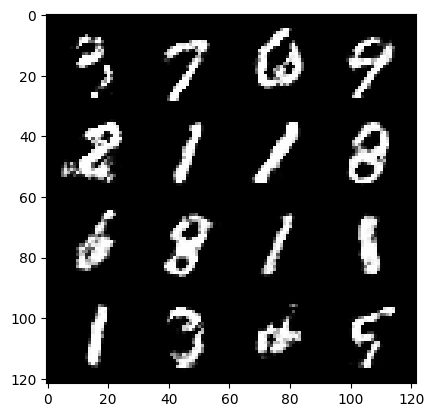

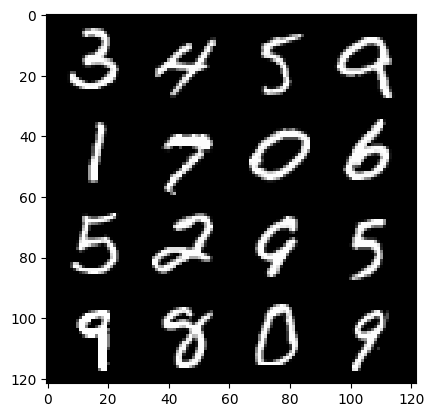

 17%|████████████████████████████▏                                                                                                                                        | 80/469 [00:02<00:12, 32.34it/s]

454: step 213000 / Gen Loss: 0.4631054399311539 / Disc Loss: 0.4631054399311539


 29%|███████████████████████████████████████████████▌                                                                                                                    | 136/469 [00:03<00:09, 36.32it/s]

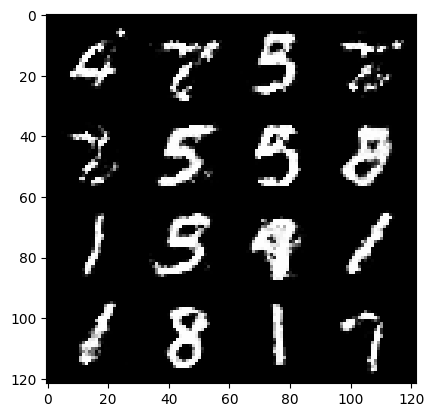

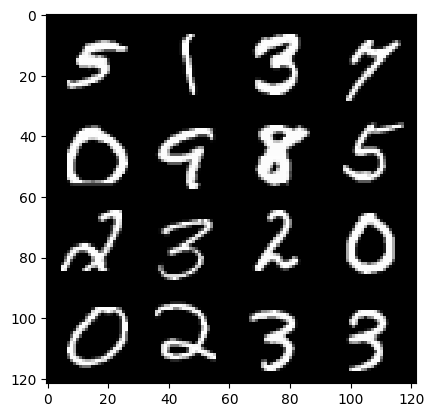

 30%|████████████████████████████████████████████████▉                                                                                                                   | 140/469 [00:04<00:09, 33.65it/s]

456: step 214000 / Gen Loss: 0.44275948646664626 / Disc Loss: 0.44275948646664626


 42%|████████████████████████████████████████████████████████████████████▌                                                                                               | 196/469 [00:05<00:07, 36.75it/s]

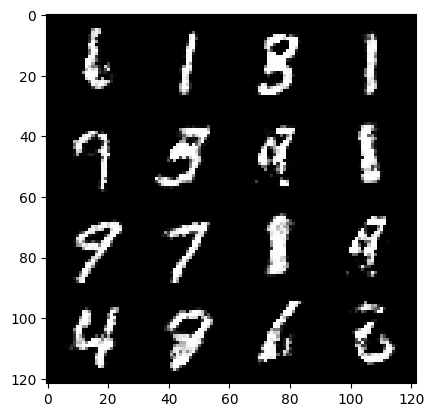

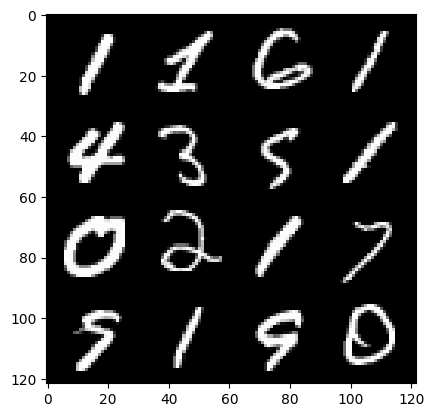

 43%|███████████████████████████████████████████████████████████████████████▎                                                                                            | 204/469 [00:05<00:07, 34.90it/s]

458: step 215000 / Gen Loss: 0.4544763231873515 / Disc Loss: 0.4544763231873515


 55%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 260/469 [00:07<00:05, 35.69it/s]

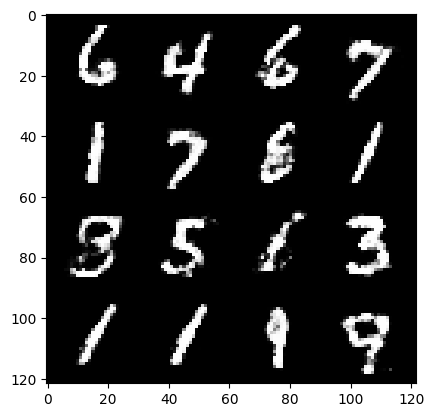

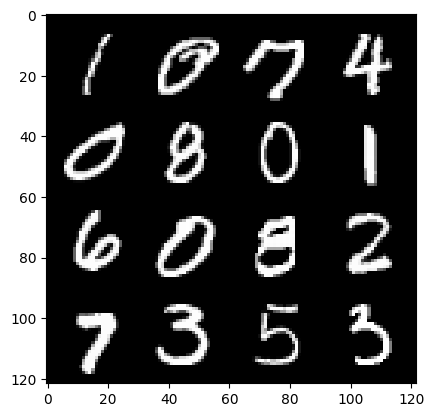

 56%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 264/469 [00:07<00:06, 34.10it/s]

460: step 216000 / Gen Loss: 0.4467178536355493 / Disc Loss: 0.4467178536355493


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                    | 320/469 [00:08<00:03, 37.33it/s]

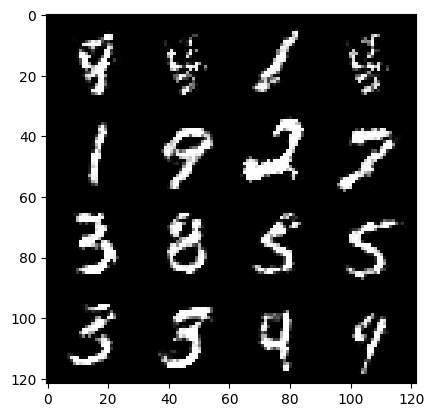

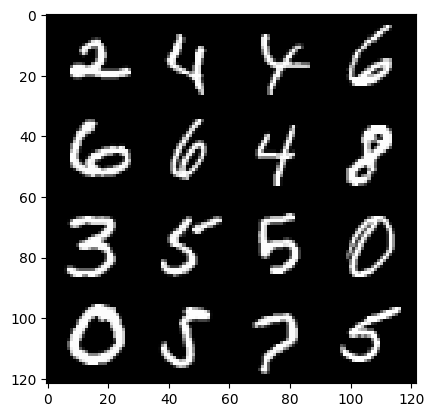

 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 328/469 [00:09<00:03, 36.04it/s]

462: step 217000 / Gen Loss: 0.46432169592380484 / Disc Loss: 0.46432169592380484


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 384/469 [00:10<00:02, 37.34it/s]

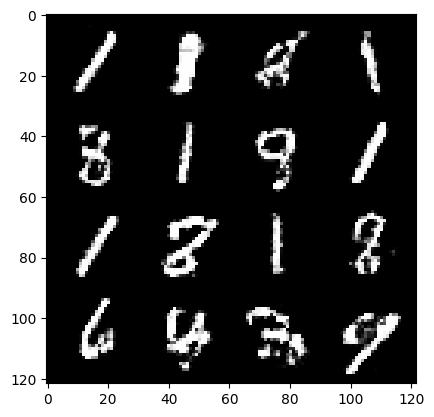

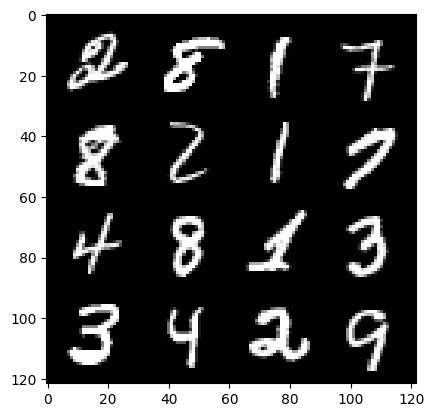

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 392/469 [00:10<00:02, 36.10it/s]

464: step 218000 / Gen Loss: 0.46138304513692846 / Disc Loss: 0.46138304513692846


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 444/469 [00:11<00:00, 37.17it/s]

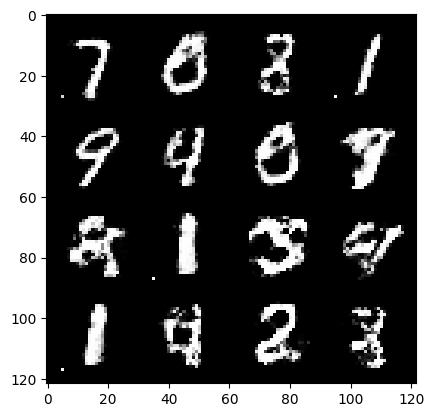

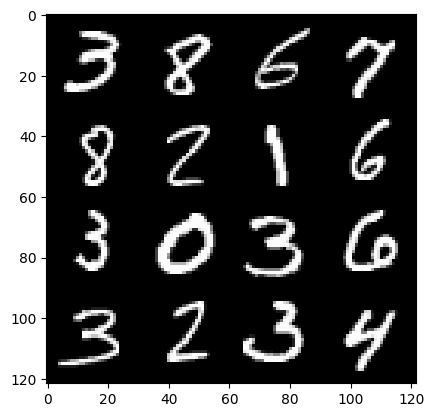

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 448/469 [00:25<00:01, 17.82it/s]

466: step 219000 / Gen Loss: 0.5164762380719183 / Disc Loss: 0.5164762380719183


  8%|████████████▋                                                                                                                                                        | 36/469 [00:00<00:11, 38.10it/s]

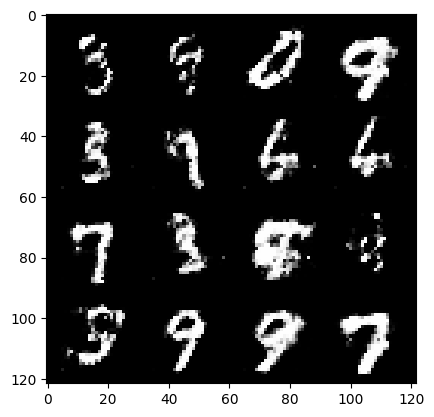

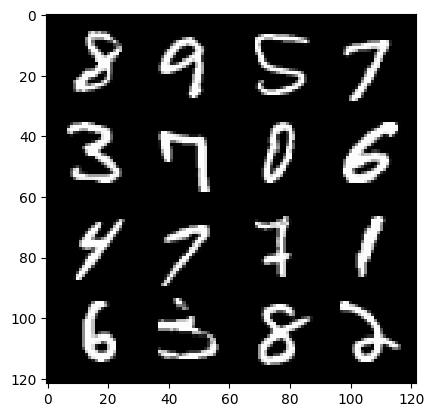

  9%|███████████████▍                                                                                                                                                     | 44/469 [00:01<00:15, 26.67it/s]

469: step 220000 / Gen Loss: 0.5185031758248807 / Disc Loss: 0.5185031758248807


 21%|██████████████████████████████████▉                                                                                                                                 | 100/469 [00:02<00:09, 37.29it/s]

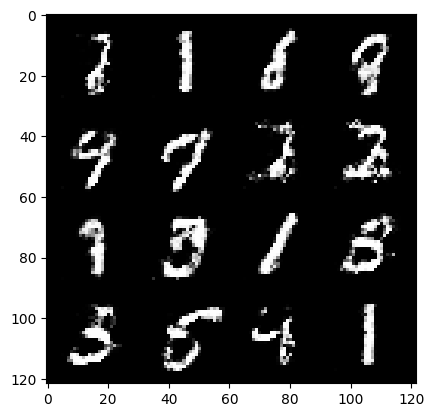

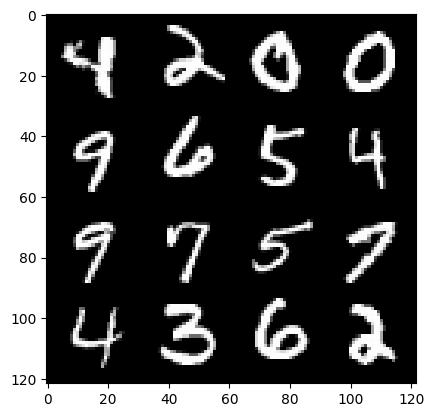

 23%|█████████████████████████████████████▊                                                                                                                              | 108/469 [00:03<00:10, 33.83it/s]

471: step 221000 / Gen Loss: 0.47079555934667683 / Disc Loss: 0.47079555934667683


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 452/469 [00:12<00:00, 36.17it/s]

RuntimeError: CUDA error: unknown error
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [131]:
## 60000 images / 128 images per batch = ~469 steps per epoch
# each step is going to process 128 images = size of the batch (except in last step)

for epoch in range(epochs):
    for real, _ in tqdm(dataloader):
        ## discriminator training
        disc_opt.zero_grad()

        cur_bs = len(real) # real: 128 x 1 x 28 x 28
        real = real.view(cur_bs, -1) # 128 x 784
        real = real.to(device)

        disc_loss = calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)

        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        ## generator training
        gen_opt.zero_grad()
        gen_loss = calc_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()

        ## visualization & stats
        mean_disc_loss += disc_loss.item()/info_step
        mean_gen_loss += disc_loss.item()/info_step

        if cur_step % info_step == 0 and cur_step > 0:
            fake_noise = gen_noise(cur_bs, z_dim)
            fake = gen(fake_noise)
            show(fake)
            save_img(fake)
            show(real)
            print(f"{epoch}: step {cur_step} / Gen Loss: {mean_gen_loss} / Disc Loss: {mean_disc_loss}")
            mean_gen_loss, mean_disc_loss = 0,0

        cur_step += 1